# Load Narrative Aggregates

In [2]:
# This notebook generates publication-quality plots from the pre-computed monthly aggregates.
# These complement the interactive Streamlit dashboards with static, paper-ready visualizations.

# %%
import os
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime
import seaborn as sns
from dotenv import load_dotenv

load_dotenv()

# Set publication-quality plot defaults
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 10
plt.rcParams['font.family'] = 'serif'
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['xtick.labelsize'] = 9
plt.rcParams['ytick.labelsize'] = 9
plt.rcParams['legend.fontsize'] = 9
plt.rcParams['figure.titlesize'] = 13

# Color palette for domains
DOMAIN_COLORS = {
    'UK Parliament (Con)': '#0087DC',  # Conservative blue
    'UK Parliament (Lab)': '#E4003B',  # Labour red
    'US Congress (Rep)': '#E81B23',    # Republican red
    'US Congress (Dem)': '#0015BC',    # Democrat blue
}

# Define domains to exclude (parliamentary/congressional)
EXCLUDE_DOMAINS = [
    'UK Parliament (Lab)',
    'UK Parliament (Con)',
    'UK Parliament (Reform)',
    'UK Parliament (LD)',
    'UK Parliament (SNP)',
    'UK Parliament (Green)',
    'UK Parliament (All)',
    'US Congress (Rep)',
    'US Congress (Dem)',
    'US Congress (All)'
]


# Output directory for plots
OUTPUT_DIR = os.path.expanduser("./plots_for_paper")

# Data directory
DATA_DIR = os.path.expanduser("./data")

# %%
# Load monthly aggregates
STANCE_PATH = os.path.join(DATA_DIR, "stance_monthly.parquet")
THEMES_PATH = os.path.join(DATA_DIR, "themes_monthly.parquet")
MESO_PATH   = os.path.join(DATA_DIR, "meso_monthly.parquet")
TOTAL_DOCS_PATH = os.path.join(DATA_DIR, "total_docs.parquet")


def load_parquet(fp: str) -> pd.DataFrame:
    """Load parquet file and prepare columns"""
    if not os.path.exists(fp):
        print(f"Warning: {fp} not found")
        return pd.DataFrame()
    
    df = pd.read_parquet(fp)
    
    # Convert month string to datetime
    if "month" in df.columns:
        df["month"] = pd.to_datetime(df["month"] + "-01", errors="coerce")
    
    # Ensure categorical columns are strings
    for col in ["source_domain", "model", "stance", "theme", "meso_narrative"]:
        if col in df.columns:
            df[col] = df[col].fillna("").astype(str)
    
    # Ensure count is numeric
    if "count" in df.columns:
        df["count"] = pd.to_numeric(df["count"], errors="coerce").fillna(0).astype(int)
    
    return df

stance_df = load_parquet(STANCE_PATH)
themes_df = load_parquet(THEMES_PATH)
meso_df = load_parquet(MESO_PATH)
total_docs_df = load_parquet(TOTAL_DOCS_PATH)

print(f"Loaded data:")
print(f"  Stance: {len(stance_df):,} rows")
print(f"  Themes: {len(themes_df):,} rows")
print(f"  Meso: {len(meso_df):,} rows")
print(f"  Total Docs: {len(total_docs_df):,} rows")

Loaded data:
  Stance: 179,923 rows
  Themes: 1,924,234 rows
  Meso: 3,688,603 rows
  Total Docs: 3,183 rows


In [ ]:
stance_df

,month,model,version,source_domain,stance,count
0,1807-01-01,Ensemble,1,UK Parliament (All),NEUTRAL,1
1,1807-01-01,Ensemble,1,UK Parliament (Con),NEUTRAL,1
2,1807-01-01,Kimi-Linear-48B-A3B-Instruct,1,UK Parliament (All),NEUTRAL,1
3,1807-01-01,Kimi-Linear-48B-A3B-Instruct,1,UK Parliament (Con),NEUTRAL,1
4,1807-01-01,Qwen3-32B,1,UK Parliament (All),IRRELEVANT,1
...,...,...,...,...,...,...
179918,2026-03-01,gpt-oss-20b,1,US Congress (Dem),OPEN,5
179919,2026-03-01,gpt-oss-20b,1,US Congress (Dem),RESTRICTIVE,19
179920,2026-03-01,gpt-oss-20b,1,US Congress (Rep),NEUTRAL,1
179921,2026-03-01,gpt-oss-20b,1,US Congress (Rep),OPEN,2


In [2]:
total_docs_df

""


# Frequency Chart

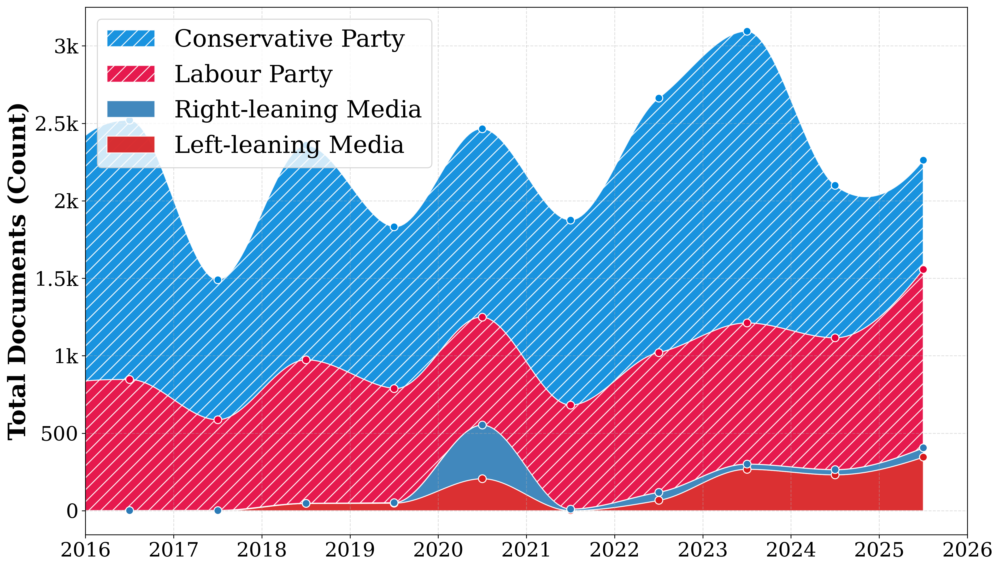

In [ ]:
# ==========================================
# Corpus Total Frequency (Continuous Stacked)
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy.interpolate import PchipInterpolator

def format_counts(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:g}m'
    elif x >= 1e3:
        return f'{x*1e-3:g}k'
    else:
        return f'{x:g}'

MODEL = "Ensemble"
START_DATE = "2015-01-01"
END_DATE = "2025-12-31"

UK_LEFT_WING = [
    "theguardian.com",
    "mirror.co.uk",
    "independent.co.uk",
    "huffingtonpost.co.uk",
    "dailyrecord.co.uk",
    "thenational.scot",
    "heraldscotland.com"
]
UK_RIGHT_WING = [
    "telegraph.co.uk",
    "dailymail.co.uk",
    "express.co.uk",
    "thesun.co.uk",
    "spectator.co.uk",
    "thetimes.co.uk",
    "thescottishsun.co.uk"
]
UK_LABOUR = ["UK Parliament (Lab)"]
UK_CONSERVATIVE = ["UK Parliament (Con)"]

def get_domain_total_frequency(domains):
    """Fetches the total frequency of all migration-related documents for given domains via stance_df."""
    s = stance_df[
        (stance_df["model"] == MODEL) &
        (stance_df["source_domain"].isin(domains)) &
        (stance_df["month"] >= pd.to_datetime(START_DATE)) &
        (stance_df["month"] <= pd.to_datetime(END_DATE)) &
        (stance_df["stance"].isin(["OPEN", "RESTRICTIVE", "NEUTRAL"]))
    ].copy()
    
    if s.empty: 
        return pd.DataFrame(columns=["year", "total"])
        
    s["year"] = s["month"].dt.year
    return s.groupby("year", as_index=False)["count"].sum().rename(columns={"count": "total"})

# Fetch counts for each group
df_freq_left = get_domain_total_frequency(UK_LEFT_WING)
df_freq_right = get_domain_total_frequency(UK_RIGHT_WING)
df_freq_lab = get_domain_total_frequency(UK_LABOUR)
df_freq_con = get_domain_total_frequency(UK_CONSERVATIVE)

years = np.arange(2015, 2026)
x_points = years + 0.5  # shift to align halfway through the year as done in other temporal charts

def extract_array(df_freq):
    """Aligns the sums cleanly to the 2016-2026 array."""
    if df_freq.empty:
        return np.zeros(len(years))
    return df_freq.set_index("year").reindex(years, fill_value=0)["total"].values

arr_left = extract_array(df_freq_left)
arr_right = extract_array(df_freq_right)
arr_lab = extract_array(df_freq_lab)
arr_con = extract_array(df_freq_con)

# Smooth lines for stackplot
if len(x_points) >= 4:
    x_smooth = np.linspace(x_points.min(), x_points.max(), 300)
    y_left_smooth = np.maximum(PchipInterpolator(x_points, arr_left)(x_smooth), 0)
    y_right_smooth = np.maximum(PchipInterpolator(x_points, arr_right)(x_smooth), 0)
    y_lab_smooth = np.maximum(PchipInterpolator(x_points, arr_lab)(x_smooth), 0)
    y_con_smooth = np.maximum(PchipInterpolator(x_points, arr_con)(x_smooth), 0)
else:
    x_smooth = x_points
    y_left_smooth = np.maximum(arr_left, 0)
    y_right_smooth = np.maximum(arr_right, 0)
    y_lab_smooth = np.maximum(arr_lab, 0)
    y_con_smooth = np.maximum(arr_con, 0)

# ==========================================
# Plot Configuration
# ==========================================
fig, ax = plt.subplots(figsize=(14, 8))

# Matplotlib stackplot lets you format individual layers with hatches, but it's tricky with ax.stackplot natively. 
# We'll build the layers cumulatively to properly apply the hatching to the parliament bands.
y_sum_1 = y_left_smooth
y_sum_2 = y_sum_1 + y_right_smooth
y_sum_3 = y_sum_2 + y_lab_smooth
y_sum_4 = y_sum_3 + y_con_smooth

# Plot the fills incrementally from the bottom up
ax.fill_between(x_smooth, 0, y_sum_1, label="Left-leaning Media", color='#d7191c', alpha=0.9, linewidth=1, edgecolor="white")
ax.fill_between(x_smooth, y_sum_1, y_sum_2, label="Right-leaning Media", color='#2c7bb6', alpha=0.9, linewidth=1, edgecolor="white")

# Add hatching to parliament areas
ax.fill_between(x_smooth, y_sum_2, y_sum_3, label="Labour Party", color='#E4003B', alpha=0.9, hatch='//', linewidth=1, edgecolor="white")
ax.fill_between(x_smooth, y_sum_3, y_sum_4, label="Conservative Party", color='#0087DC', alpha=0.9, hatch='//', linewidth=1, edgecolor="white")

# Calculate discrete data points for markers
y_pts_1 = arr_left
y_pts_2 = y_pts_1 + arr_right
y_pts_3 = y_pts_2 + arr_lab
y_pts_4 = y_pts_3 + arr_con

# Plot scatter markers at exact data nodes 
# Filtering the `years` range to mostly what's visible inside xlim limits to look cleaner
ax.scatter(x_points, y_pts_1, color='#d7191c', edgecolor="white", s=60, zorder=3)
ax.scatter(x_points, y_pts_2, color='#2c7bb6', edgecolor="white", s=60, zorder=3)
ax.scatter(x_points, y_pts_3, color='#E4003B', edgecolor="white", s=60, zorder=3)
ax.scatter(x_points, y_pts_4, color='#0087DC', edgecolor="white", s=60, zorder=3)

# Axes formatting
# ax.set_xlabel("Year", fontsize=16)
ax.set_ylabel("Total Documents (Count)", fontsize=24, color="black", fontweight="bold")
ax.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))
ax.tick_params(axis='both', which='major', labelsize=20)

ax.set_xticks(np.arange(2016, 2027))
ax.set_xlim(2016, 2026)
ax.grid(True, linestyle='--', alpha=0.4)

# Legend Configuration
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1], fontsize=24, loc="upper left")

# Title removed dynamically...

output_path = os.path.join(OUTPUT_DIR, "temporal_frequency.png")
os.makedirs(os.path.dirname(output_path), exist_ok=True)

plt.tight_layout()
# plt.savefig(output_path, dpi=350, bbox_inches='tight')
plt.show()

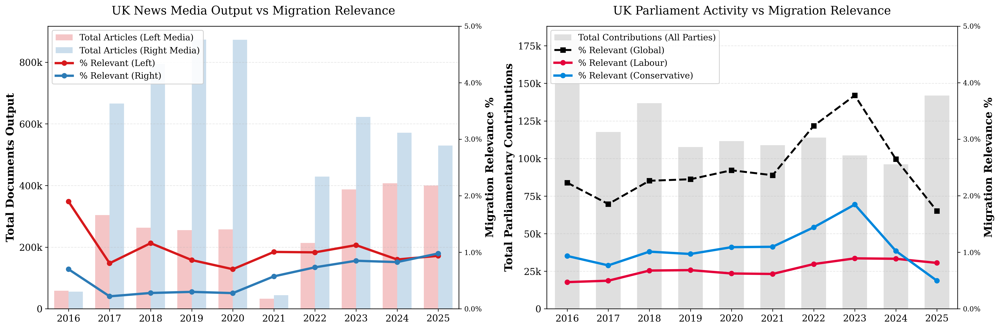

In [8]:
# ==========================================
# Yearly Frequency & Relevance Context Charts
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy.interpolate import PchipInterpolator

MODEL = "Ensemble"
START_DATE = "2016-01-01"
END_DATE = "2025-12-31"

UK_LEFT_WING = [
    "theguardian.com", "mirror.co.uk", "independent.co.uk",
    "huffingtonpost.co.uk", "dailyrecord.co.uk", "thenational.scot", "heraldscotland.com"
]
UK_RIGHT_WING = [
    "telegraph.co.uk", "dailymail.co.uk", "express.co.uk",
    "thesun.co.uk", "spectator.co.uk", "thetimes.co.uk", "thescottishsun.co.uk"
]

def format_counts(x, pos):
    if x >= 1e6: return f'{x*1e-6:g}m'
    elif x >= 1e3: return f'{x*1e-3:g}k'
    return f'{x:g}'

# --- 1. Load and aggregate Totals (Denominators) ---
total_docs_df = pd.read_parquet(os.path.join(DATA_DIR, "total_docs.parquet"))
total_docs_df["start_time"] = pd.to_datetime(total_docs_df["start_time"], errors="coerce")
total_docs_df["year"] = total_docs_df["start_time"].dt.year
yd = total_docs_df.groupby(["year", "document_type"], as_index=False)["total_count"].sum()

tot_left = yd[yd["document_type"].isin(UK_LEFT_WING)].groupby("year")["total_count"].sum()
tot_right = yd[yd["document_type"].isin(UK_RIGHT_WING)].groupby("year")["total_count"].sum()
tot_parl = yd[yd["document_type"] == "uk_parliamentary_contribution"].groupby("year")["total_count"].sum()

# --- 2. Load and aggregate Relevant Counts (Numerators) ---
s_base = stance_df[
    (stance_df["model"] == MODEL) &
    (stance_df["month"] >= pd.to_datetime(START_DATE)) &
    (stance_df["month"] <= pd.to_datetime(END_DATE)) &
    (stance_df["stance"].isin(["OPEN", "RESTRICTIVE", "NEUTRAL", "MIXED"]))
].copy()
s_base["year"] = s_base["month"].dt.year
ys = s_base.groupby(["year", "source_domain"], as_index=False)["count"].sum()

rel_left = ys[ys["source_domain"].isin(UK_LEFT_WING)].groupby("year")["count"].sum()
rel_right = ys[ys["source_domain"].isin(UK_RIGHT_WING)].groupby("year")["count"].sum()
rel_parl_all = ys[ys["source_domain"] == "UK Parliament (All)"].groupby("year")["count"].sum()
rel_parl_lab = ys[ys["source_domain"] == "UK Parliament (Lab)"].groupby("year")["count"].sum()
rel_parl_con = ys[ys["source_domain"] == "UK Parliament (Con)"].groupby("year")["count"].sum()

# --- 3. Build unified dataframe for 2016-2025 ---
years = np.arange(2016, 2026)
df_ctx = pd.DataFrame({"year": years}).set_index("year")

df_ctx["tot_left"] = tot_left
df_ctx["tot_right"] = tot_right
df_ctx["tot_parl"] = tot_parl

df_ctx["rel_left"] = rel_left
df_ctx["rel_right"] = rel_right
df_ctx["rel_parl_all"] = rel_parl_all
df_ctx["rel_parl_lab"] = rel_parl_lab
df_ctx["rel_parl_con"] = rel_parl_con

df_ctx = df_ctx.fillna(0)

# Calculate percentages (Relevance Intensity)
df_ctx["pct_left"] = np.where(df_ctx["tot_left"] > 0, df_ctx["rel_left"] / df_ctx["tot_left"], 0)
df_ctx["pct_right"] = np.where(df_ctx["tot_right"] > 0, df_ctx["rel_right"] / df_ctx["tot_right"], 0)
df_ctx["pct_parl_all"] = np.where(df_ctx["tot_parl"] > 0, df_ctx["rel_parl_all"] / df_ctx["tot_parl"], 0)
df_ctx["pct_parl_lab"] = np.where(df_ctx["tot_parl"] > 0, df_ctx["rel_parl_lab"] / df_ctx["tot_parl"], 0)
df_ctx["pct_parl_con"] = np.where(df_ctx["tot_parl"] > 0, df_ctx["rel_parl_con"] / df_ctx["tot_parl"], 0)

# --- 4. Plotting ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
fig.patch.set_facecolor('#ffffff')

for ax in [ax1, ax2]:
    ax.set_facecolor('#ffffff')
    ax.grid(True, axis='y', linestyle='--', alpha=0.3)
    ax.set_xlim(2015.5, 2025.5)
    ax.set_xticks(years)
    ax.tick_params(axis='x', labelsize=12)

# ================= CHART 1: MEDIA =================
x = df_ctx.index.values
bar_width = 0.35

# Bar Chart (Totals)
ax1.bar(x - bar_width/2, df_ctx["tot_left"], width=bar_width, color='#d7191c', alpha=0.25, label="Total Articles (Left Media)")
ax1.bar(x + bar_width/2, df_ctx["tot_right"], width=bar_width, color='#2c7bb6', alpha=0.25, label="Total Articles (Right Media)")
ax1.set_ylabel("Total Documents Output", fontsize=14, fontweight="bold")
ax1.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))
ax1.tick_params(axis='y', labelsize=12)

# Line Chart (Relevance %)
ax1_line = ax1.twinx()
ax1_line.plot(x, df_ctx["pct_left"], color='#d7191c', marker='o', linewidth=3, label="% Relevant (Left)")
ax1_line.plot(x, df_ctx["pct_right"], color='#2c7bb6', marker='o', linewidth=3, label="% Relevant (Right)")
ax1_line.set_ylabel("Migration Relevance %", fontsize=14, fontweight="bold")
ax1_line.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0, decimals=1))
ax1_line.set_ylim(0, max(df_ctx[["pct_left", "pct_right"]].max().max() * 1.2, 0.05))

# Combine Legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_1b, labels_1b = ax1_line.get_legend_handles_labels()
ax1.legend(lines_1 + lines_1b, labels_1 + labels_1b, loc="upper left", fontsize=11, framealpha=0.9)
ax1.set_title("UK News Media Output vs Migration Relevance", fontsize=15, pad=15)


# ================= CHART 2: PARLIAMENT =================
# Bar Chart (Totals)
ax2.bar(x, df_ctx["tot_parl"], width=0.6, color='gray', alpha=0.25, label="Total Contributions (All Parties)")
ax2.set_ylabel("Total Parliamentary Contributions", fontsize=14, fontweight="bold")
ax2.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))
ax2.tick_params(axis='y', labelsize=12)

# Line Chart (Relevance %)
ax2_line = ax2.twinx()
ax2_line.plot(x, df_ctx["pct_parl_all"], color='black', linestyle='--', marker='s', linewidth=2.5, label="% Relevant (Global)")
ax2_line.plot(x, df_ctx["pct_parl_lab"], color='#E4003B', marker='o', linewidth=3, label="% Relevant (Labour)")
ax2_line.plot(x, df_ctx["pct_parl_con"], color='#0087DC', marker='o', linewidth=3, label="% Relevant (Conservative)")

ax2_line.set_ylabel("Migration Relevance %", fontsize=14, fontweight="bold")
ax2_line.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0, decimals=1))
ax2_line.set_ylim(0, max(df_ctx[["pct_parl_all", "pct_parl_lab", "pct_parl_con"]].max().max() * 1.2, 0.05))

# Combine Legends
lines_2, labels_2 = ax2.get_legend_handles_labels()
lines_2b, labels_2b = ax2_line.get_legend_handles_labels()
ax2.legend(lines_2 + lines_2b, labels_2 + labels_2b, loc="upper left", fontsize=11, framealpha=0.9)
ax2.set_title("UK Parliament Activity vs Migration Relevance", fontsize=15, pad=15)

plt.tight_layout()

# Save
output_path = os.path.join(OUTPUT_DIR, "context_temporal_frequency.png")
os.makedirs(os.path.dirname(output_path), exist_ok=True)
# plt.savefig(output_path, dpi=350, bbox_inches='tight')

plt.show()

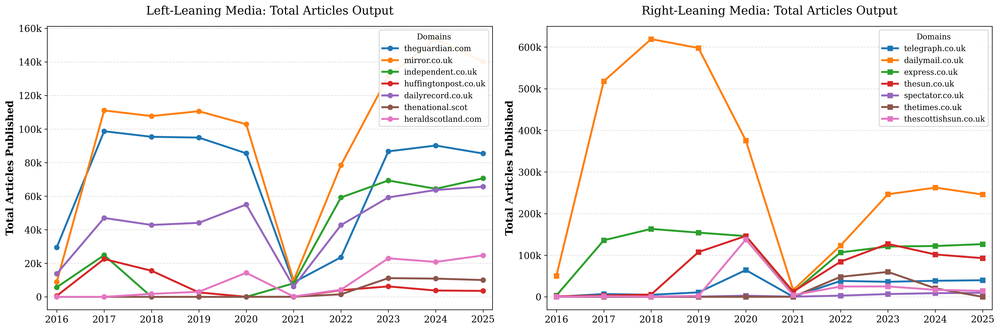

In [4]:
# ==========================================
# Total Articles Per Domain Context Chart
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

def format_counts(x, pos):
    if x >= 1e6: return f'{x*1e-6:g}m'
    elif x >= 1e3: return f'{x*1e-3:g}k'
    return f'{x:g}'

UK_LEFT_WING = [
    "theguardian.com", "mirror.co.uk", "independent.co.uk",
    "huffingtonpost.co.uk", "dailyrecord.co.uk", "thenational.scot", "heraldscotland.com"
]
UK_RIGHT_WING = [
    "telegraph.co.uk", "dailymail.co.uk", "express.co.uk",
    "thesun.co.uk", "spectator.co.uk", "thetimes.co.uk", "thescottishsun.co.uk"
]

# --- 1. Load and Aggregate Totals ---
total_docs_df = pd.read_parquet(os.path.join(DATA_DIR, "total_docs.parquet"))
total_docs_df["start_time"] = pd.to_datetime(total_docs_df["start_time"], errors="coerce")
total_docs_df["year"] = total_docs_df["start_time"].dt.year

yd = total_docs_df.groupby(["year", "document_type"], as_index=False)["total_count"].sum()
# Filter for 2016 to 2025
yd = yd[(yd["year"] >= 2016) & (yd["year"] <= 2025)]

years = np.arange(2016, 2026)

# --- 2. Plotting ---
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
fig.patch.set_facecolor('#ffffff')

# Generate highly distinct categorical colors
colors_distinct = plt.cm.tab10.colors

# Left-Wing Domains
for i, dom in enumerate(UK_LEFT_WING):
    d = yd[yd["document_type"] == dom].set_index("year").reindex(years, fill_value=0)
    ax1.plot(years, d["total_count"], marker='o', linewidth=2.5, color=colors_distinct[i % len(colors_distinct)], label=dom)

# Right-Wing Domains
for i, dom in enumerate(UK_RIGHT_WING):
    d = yd[yd["document_type"] == dom].set_index("year").reindex(years, fill_value=0)
    ax2.plot(years, d["total_count"], marker='s', linewidth=2.5, color=colors_distinct[i % len(colors_distinct)], label=dom)

# Shared Formatting
for ax, title in zip([ax1, ax2], ["Left-Leaning Media: Total Articles Output", "Right-Leaning Media: Total Articles Output"]):
    ax.set_facecolor('#ffffff')
    ax.grid(True, axis='y', linestyle='--', alpha=0.4)
    ax.set_xlim(2015.8, 2025.2)
    ax.set_xticks(years)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))
    ax.set_ylabel("Total Articles Published", fontsize=13, fontweight="bold")
    ax.set_title(title, fontsize=15, pad=15)
    
    # Legend formatting
    ax.legend(fontsize=10, loc="upper right", framealpha=0.9, title="Domains")

plt.tight_layout()

# Save
output_path = os.path.join(OUTPUT_DIR, "total_articles_per_domain.png")
os.makedirs(os.path.dirname(output_path), exist_ok=True)
# plt.savefig(output_path, dpi=350, bbox_inches='tight')

plt.show()

# Temporal Stance Evolution

In [2]:
# %%
import numpy as np


# %%
def compute_stance_score(df: pd.DataFrame, model: str, domains: list, 
                         start_date: str = "1950-01-01", 
                         end_date: str = "2026-12-31") -> pd.DataFrame:
    """
    Compute stance score time series for specified domains.
    
    Parameters
    ----------
    df : DataFrame with columns [month, model, source_domain, stance, count]
    model : str, model name to filter (e.g., "Ensemble")
    domains : list of str, source domains to include
    start_date, end_date : date range filter
    
    Returns
    -------
    DataFrame with columns [month, source_domain, stance_score, OPEN, RESTRICTIVE, NEUTRAL, total]
    """
    # Filter by model and date range
    filtered = df[
        (df["model"] == model) &
        (df["month"] >= pd.to_datetime(start_date)) &
        (df["month"] <= pd.to_datetime(end_date)) &
        (df["source_domain"].isin(domains))
    ].copy()
    
    if filtered.empty:
        print(f"Warning: No data for model={model}, domains={domains}")
        return pd.DataFrame()
    
    # Aggregate by month, domain, stance
    agg = filtered.groupby(["month", "source_domain", "stance"], as_index=False)["count"].sum()
    
    # Pivot to get OPEN, RESTRICTIVE, NEUTRAL as columns
    pivot = agg.pivot_table(
        index=["month", "source_domain"],
        columns="stance",
        values="count",
        fill_value=0
    ).reset_index()
    
    # Ensure required stance columns exist
    for col in ["OPEN", "RESTRICTIVE", "NEUTRAL"]:
        if col not in pivot.columns:
            pivot[col] = 0
    
    # Compute total and stance score
    pivot["total"] = pivot["OPEN"] + pivot["RESTRICTIVE"] + pivot["NEUTRAL"]
    pivot["stance_score"] = pivot.apply(
        lambda r: (r["OPEN"] - r["RESTRICTIVE"]) / r["total"] if r["total"] > 0 else None,
        axis=1
    )
    
    # Drop rows with no score
    result = pivot.dropna(subset=["stance_score"]).copy()
    
    return result

# %%
# Compute stance scores for the four parliamentary domains using Ensemble model
SELECTED_DOMAINS = [
    'UK Parliament (Lab)',
    'UK Parliament (Con)',
    'UK Parliament (Reform)',
    'UK Parliament (LD)',
    'UK Parliament (SNP)',
    'UK Parliament (Green)',
    'UK Parliament (All)',
    'US Congress (Rep)',
    'US Congress (Dem)',
    'US Congress (All)'
]

stance_scores = compute_stance_score(
    stance_df,
    model="Ensemble",
    domains=SELECTED_DOMAINS,
    start_date="1950-01-01",
    end_date="2026-12-31"
)

print(f"Computed {len(stance_scores)} month-domain stance scores")
if not stance_scores.empty:
    print(f"Date range: {stance_scores['month'].min()} to {stance_scores['month'].max()}")


# Define UK government periods with Prime Ministers
uk_government_periods = [
    # Conservative periods
    (1951, 1955, "Conservative", "Churchill"),
    (1955, 1957, "Conservative", "Eden"),
    (1957, 1963, "Conservative", "Macmillan"),
    (1963, 1964, "Conservative", "Douglas-Home"),
    (1970, 1974, "Conservative", "Heath"),
    (1979, 1990, "Conservative", "Thatcher"),
    (1990, 1997, "Conservative", "Major"),
    (2010, 2016, "Conservative", "Cameron"),
    (2016, 2019, "Conservative", "May"),
    (2019, 2022, "Conservative", "Johnson"),
    (2022, 2022, "Conservative", "Truss"),
    (2022, 2024, "Conservative", "Sunak"),
    
    # Labour periods
    (1950, 1951, "Labour", "Attlee"),
    # (1945, 1951, "Labour", "Attlee"),
    (1964, 1970, "Labour", "Wilson"),
    (1974, 1976, "Labour", "Wilson"),
    (1976, 1979, "Labour", "Callaghan"),
    (1997, 2007, "Labour", "Blair"),
    (2007, 2010, "Labour", "Brown"),
    (2024, 2026, "Labour", "Starmer"),
    # (2024, 2025, "Labour", "Starmer"),
]

# Define US presidential periods
us_presidential_periods = [
    # Republican presidents
    # (1945, 1953, "Republican", "Truman"),
    (1950, 1953, "Republican", "Truman"),
    (1953, 1961, "Republican", "Eisenhower"),
    (1969, 1974, "Republican", "Nixon"),
    (1974, 1977, "Republican", "Ford"),
    (1981, 1989, "Republican", "Reagan"),
    (1989, 1993, "Republican", "G.H.W. Bush"),
    (2001, 2009, "Republican", "G.W. Bush"),
    (2017, 2021, "Republican", "Trump"),
    (2025, 2026, "Republican", "Trump"),
    # (2025, 2025, "Republican", "Trump"),
    
    # Democratic presidents
    (1961, 1963, "Democrat", "Kennedy"),
    (1963, 1969, "Democrat", "Johnson"),
    (1977, 1981, "Democrat", "Carter"),
    (1993, 2001, "Democrat", "Clinton"),
    (2009, 2017, "Democrat", "Obama"),
    (2021, 2025, "Democrat", "Biden"),
]

# %%
def aggregate_to_yearly(monthly_df: pd.DataFrame) -> pd.DataFrame:
    """Aggregate monthly stance scores to yearly averages with standard errors"""
    if monthly_df.empty:
        return pd.DataFrame()
    
    monthly_df = monthly_df.copy()
    monthly_df["Year"] = monthly_df["month"].dt.year
    
    # Group by year and source_domain
    yearly = monthly_df.groupby(["Year", "source_domain"]).agg({
        "stance_score": ["mean", "std", "count"]
    }).reset_index()
    
    yearly.columns = ["Year", "source_domain", "mean_score", "std_score", "n_months"]
    
    # Compute standard error (standard deviation of the mean)
    yearly["se_score"] = yearly["std_score"] / np.sqrt(yearly["n_months"])
    
    return yearly

# %%
# Aggregate to yearly data
yearly_stance = aggregate_to_yearly(stance_scores)
print(f"Aggregated to {len(yearly_stance)} yearly data points")



Computed 5421 month-domain stance scores
Date range: 1950-01-01 00:00:00 to 2026-03-01 00:00:00
Aggregated to 580 yearly data points


In [4]:
yearly_stance['source_domain'].value_counts()

source_domain
UK Parliament (All)       77
UK Parliament (Con)       77
UK Parliament (Lab)       77
US Congress (All)         77
US Congress (Rep)         77
US Congress (Dem)         77
UK Parliament (LD)        70
UK Parliament (SNP)       24
UK Parliament (Green)     19
UK Parliament (Reform)     5
Name: count, dtype: int64

### UK Parliament Stance

Saved: ./plots_for_paper/uk_parliament_stance.png


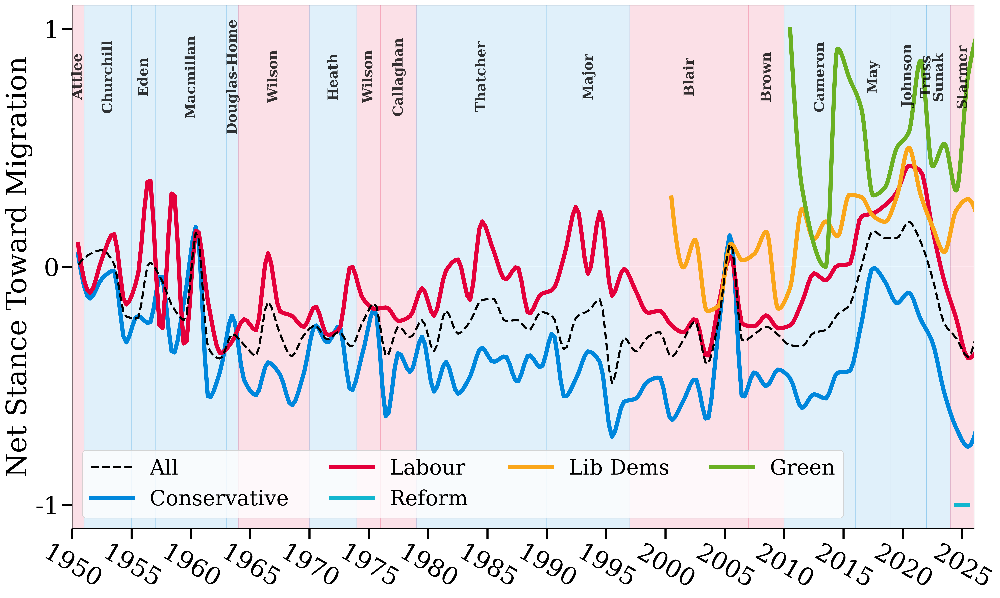

In [4]:
# Create UK Parliament plot
from scipy.interpolate import PchipInterpolator

fig, ax = plt.subplots(figsize=(20, 12))

# Add background colors for UK government periods
for start_year, end_year, party, pm_name in uk_government_periods:
    if start_year >= 1950 and start_year <= 2026:
        if party == "Conservative":
            ax.axvspan(start_year, end_year, alpha=0.12, color='#0087dc', zorder=0)
        elif party == "Labour":
            ax.axvspan(start_year, end_year, alpha=0.12, color='#E4003B', zorder=0)

# Use actual UK Parliament (All) data
uk_all_yearly = yearly_stance[yearly_stance["source_domain"] == "UK Parliament (All)"].sort_values("Year")

# Plot overall UK trend (dashed black line)
if not uk_all_yearly.empty:
    x_points = uk_all_yearly["Year"].values + 0.5
    y_points = uk_all_yearly["mean_score"].values
    if len(x_points) >= 4:
        x_smooth = np.linspace(x_points.min(), x_points.max(), 300)
        y_smooth = PchipInterpolator(x_points, y_points)(x_smooth)
    else:
        x_smooth, y_smooth = x_points, y_points

    ax.plot(
        x_smooth,
        y_smooth,
        linestyle="dashed",
        color="black",
        label="All",
        linewidth=3,
        zorder=5
    )

# Plot UK parties
uk_domains = [
    'UK Parliament (Con)',
    'UK Parliament (Lab)',
    'UK Parliament (Reform)',
    'UK Parliament (LD)',
    'UK Parliament (Green)',
]

uk_colors = {
    'UK Parliament (Con)': '#0087DC',
    'UK Parliament (Lab)': '#E4003B',
    'UK Parliament (Reform)': '#12B6CF',
    'UK Parliament (LD)': '#FAA61A',
    'UK Parliament (Green)': '#6AB023',
}

uk_labels = {
    'UK Parliament (Con)': 'Conservative',
    'UK Parliament (Lab)': 'Labour',
    'UK Parliament (Reform)': 'Reform',
    'UK Parliament (LD)': 'Lib Dems',
    'UK Parliament (Green)': 'Green',
}

for domain in uk_domains:
    domain_data = yearly_stance[yearly_stance["source_domain"] == domain].sort_values("Year").copy()

    # Remove pre-2000 data for newer parties
    if domain in ['UK Parliament (Reform)', 'UK Parliament (Green)','UK Parliament (LD)']:
        domain_data = domain_data[domain_data["Year"] >= 2000]

    if domain_data.empty:
        continue

    x_points = domain_data["Year"].values + 0.5
    y_points = domain_data["mean_score"].values
    
    if len(x_points) >= 4:
        x_smooth = np.linspace(x_points.min(), x_points.max(), 300)
        y_smooth = PchipInterpolator(x_points, y_points)(x_smooth)
    else:
        x_smooth, y_smooth = x_points, y_points

    ax.plot(
        x_smooth,
        y_smooth,
        label=uk_labels[domain],
        color=uk_colors[domain],
        linewidth=6,
        zorder=3
    )

# Add Prime Minister names
for start_year, end_year, party, pm_name in uk_government_periods:
    if start_year >= 1950 and end_year <= 2026:
        mid_year = (start_year + end_year) / 2
        y_position = 0.8

        ax.text(
            mid_year, y_position, pm_name,
            rotation=90,
            verticalalignment='center',
            horizontalalignment='center',
            fontsize=20,
            fontweight='bold',
            color='black',
            alpha=0.8,
            zorder=6
        )

# Formatting
ax.axhline(0, color="black", linewidth=0.5, linestyle="solid", zorder=1)
ax.set_ylim([-1.1, 1.1])
ax.set_xlim([1950, 2026])
# ax.set_xlabel("Year", fontsize=35)
ax.set_ylabel("Net Stance Toward Migration", fontsize=40)
ax.set_xticks(range(1950, 2026, 5))
ax.set_xticklabels(range(1950, 2026, 5), fontsize=35, rotation=-30)
ax.set_yticks([-1, 0, 1])
ax.set_yticklabels([-1, 0, 1], fontsize=35)
ax.tick_params(axis='both', which='major', length=15, width=3)

# Legend
ax.legend(frameon=True, prop={'size': 30}, ncol=4, loc='lower left')

plt.tight_layout()

# Save
output_path = os.path.join(OUTPUT_DIR, "uk_parliament_stance.png")
plt.savefig(output_path, bbox_inches='tight', dpi=300)
print(f"Saved: {output_path}")

plt.show()

### US Congress Stance

Saved: ./plots_for_paper/us_congress_stance.png


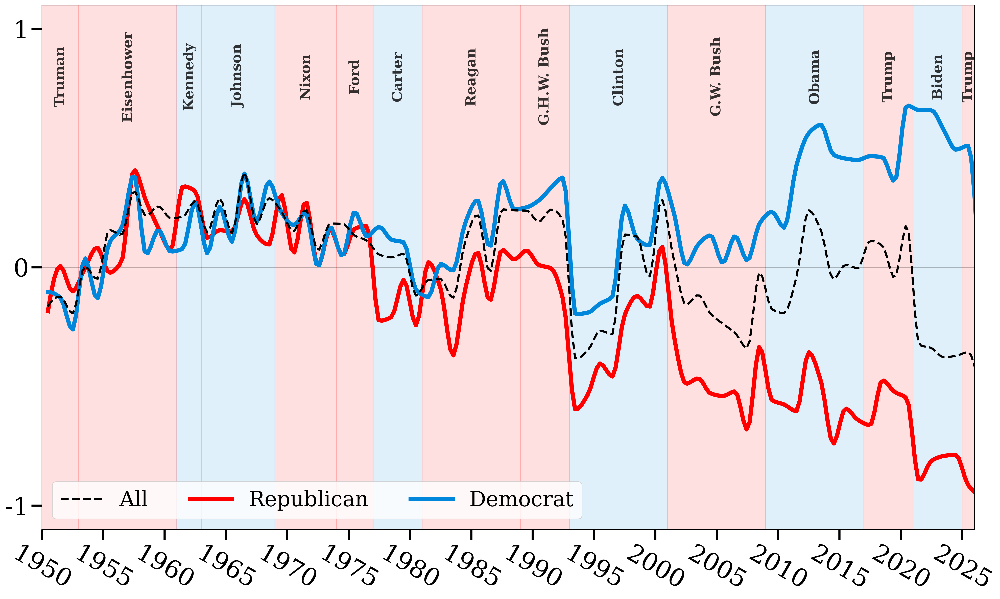

In [5]:
# Create US Congress plot
from scipy.interpolate import PchipInterpolator

fig, ax = plt.subplots(figsize=(20, 12))

# Add background colors for US presidential periods
for start_year, end_year, party, president_name in us_presidential_periods:
    if start_year >= 1950 and start_year <= 2026:
        if party == "Republican":
            ax.axvspan(start_year, end_year, alpha=0.12, color='red', zorder=0)
        elif party == "Democrat":
            ax.axvspan(start_year, end_year, alpha=0.12, color='#0087dc', zorder=0)

# Use actual US Congress (All) data instead of averaging
us_all_yearly = yearly_stance[yearly_stance["source_domain"] == "US Congress (All)"].sort_values("Year")

# Plot overall US trend (dashed black line)
if not us_all_yearly.empty:
    x_points = us_all_yearly["Year"].values + 0.5
    y_points = us_all_yearly["mean_score"].values
    if len(x_points) >= 4:
        x_smooth = np.linspace(x_points.min(), x_points.max(), 300)
        y_smooth = PchipInterpolator(x_points, y_points)(x_smooth)
    else:
        x_smooth, y_smooth = x_points, y_points
        
    ax.plot(
        x_smooth,
        y_smooth,
        linestyle="dashed",
        color="black",
        label="All",
        linewidth=3,
        zorder=4
    )

# Plot US parties
us_domains = ['US Congress (Rep)', 'US Congress (Dem)']
us_colors = {'US Congress (Rep)': 'red', 'US Congress (Dem)': '#0087dc'}
us_labels = {'US Congress (Rep)': 'Republican', 'US Congress (Dem)': 'Democrat'}

for domain in us_domains:
    domain_data = yearly_stance[yearly_stance["source_domain"] == domain].sort_values("Year")
    
    if domain_data.empty:
        continue
    
    x_points = domain_data["Year"].values + 0.5
    y_points = domain_data["mean_score"].values
    
    if len(x_points) >= 4:
        x_smooth = np.linspace(x_points.min(), x_points.max(), 300)
        y_smooth = PchipInterpolator(x_points, y_points)(x_smooth)
    else:
        x_smooth, y_smooth = x_points, y_points
        
    # Main line
    ax.plot(
        x_smooth,
        y_smooth,
        label=us_labels[domain],
        color=us_colors[domain],
        linewidth=6,
        zorder=3
    )

# Add President names
for start_year, end_year, party, president_name in us_presidential_periods:
    if start_year >= 1950 and end_year <= 2026:
        mid_year = (start_year + end_year) / 2
        y_position = 0.8
        
        ax.text(mid_year, y_position, president_name,
                rotation=90,
                verticalalignment='center',
                horizontalalignment='center',
                fontsize=20,
                fontweight='bold',
                color='black',
                alpha=0.8,
                zorder=5)

# Formatting
ax.axhline(0, color="black", linewidth=0.5, linestyle="solid", zorder=1)
ax.set_ylim([-1.1, 1.1])
ax.set_xlim([1950, 2026])
# ax.set_xlabel("Year", fontsize=35)
# ax.set_ylabel("Net Stance Toward Migration", fontsize=35)
ax.set_xticks(range(1950, 2026, 5))
ax.set_xticklabels(range(1950, 2026, 5), fontsize=35, rotation=-30)
ax.set_yticks([-1, 0, 1])
ax.set_yticklabels([-1, 0, 1], fontsize=35)
ax.tick_params(axis='both', which='major', length=15, width=3)

# Legend
ax.legend(frameon=True, prop={'size': 30}, ncol=3, loc='lower left')

plt.tight_layout()

# Save
output_path = os.path.join(OUTPUT_DIR, "us_congress_stance.png")
plt.savefig(output_path, bbox_inches='tight', dpi=300)
print(f"Saved: {output_path}")

plt.show()

# Dashboards

## Aggregative View

Top 25 meso narratives in news media (total articles: 147,823)
Saved: ./plots_for_paper/meso_narratives_aggregative.png


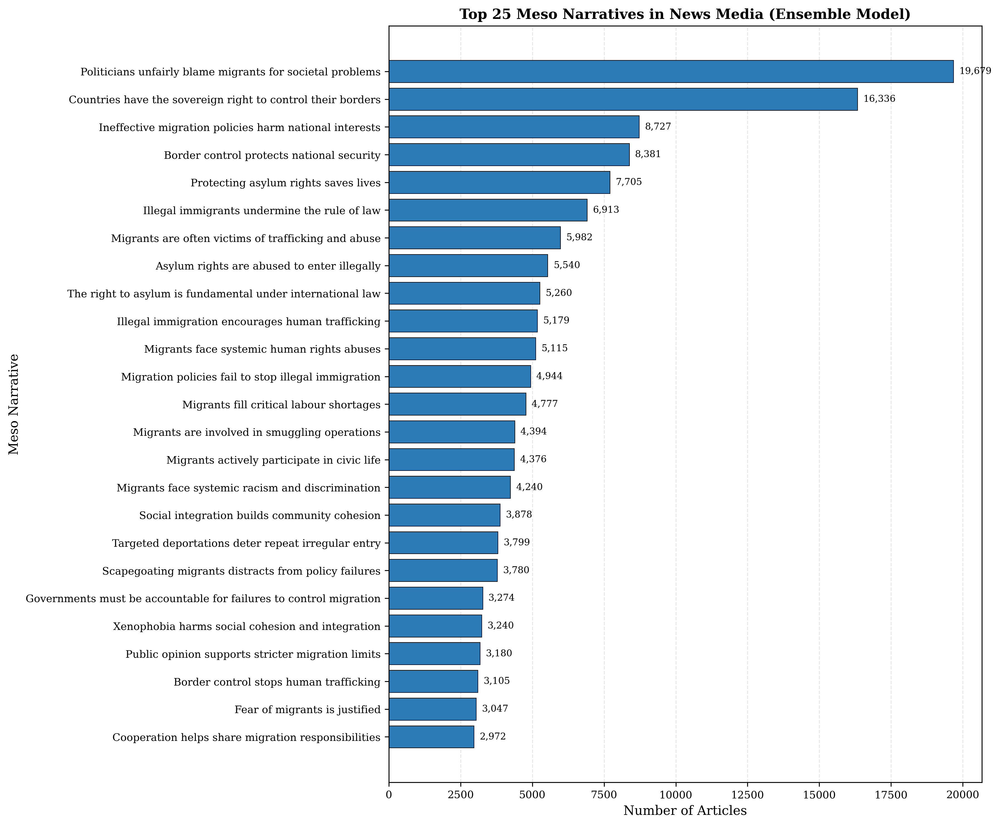

In [ ]:
# Figure 2: Top Meso Narratives (News Media Only)
# Filter: Ensemble model, news domains only (exclude parliamentary/congressional)

# Filter meso data
meso_news = meso_df[
    (meso_df["model"] == "Ensemble") &
    (~meso_df["source_domain"].isin(EXCLUDE_DOMAINS))
].copy()

# Aggregate counts across all time periods and news domains
meso_agg = meso_news.groupby("meso_narrative", as_index=False)["count"].sum()
meso_agg = meso_agg.sort_values("count", ascending=False).head(25)

print(f"Top 25 meso narratives in news media (total articles: {meso_agg['count'].sum():,})")

# Create horizontal bar chart
fig, ax = plt.subplots(figsize=(12, 10))

y_pos = np.arange(len(meso_agg))
bars = ax.barh(y_pos, meso_agg["count"], color='#2c7bb6', edgecolor='black', linewidth=0.5)

# Formatting
ax.set_yticks(y_pos)
ax.set_yticklabels(meso_agg["meso_narrative"], fontsize=9)
ax.invert_yaxis()  # Highest at top
ax.set_xlabel("Number of Articles", fontsize=11)
ax.set_ylabel("Meso Narrative", fontsize=11)
ax.set_title("Top 25 Meso Narratives in News Media (Ensemble Model)", fontsize=12, fontweight='bold')

# Add value labels on bars
for i, (bar, count) in enumerate(zip(bars, meso_agg["count"])):
    ax.text(count + max(meso_agg["count"]) * 0.01, i, f'{count:,}', 
            va='center', fontsize=8, color='black')

# Grid for readability
ax.grid(axis='x', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

plt.tight_layout()

# Save
output_path = os.path.join(OUTPUT_DIR, "meso_narratives_aggregative.png")
plt.savefig(output_path, bbox_inches='tight', dpi=300)
print(f"Saved: {output_path}")

plt.show()

## Comparative View

Saved: ./plots_for_paper/meso_themes_comparative_4way_manual.png


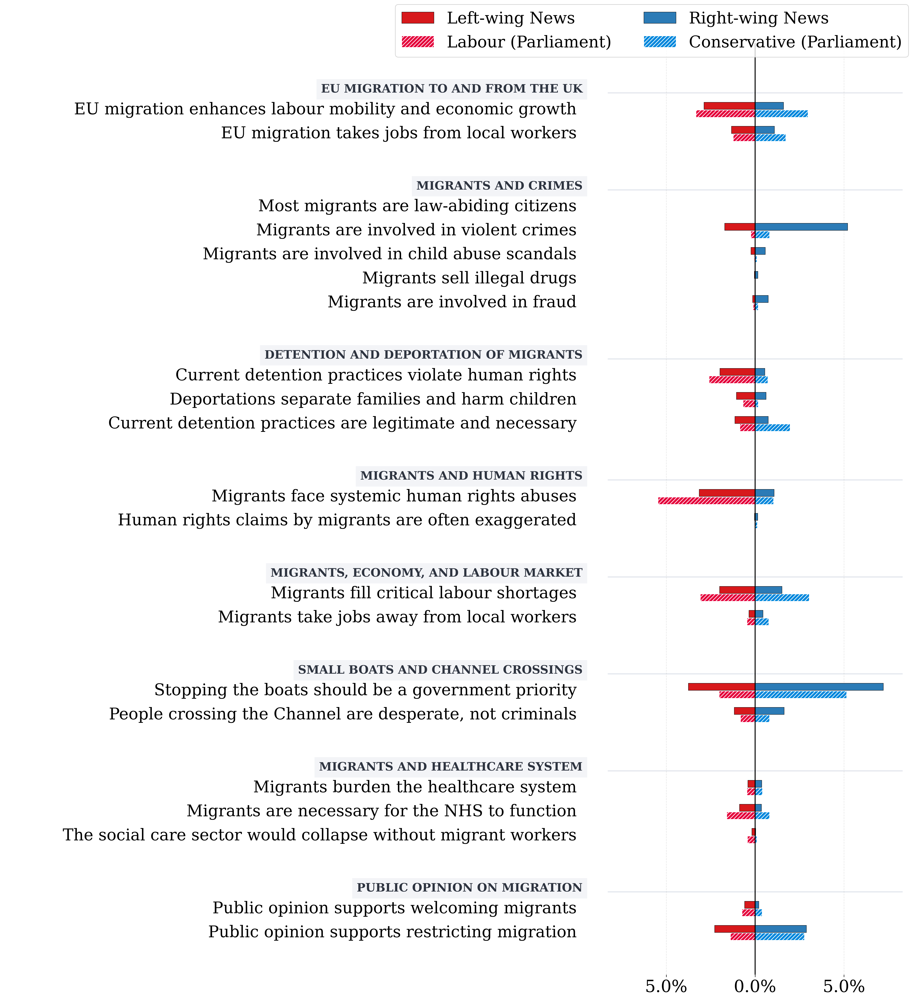


NUMERICAL RESULTS: MESO NARRATIVE PREVALENCE

[EU MIGRATION TO AND FROM THE UK]
  "EU migration enhances labour mobility and economic growth"
    ↳ Left News:    2.9%  |  Right News:     1.6%
    ↳ Labour:       3.3%  |  Conservative:   3.0%
------------------------------------------------------------
  "EU migration takes jobs from local workers"
    ↳ Left News:    1.3%  |  Right News:     1.1%
    ↳ Labour:       1.2%  |  Conservative:   1.7%
------------------------------------------------------------

[MIGRANTS AND CRIMES]
  "Most migrants are law-abiding citizens"
    ↳ Left News:    0.0%  |  Right News:     0.0%
    ↳ Labour:       0.0%  |  Conservative:   0.0%
------------------------------------------------------------
  "Migrants are involved in violent crimes"
    ↳ Left News:    1.7%  |  Right News:     5.2%
    ↳ Labour:       0.2%  |  Conservative:   0.8%
------------------------------------------------------------
  "Migrants are involved in child abuse scandals"
    ↳ 

In [3]:
# Figure 5: Diverging Meso Narratives Grouped by Theme (Manual Theme Tranches)
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import textwrap
import re

# ── 1. Settings & Target Narrative Selection ──
MODEL = "Ensemble"
START_DATE = "2016-01-01"
END_DATE = "2025-12-31"

UK_LEFT_WING = [
    "theguardian.com", "mirror.co.uk", "independent.co.uk",
    "huffingtonpost.co.uk", "dailyrecord.co.uk", "thenational.scot", "heraldscotland.com",
]
UK_RIGHT_WING = [
    "telegraph.co.uk", "dailymail.co.uk", "express.co.uk",
    "thesun.co.uk", "spectator.co.uk", "thetimes.co.uk", "thescottishsun.co.uk",
]
UK_LABOUR = ["UK Parliament (Lab)"]
UK_CONSERVATIVE = ["UK Parliament (Con)"]



TARGET_THEMES = [
    "EU migration to and from the UK",
    # "international students in higher education",
    # "legal vs. illegal immigration",
    "migrants and crimes",
    # "migrants and housing",
    "detention and deportation of migrants",
    "migrants and human rights",
    # "migrants and national identity",
    # "migrants and racism/xenophobia",
    "migrants, economy, and labour market",
    "small boats and Channel crossings",
    "work visas and sponsorship",
    # "migrants and healthcare system",
    "public opinion on migration",
]



# Critical meso narratives manually selected from taxonomy 
TARGET_NARRATIVES = {
    "EU migration to and from the UK": [
        "EU migration enhances labour mobility and economic growth",
        "EU migration takes jobs from local workers",
        # "Freedom of movement between EU and UK allows talent to circulate"
    ],
    # "international students in higher education": [
    #     "International students enrich academic environments",
    #     "International students take university places from locals",
        # "International students are critical for the survival of universities",
        # "International study is a backdoor for migration"
    # ],
    "migrants and crimes": [
        "Most migrants are law-abiding citizens",
        # "Migrants increase crime rates",
        "Migrants are involved in violent crimes",
        "Migrants are involved in child abuse scandals",
        "Migrants sell illegal drugs",
        "Migrants are involved in fraud",
    ],
    "detention and deportation of migrants": [
        "Current detention practices violate human rights",
        "Deportations separate families and harm children",
        "Current detention practices are legitimate and necessary",
    ],
    "migrants and human rights": [
        "Migrants face systemic human rights abuses",
        "Human rights claims by migrants are often exaggerated",
    ],
    # "migrants and housing": [
    #     # "Migration strains affordable housing supply",
    #     "Migration strains affordable housing supply",
    #     "Migrants are placed in hotels paid for by taxpayers",
    #     "Migrants revitalise declining neighbourhoods"
    # ],
    # "migrants and national identity": [
    #     "Migrants contribute to a modern national identity",
    #     "Migrants weaken the national identity by changing demographics",
    #     "Migrants do not care about British traditions",
    #     "Migrants erode traditional national customs"
    # ],
    # "migrants and racism/xenophobia": [
    #     "Migrants face systemic racism and discrimination",
    #     "Opposing migration is wrongly labelled as xenophobia",
    #     # "Racial discrimination claims are exaggerated",
    #     # "Fear of migrants is justified"
    # ],
    "migrants, economy, and labour market": [
        "Migrants fill critical labour shortages",
        # "Migrants fill essential jobs locals won’t take",
        "Migrants take jobs away from local workers",
        # "Migrants depress wages for native workers"
    ],
    "small boats and Channel crossings": [
        "Stopping the boats should be a government priority",
        # "Small boat crossings are a national security threat",
        "People crossing the Channel are desperate, not criminals",
        # "Smuggling gangs are profiting from Channel crossings"
    ],
    # "work visas and sponsorship": [
        # "Work visa sponsorship is being abused through fake jobs and sham employers",
        # "Tying a worker’s visa to a single employer enables exploitation",
        # "Current work visa policies are too liberal towards migrants",
        # "Current work visa policies are too restrictive towards migrants"
    # ],
    "migrants and healthcare system": [
        "Migrants burden the healthcare system",
        # "Healthcare for migrants reduces services for locals",
        "Migrants are necessary for the NHS to function",
        "The social care sector would collapse without migrant workers"
    ],

    "public opinion on migration": [
        "Public opinion supports welcoming migrants",
        "Public opinion supports restricting migration",
    ],
}

def _norm_text(s: str) -> str:
    if not s: return ""
    return re.sub(r"\s+", " ", str(s).strip().lower())

target_keys = {}
for theme, mesos in TARGET_NARRATIVES.items():
    for raw_text in mesos:
        target_keys[_norm_text(raw_text)] = (theme, raw_text)

# ── 2. Filter Subsets ──
def _filter(df, model, domains, start_date, end_date):
    if df.empty: return df
    return df[
        (df["model"] == model) &
        (df["month"] >= pd.to_datetime(start_date)) &
        (df["month"] <= pd.to_datetime(end_date)) &
        (df["source_domain"].isin(domains))
    ].copy()

# Total Denominators
total_left  = _filter(stance_df, MODEL, UK_LEFT_WING, START_DATE, END_DATE)["count"].sum()
total_right = _filter(stance_df, MODEL, UK_RIGHT_WING, START_DATE, END_DATE)["count"].sum()
total_lab   = _filter(stance_df, MODEL, UK_LABOUR, START_DATE, END_DATE)["count"].sum()
total_con   = _filter(stance_df, MODEL, UK_CONSERVATIVE, START_DATE, END_DATE)["count"].sum()

# Extract precisely the required meso narratives using mapping
TAXONOMY_VERSION = 2
meso_filtered = meso_df[meso_df["version"] == TAXONOMY_VERSION].copy() if "version" in meso_df.columns else meso_df.copy()
meso_filtered["meso_key"] = meso_filtered["meso_narrative"].map(_norm_text)
meso_filtered = meso_filtered[meso_filtered["meso_key"].isin(target_keys.keys())]

meso_l   = _filter(meso_filtered, MODEL, UK_LEFT_WING, START_DATE, END_DATE).groupby("meso_key", as_index=False)["count"].sum()
meso_r   = _filter(meso_filtered, MODEL, UK_RIGHT_WING, START_DATE, END_DATE).groupby("meso_key", as_index=False)["count"].sum()
meso_lab = _filter(meso_filtered, MODEL, UK_LABOUR, START_DATE, END_DATE).groupby("meso_key", as_index=False)["count"].sum()
meso_con = _filter(meso_filtered, MODEL, UK_CONSERVATIVE, START_DATE, END_DATE).groupby("meso_key", as_index=False)["count"].sum()

def get_prev(key, df_counts, total):
    if total == 0: return 0.0
    r = df_counts[df_counts["meso_key"] == key]
    return float(r.iloc[0]["count"] / total) if not r.empty else 0.0

# ── 3. Build Ordered Plot Data  ──
plot_data = []

# This ensures the chart renders top-to-bottom precisely spanning the dictionary chunks
for theme, narratives in TARGET_NARRATIVES.items():
    if not narratives: continue
    
    plot_data.append({"is_theme_header": True, "theme": theme})
    
    for raw_text in narratives:
        tk = _norm_text(raw_text)
        plot_data.append({
            "is_theme_header": False,
            "theme": theme,
            "raw_text": raw_text,
            "prev_l":   get_prev(tk, meso_l, total_left),
            "prev_r":   get_prev(tk, meso_r, total_right),
            "prev_lab": get_prev(tk, meso_lab, total_lab),
            "prev_con": get_prev(tk, meso_con, total_con)
        })

# ── 4. Setup GridSpec for Exact 3/5 Text + 2/5 Bar Allocation ──
fig_height = max(18, len(plot_data) * 0.9)
fig = plt.figure(figsize=(25, fig_height)) 
gs = gridspec.GridSpec(1, 2, width_ratios=[2, 1]) 

ax_text = fig.add_subplot(gs[0])
ax      = fig.add_subplot(gs[1])

ax_text.axis("off")

y_pos = 0
yticks = []
legend_added = False

for item in plot_data:
    if item["is_theme_header"]:
        y_pos -= 1.8 
        # Inject theme header prominently aligned close to the plot divider
        ax_text.text(0.98, y_pos+0.2, f"{item['theme'].upper()}",
                     ha='right', va='center', fontsize=18, fontweight='bold', color="#2E3440",
                     bbox=dict(facecolor='#f0f2f6', edgecolor='none', alpha=0.8, pad=7))
                     
        # Add a faint divider across the actual graph territory
        ax.axhline(y=y_pos, color='#e6e9ef', linewidth=2, zorder=0)
        y_pos -= 0.95
    else:
        # Four bars offset around the anchor axis per meso narrative 
        y_news = y_pos + 0.22
        y_parl = y_pos - 0.22
        bars_h = 0.40
        
        lbl_l   = 'Left-wing News' if not legend_added else ""
        lbl_r   = 'Right-wing News' if not legend_added else ""
        lbl_lab = 'Labour (Parliament)' if not legend_added else ""
        lbl_con = 'Conservative (Parliament)' if not legend_added else ""
        legend_added = True
        
        # News (Solid Dark Colours, Standard Borders)
        ax.barh(y_news, -item["prev_l"], color='#d7191c', height=bars_h, edgecolor='black', linewidth=0.5, label=lbl_l)
        ax.barh(y_news,  item["prev_r"], color='#2c7bb6', height=bars_h, edgecolor='black', linewidth=0.5, label=lbl_r)
        
        # Parliament (Matching Colours, Striking White Hatching)
        ax.barh(y_parl, -item["prev_lab"], color='#E4003B', height=bars_h, hatch='////', edgecolor='white', linewidth=0.5, label=lbl_lab)
        ax.barh(y_parl,  item["prev_con"], color='#0087DC', height=bars_h, hatch='////', edgecolor='white', linewidth=0.5, label=lbl_con)
        
        # Meso narrative Text Placement
        wrapped_label = '\n'.join(textwrap.wrap(item["raw_text"], width=72))
        ax_text.text(0.97, y_pos, wrapped_label, ha='right', va='center', fontsize=25, linespacing=1.35)
        
        yticks.append(y_pos)
        y_pos -= 1.35

# ── 5. Bounds & Formatting ──
max_val = max([max(i["prev_l"], i["prev_r"], i["prev_lab"], i["prev_con"]) 
               for i in plot_data if not i["is_theme_header"]] + [0.01])

x_limit = max_val * 1.15
ax.set_xlim(-x_limit, x_limit)
ax.set_ylim(y_pos - 1.0, 1.0) 
ax_text.set_ylim(y_pos - 1.0, 1.0) 

# Hide main plot vertical ticks manually (our bespoke text handles Y-axes aesthetics flawlessly)
ax.set_yticks([]) 
# ax.set_xlabel("Prevalence (% of relevant texts)", fontsize=26, labelpad=15)
ax.tick_params(axis='x', labelsize=26)

# Force axis logic to display clean absolute percentages rather than decimals / negatives
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{abs(x)*100:.1f}%'))

# Subdued structural visual aides
ax.axvline(0, color='black', linewidth=1.5, zorder=3)
ax.grid(axis='x', alpha=0.3, linestyle='--')
ax.set_axisbelow(True)

# Minimalist un-boxed grid aesthetic standard
for spine in ["top", "right", "left", "bottom"]:
    ax.spines[spine].set_visible(False)

# Legend Order Override => [Left News, Right News] | [Labour, Conserv]
handles, labels = ax.get_legend_handles_labels()
if len(handles) >= 4:
    order = [0, 2, 1, 3] 
    ax.legend([handles[i] for i in order], [labels[i] for i in order],
              loc='upper center', bbox_to_anchor=(0.15, 1.05), frameon=True, fontsize=25, ncol=2)

# Minimize gap between Left Text Block & Right Plot Block 
plt.subplots_adjust(wspace=0.03)

out_fp = os.path.join(OUTPUT_DIR, "meso_themes_comparative_4way_manual.png")
plt.savefig(out_fp, dpi=400, bbox_inches='tight', facecolor='white')
print(f"Saved: {out_fp}")

plt.show()


print("\n" + "="*60)
print("NUMERICAL RESULTS: MESO NARRATIVE PREVALENCE")
print("="*60)

for item in plot_data:
    if item["is_theme_header"]:
        print(f"\n[{item['theme'].upper()}]")
    else:
        l_pct = item["prev_l"] * 100
        r_pct = item["prev_r"] * 100
        lab_pct = item["prev_lab"] * 100
        con_pct = item["prev_con"] * 100
        
        print(f'  "{item["raw_text"]}"')
        print(f"    ↳ Left News:  {l_pct:5.1f}%  |  Right News:   {r_pct:5.1f}%")
        print(f"    ↳ Labour:     {lab_pct:5.1f}%  |  Conservative: {con_pct:5.1f}%")
        print("-" * 60)

## Temporal View

### local denominator

Preparing media subsets...
Generating charts...
Saved: ./plots_for_paper/themes_temporal_left_media.png


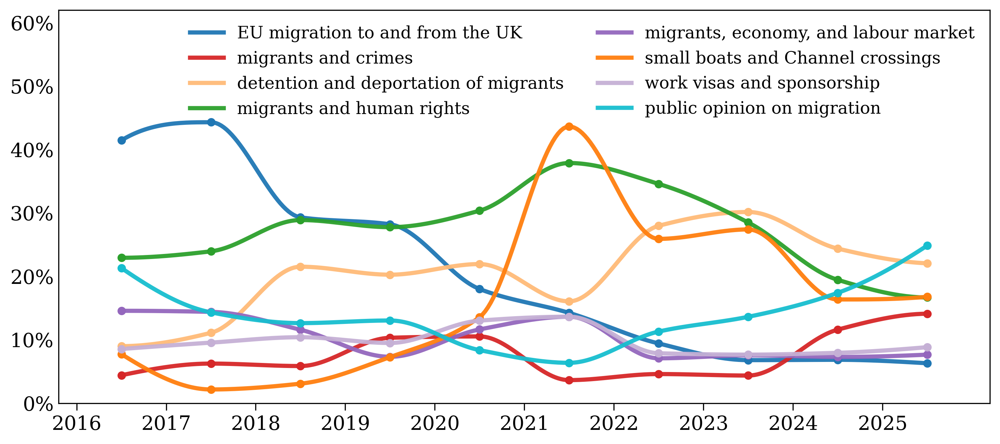

Saved: ./plots_for_paper/themes_temporal_right_media.png


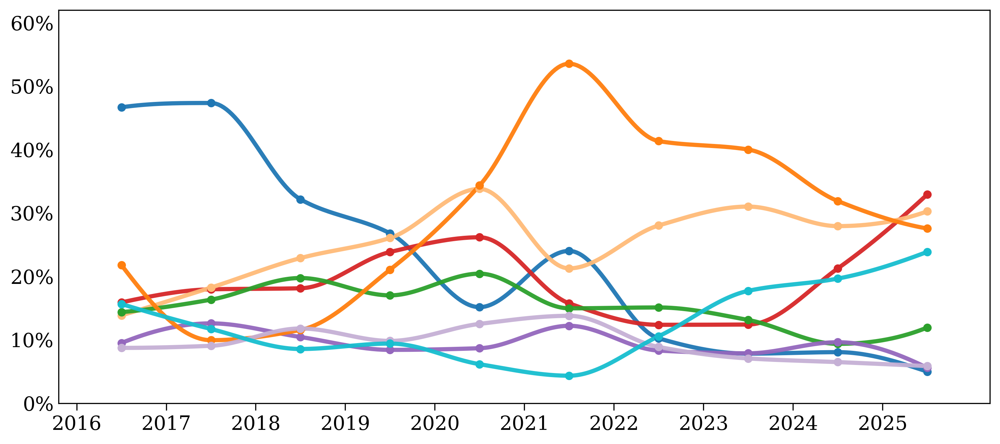

Saved: ./plots_for_paper/themes_temporal_labour.png


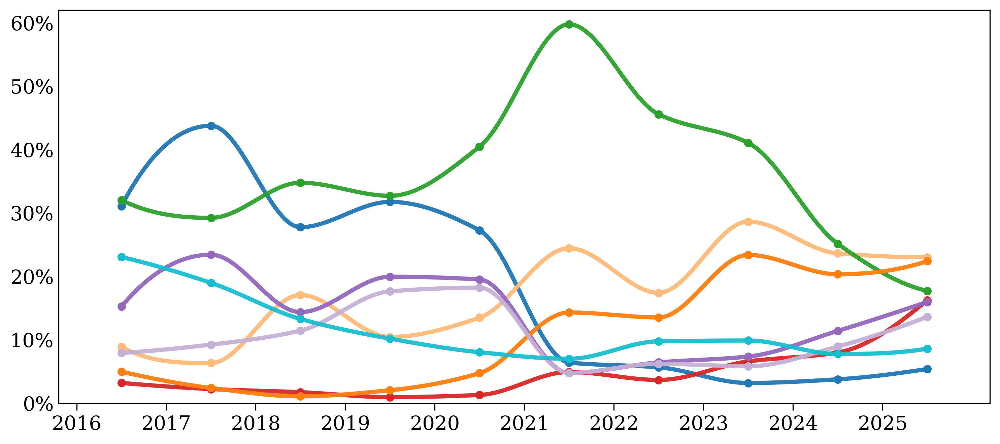

Saved: ./plots_for_paper/themes_temporal_conservative.png


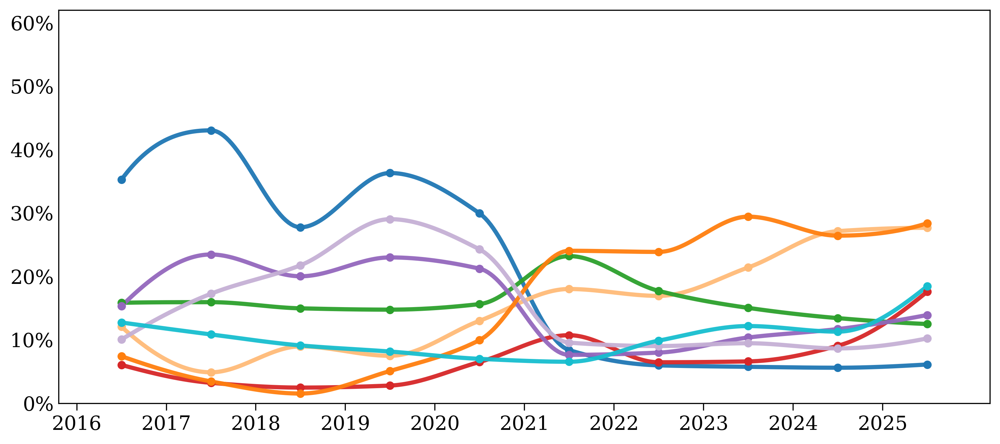

In [ ]:
# Figure 4: Theme Evolution Over Time (separate charts)
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
from matplotlib.lines import Line2D
from scipy.interpolate import PchipInterpolator

# -----------------------------
# Domain groups
# -----------------------------
UK_LEFT_WING = [
    "theguardian.com",
    "mirror.co.uk",
    "independent.co.uk",
    "huffingtonpost.co.uk",
    "dailyrecord.co.uk",
    "thenational.scot",
    "heraldscotland.com",
]

UK_RIGHT_WING = [
    "telegraph.co.uk",
    "dailymail.co.uk",
    "express.co.uk",
    "thesun.co.uk",
    "spectator.co.uk",
    "thetimes.co.uk",
    "thescottishsun.co.uk",
]

UK_LABOUR = ["UK Parliament (Lab)"]
UK_CONSERVATIVE = ["UK Parliament (Con)"]

# -----------------------------
# Target themes
# -----------------------------
TARGET_THEMES = [
    "EU migration to and from the UK",
    # "international students in higher education",
    # "legal vs. illegal immigration",
    "migrants and crimes",
    # "migrants and housing",
    "detention and deportation of migrants",
    "migrants and human rights",
    # "migrants and national identity",
    # "migrants and racism/xenophobia",
    "migrants, economy, and labour market",
    "small boats and Channel crossings",
    "work visas and sponsorship",
    # "migrants and healthcare system",
    "public opinion on migration",
]

# Streamlit-like categorical colors
STREAMLIT_LIKE_COLORS = [
    "#1f77b4",
    # "#6baed6",
    # "#d62728",
    "#d62728",
    "#ffbb78",
    "#2ca02c",
    "#9467bd",
    "#ff7f0e",
    "#c5b0d5",
    "#17becf",
    # "#9edae5",
]


# -----------------------------
# Macros
# -----------------------------
MODEL = "Ensemble"
START_DATE = "2016-01-01"
END_DATE = "2025-12-31"

# Match dashboard behavior by defaulting to latest taxonomy version if available
TAXONOMY_VERSION = None
if "version" in themes_df.columns:
    vv = pd.to_numeric(themes_df["version"], errors="coerce").dropna()
    if not vv.empty:
        TAXONOMY_VERSION = int(vv.max())

def prepare_theme_prevalence(themes_df, stance_df, domains, target_themes,
                             model="Ensemble",
                             start_date="2016-01-01",
                             end_date="2025-12-31",
                             taxonomy_version=None):
    # Theme slice
    t = themes_df[
        (themes_df["model"] == model) &
        (themes_df["source_domain"].isin(domains)) &
        (themes_df["month"] >= pd.to_datetime(start_date)) &
        (themes_df["month"] <= pd.to_datetime(end_date))
    ].copy()

    if "version" in t.columns and taxonomy_version is not None:
        tver = pd.to_numeric(t["version"], errors="coerce")
        t = t[tver == int(taxonomy_version)].copy()

    if t.empty:
        return pd.DataFrame(columns=["year", "theme", "articles", "total", "prevalence"])

    t = t[t["theme"].isin(target_themes)].copy()
    t["year"] = t["month"].dt.year

    theme_counts = (
        t.groupby(["year", "theme"], as_index=False)["count"]
        .sum()
        .rename(columns={"count": "articles"})
    )

    # Denominator from stance, same domain/time/model
    s = stance_df[
        (stance_df["model"] == model) &
        (stance_df["source_domain"].isin(domains)) &
        (stance_df["month"] >= pd.to_datetime(start_date)) &
        (stance_df["month"] <= pd.to_datetime(end_date)) &
        (stance_df["stance"].isin(["OPEN", "RESTRICTIVE", "NEUTRAL"]))
    ].copy()

    if s.empty:
        out = theme_counts.copy()
        out["total"] = 0
        out["prevalence"] = 0.0
        return out

    s["year"] = s["month"].dt.year
    yearly_totals = (
        s.groupby("year", as_index=False)["count"]
        .sum()
        .rename(columns={"count": "total"})
    )

    out = theme_counts.merge(yearly_totals, on="year", how="left")
    out["prevalence"] = np.where(out["total"] > 0, out["articles"] / out["total"], 0.0)
    return out.sort_values(["theme", "year"])


COLOR_MAP = {th: STREAMLIT_LIKE_COLORS[i % len(STREAMLIT_LIKE_COLORS)] for i, th in enumerate(TARGET_THEMES)}

def plot_theme_evolution_clean(df_plot, output_filename, show_legend=False):
    # Streamlit-like canvas tones
    fig_bg = "#ffffff"
    ax_bg = "#ffffff"
    grid_c = "#e6e9ef"

    fig, ax = plt.subplots(figsize=(10, 4.5))
    fig.patch.set_facecolor(fig_bg)
    ax.set_facecolor(ax_bg)

    # Plot lines + points
    for theme in TARGET_THEMES:
        d = df_plot[df_plot["theme"] == theme].sort_values("year")
        if d.empty:
            continue
            
        x_points = d["year"].values + 0.5
        y_points = d["prevalence"].values
        
        if len(x_points) >= 4:
            x_smooth = np.linspace(x_points.min(), x_points.max(), 300)
            y_smooth = PchipInterpolator(x_points, y_points)(x_smooth)
        else:
            x_smooth, y_smooth = x_points, y_points
            
        y_smooth = np.maximum(y_smooth, 0)
        
        ax.plot(
            x_smooth, y_smooth,
            color=COLOR_MAP[theme],
            linewidth=3.0,          # Made lines thicker
            label=theme,
            alpha=0.95
        )
        
        ax.scatter(
            x_points, y_points,
            color=COLOR_MAP[theme],
            s=25,
            zorder=3
        )

    # Axes labels (larger size)
    # ax.set_xlabel("Period", fontsize=14, color="#667085", labelpad=12)
    # ax.set_ylabel("% Prevalence", fontsize=14, color="#667085", labelpad=12)

    # X-axis formatting
    if not df_plot.empty:
        x_min = int(df_plot["year"].min())
        x_max = int(df_plot["year"].max())
    else:
        x_min, x_max = 2016, 2025

    ax.set_xlim(x_min - 0.2, x_max + 1.2)
    ax.set_xticks(list(range(x_min, x_max + 1, 1 if (x_max - x_min) <= 14 else 2)))
    ax.tick_params(axis="x", labelsize=14, colors="black", rotation=0, length=5) # remove tick marks
    
    # Y-axis formatting & fixed limit (0 to 70%)
    ax.set_ylim(0, 0.62)
    ax.tick_params(axis="y", labelsize=14, colors="black", length=0) # remove tick marks
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=0))

    # Only horizontal grid, subtle
    # ax.grid(True, axis="y", color=grid_c, linestyle="-", linewidth=1.0, alpha=0.9)
    # ax.grid(False, axis="x")
    # ax.set_axisbelow(True)

    # Remove all spines (border lines)
    # for spine in ["top", "right", "left", "bottom"]:
    #     ax.spines[spine].set_visible(False)

    if show_legend:
        # Legend placed inside the chart at the top right, spanning 2 columns
        ax.legend(
            loc="upper right",
            frameon=False,
            fontsize=12,
            ncol=2,
            # title="Themes",
            title_fontsize=11
        )

    plt.tight_layout()
    out_fp = os.path.join(OUTPUT_DIR, output_filename)
    plt.savefig(out_fp, dpi=400, bbox_inches="tight", facecolor=fig.get_facecolor())
    print(f"Saved: {out_fp}")
    plt.show()

# Build data
print("Preparing media subsets...")
left_data = prepare_theme_prevalence(
    themes_df, stance_df, UK_LEFT_WING, TARGET_THEMES,
    model=MODEL, start_date=START_DATE, end_date=END_DATE, taxonomy_version=TAXONOMY_VERSION
)

right_data = prepare_theme_prevalence(
    themes_df, stance_df, UK_RIGHT_WING, TARGET_THEMES,
    model=MODEL, start_date=START_DATE, end_date=END_DATE, taxonomy_version=TAXONOMY_VERSION
)

labour_data = prepare_theme_prevalence(
    themes_df, stance_df, UK_LABOUR, TARGET_THEMES,
    model=MODEL, start_date=START_DATE, end_date=END_DATE, taxonomy_version=TAXONOMY_VERSION
)

conservative_data = prepare_theme_prevalence(
    themes_df, stance_df, UK_CONSERVATIVE, TARGET_THEMES,
    model=MODEL, start_date=START_DATE, end_date=END_DATE, taxonomy_version=TAXONOMY_VERSION
)

# Plot the 4 charts (Legend ONLY enabled on left_data)
print("Generating charts...")
plot_theme_evolution_clean(left_data, "themes_temporal_left_media.png", show_legend=True)
plot_theme_evolution_clean(right_data, "themes_temporal_right_media.png", show_legend=False)
plot_theme_evolution_clean(labour_data, "themes_temporal_labour.png", show_legend=False)
plot_theme_evolution_clean(conservative_data, "themes_temporal_conservative.png", show_legend=False)

### global denominator

Preparing media subsets...
Generating charts...
Saved: ./plots_for_paper/themes_temporal_global_denominator_left_media.png


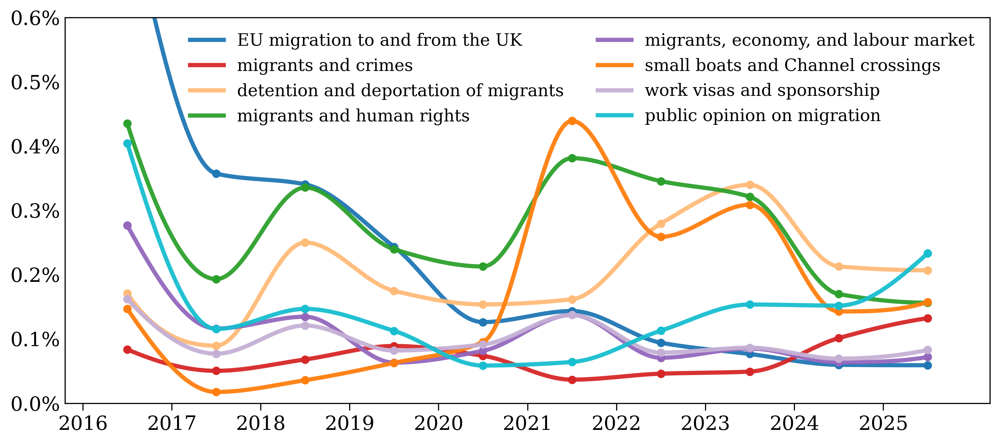

Saved: ./plots_for_paper/themes_temporal_global_denominator_right_media.png


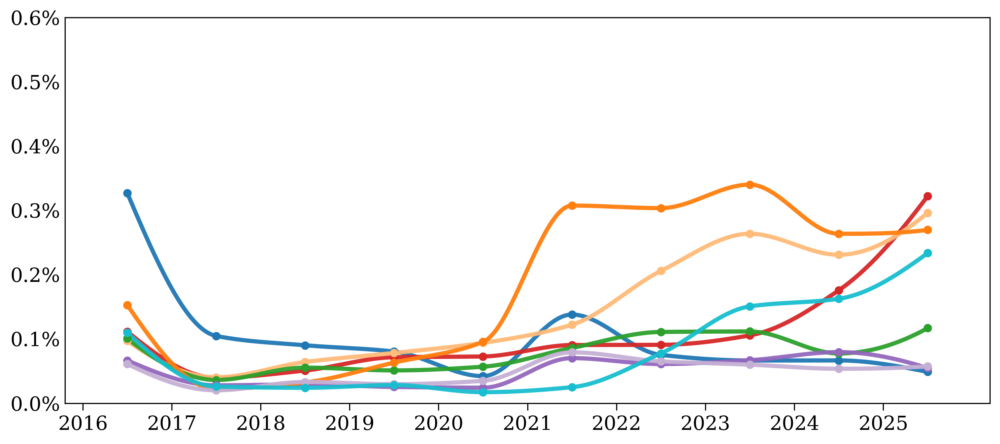

Saved: ./plots_for_paper/themes_temporal_global_denominator_labour.png


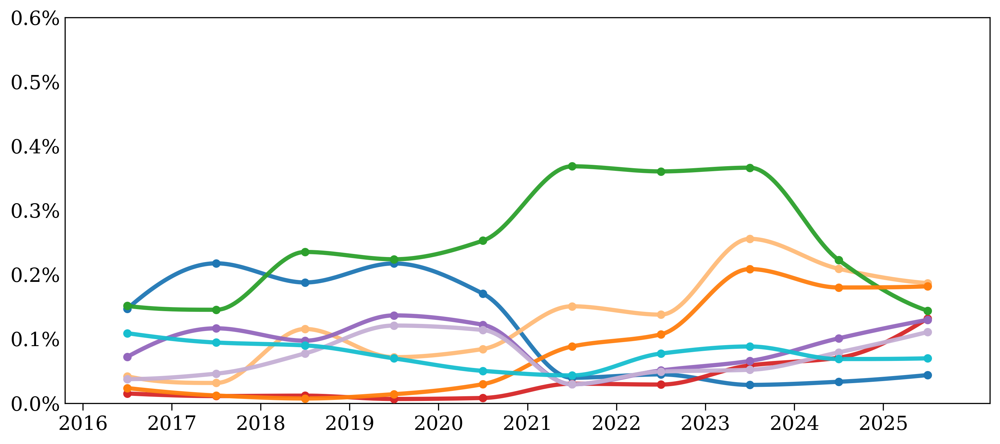

Saved: ./plots_for_paper/themes_temporal_global_denominator_conservative.png


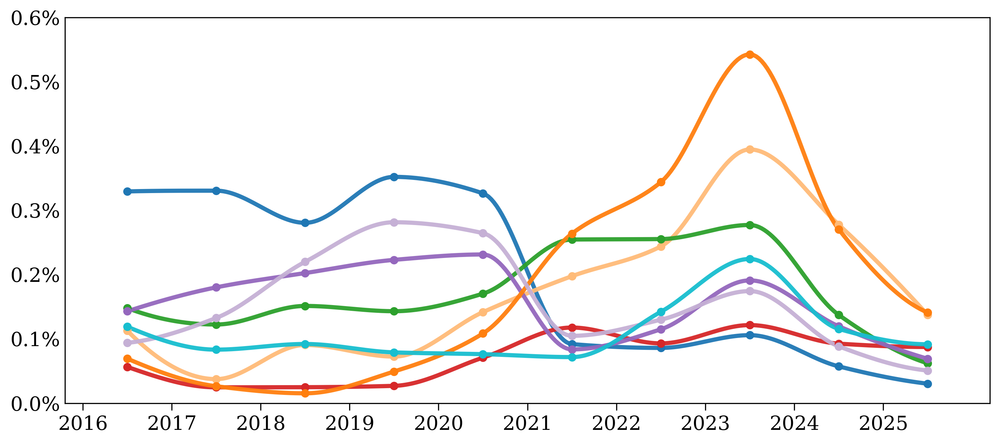

In [6]:
# Figure 4: Theme Evolution Over Time (separate charts)
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
from matplotlib.lines import Line2D
from scipy.interpolate import PchipInterpolator

# -----------------------------
# Domain groups
# -----------------------------
UK_LEFT_WING = [
    "theguardian.com",
    "mirror.co.uk",
    "independent.co.uk",
    "huffingtonpost.co.uk",
    "dailyrecord.co.uk",
    "thenational.scot",
    "heraldscotland.com",
]

UK_RIGHT_WING = [
    "telegraph.co.uk",
    "dailymail.co.uk",
    "express.co.uk",
    "thesun.co.uk",
    "spectator.co.uk",
    "thetimes.co.uk",
    "thescottishsun.co.uk",
]

UK_LABOUR = ["UK Parliament (Lab)"]
UK_CONSERVATIVE = ["UK Parliament (Con)"]

# -----------------------------
# Target themes
# -----------------------------
TARGET_THEMES = [
    "EU migration to and from the UK",
    # "international students in higher education",
    # "legal vs. illegal immigration",
    "migrants and crimes",
    # "migrants and housing",
    "detention and deportation of migrants",
    "migrants and human rights",
    # "migrants and national identity",
    # "migrants and racism/xenophobia",
    "migrants, economy, and labour market",
    "small boats and Channel crossings",
    "work visas and sponsorship",
    # "migrants and healthcare system",
    "public opinion on migration",
]

# Streamlit-like categorical colors
STREAMLIT_LIKE_COLORS = [
    "#1f77b4",
    # "#6baed6",
    # "#d62728",
    "#d62728",
    "#ffbb78",
    "#2ca02c",
    "#9467bd",
    "#ff7f0e",
    "#c5b0d5",
    "#17becf",
    # "#9edae5",
]


# -----------------------------
# Macros
# -----------------------------
MODEL = "Ensemble"
START_DATE = "2016-01-01"
END_DATE = "2025-12-31"

# Match dashboard behavior by defaulting to latest taxonomy version if available
TAXONOMY_VERSION = None
if "version" in themes_df.columns:
    vv = pd.to_numeric(themes_df["version"], errors="coerce").dropna()
    if not vv.empty:
        TAXONOMY_VERSION = int(vv.max())

# --- 1. Load and aggregate the independent baselines ---
total_docs_df = pd.read_parquet(os.path.join(DATA_DIR, "total_docs.parquet"))
total_docs_df["start_time"] = pd.to_datetime(total_docs_df["start_time"], errors="coerce")
total_docs_df["year"] = total_docs_df["start_time"].dt.year

# Group by year and document type to get absolute total volume per year
yearly_total_docs = total_docs_df.groupby(["year", "document_type"], as_index=False)["total_count"].sum()


def prepare_theme_prevalence(themes_df, domains, target_themes,
                             doc_type="article",
                             model="Ensemble",
                             start_date="2016-01-01",
                             end_date="2025-12-31",
                             taxonomy_version=None):
    """
    doc_type options: 'article' or 'uk_parliamentary_contribution'
    """
    # 1. Extract Target Narratives
    t = themes_df[
        (themes_df["model"] == model) &
        (themes_df["source_domain"].isin(domains)) &
        (themes_df["month"] >= pd.to_datetime(start_date)) &
        (themes_df["month"] <= pd.to_datetime(end_date))
    ].copy()

    if "version" in t.columns and taxonomy_version is not None:
        tver = pd.to_numeric(t["version"], errors="coerce")
        t = t[tver == int(taxonomy_version)].copy()

    if t.empty:
        return pd.DataFrame(columns=["year", "theme", "articles", "total", "prevalence"])

    t = t[t["theme"].isin(target_themes)].copy()
    t["year"] = t["month"].dt.year

    theme_counts = (
        t.groupby(["year", "theme"], as_index=False)["count"]
        .sum()
        .rename(columns={"count": "articles"})
    )

    # 2. Extract Document Totals from the total_docs baseline
    if doc_type == "article":
        # For articles, total_docs_df saves the domain itself in 'document_type' column
        s = yearly_total_docs[
            (yearly_total_docs["document_type"].isin(domains)) &
            (yearly_total_docs["year"] >= pd.to_datetime(start_date).year) &
            (yearly_total_docs["year"] <= pd.to_datetime(end_date).year)
        ].copy()
    else:
        # For parliament, we use the global UK parliament counts
        s = yearly_total_docs[
            (yearly_total_docs["document_type"] == doc_type) &
            (yearly_total_docs["year"] >= pd.to_datetime(start_date).year) &
            (yearly_total_docs["year"] <= pd.to_datetime(end_date).year)
        ].copy()

    if s.empty:
        out = theme_counts.copy()
        out["total"] = 0
        out["prevalence"] = 0.0
        return out

    # We might have multiple rows per year if multiple domains match, so group by year and sum
    s = s.groupby("year", as_index=False)["total_count"].sum().rename(columns={"total_count": "total"})

    # 3. Merge and compute baseline %
    out = theme_counts.merge(s[["year", "total"]], on="year", how="left")
    out["prevalence"] = np.where(out["total"] > 0, out["articles"] / out["total"], 0.0)
    return out.sort_values(["theme", "year"])


COLOR_MAP = {th: STREAMLIT_LIKE_COLORS[i % len(STREAMLIT_LIKE_COLORS)] for i, th in enumerate(TARGET_THEMES)}

def plot_theme_evolution_clean(df_plot, output_filename, show_legend=False):
    # Streamlit-like canvas tones
    fig_bg = "#ffffff"
    ax_bg = "#ffffff"
    grid_c = "#e6e9ef"

    fig, ax = plt.subplots(figsize=(10, 4.5))
    fig.patch.set_facecolor(fig_bg)
    ax.set_facecolor(ax_bg)

    # Plot lines + points
    for theme in TARGET_THEMES:
        d = df_plot[df_plot["theme"] == theme].sort_values("year")
        if d.empty:
            continue
            
        x_points = d["year"].values + 0.5
        y_points = d["prevalence"].values
        
        if len(x_points) >= 4:
            x_smooth = np.linspace(x_points.min(), x_points.max(), 300)
            y_smooth = PchipInterpolator(x_points, y_points)(x_smooth)
        else:
            x_smooth, y_smooth = x_points, y_points
            
        y_smooth = np.maximum(y_smooth, 0)
        
        ax.plot(
            x_smooth, y_smooth,
            color=COLOR_MAP[theme],
            linewidth=3.0,          # Made lines thicker
            label=theme,
            alpha=0.95
        )
        
        ax.scatter(
            x_points, y_points,
            color=COLOR_MAP[theme],
            s=25,
            zorder=3
        )

    # X-axis formatting
    if not df_plot.empty:
        x_min = int(df_plot["year"].min())
        x_max = int(df_plot["year"].max())
    else:
        x_min, x_max = 2016, 2025

    ax.set_xlim(x_min - 0.2, x_max + 1.2)
    ax.set_xticks(list(range(x_min, x_max + 1, 1 if (x_max - x_min) <= 14 else 2)))
    ax.tick_params(axis="x", labelsize=14, colors="black", rotation=0, length=5) 
    
    # Y-axis formatting - automatically adjusts based on data volume
    max_prev = df_plot["prevalence"].max() if not df_plot.empty else 0.0
    buffer = 0.05
    y_max_limit = min(max_prev + buffer, 1.0)
    if y_max_limit < 0.1: y_max_limit = 0.1  # enforce a sane minimum ceiling
    
    ax.set_ylim(0, 0.006)
    ax.tick_params(axis="y", labelsize=14, colors="black", length=0) 
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1.0, decimals=1))

    if show_legend:
        # Legend placed inside the chart at the top right, spanning 2 columns
        ax.legend(
            loc="upper right",
            frameon=False,
            fontsize=12,
            ncol=2,
            title_fontsize=11
        )

    plt.tight_layout()
    out_fp = os.path.join(OUTPUT_DIR, output_filename)
    plt.savefig(out_fp, dpi=400, bbox_inches="tight", facecolor=fig.get_facecolor())
    print(f"Saved: {out_fp}")
    plt.show()

# Build data
print("Preparing media subsets...")
left_data = prepare_theme_prevalence(
    themes_df, UK_LEFT_WING, TARGET_THEMES,
    doc_type="article",
    model=MODEL, start_date=START_DATE, end_date=END_DATE, taxonomy_version=TAXONOMY_VERSION
)

right_data = prepare_theme_prevalence(
    themes_df, UK_RIGHT_WING, TARGET_THEMES,
    doc_type="article",
    model=MODEL, start_date=START_DATE, end_date=END_DATE, taxonomy_version=TAXONOMY_VERSION
)

labour_data = prepare_theme_prevalence(
    themes_df, UK_LABOUR, TARGET_THEMES,
    doc_type="uk_parliamentary_contribution",
    model=MODEL, start_date=START_DATE, end_date=END_DATE, taxonomy_version=TAXONOMY_VERSION
)

conservative_data = prepare_theme_prevalence(
    themes_df, UK_CONSERVATIVE, TARGET_THEMES,
    doc_type="uk_parliamentary_contribution",
    model=MODEL, start_date=START_DATE, end_date=END_DATE, taxonomy_version=TAXONOMY_VERSION
)


print("Generating charts...")
plot_theme_evolution_clean(left_data, "themes_temporal_global_denominator_left_media.png", show_legend=True)
plot_theme_evolution_clean(right_data, "themes_temporal_global_denominator_right_media.png", show_legend=False)
plot_theme_evolution_clean(labour_data, "themes_temporal_global_denominator_labour.png", show_legend=False)
plot_theme_evolution_clean(conservative_data, "themes_temporal_global_denominator_conservative.png", show_legend=False)

In [7]:
from scipy.stats import linregress
from taxonomy.meso_narratives_revision_2 import mesoNarratives as mesoNarratives_with_stance
ALL_THEMES = list(mesoNarratives_with_stance.keys())
# Combine all targeted domains to represent the overall dataset
ALL_DOMAINS = UK_LEFT_WING + UK_RIGHT_WING + UK_LABOUR + UK_CONSERVATIVE

all_data_2020_2025 = prepare_theme_prevalence(
    themes_df, stance_df, ALL_DOMAINS, TARGET_THEMES,
    model=MODEL, 
    start_date="2016-01-01", 
    end_date="2025-12-31", 
    taxonomy_version=TAXONOMY_VERSION
)

theme_slopes = []

for theme in ALL_THEMES:
    # Extract prevalence for the specific theme
    df_theme = all_data_2020_2025[all_data_2020_2025["theme"] == theme].sort_values("year")
    
    if len(df_theme) > 1: # Need at least 2 points to draw a line
        # Use percentage values for easier reading
        years = df_theme["year"]
        prevalences = df_theme["prevalence"] * 100 
        
        # Calculate regression
        slope, intercept, r_value, p_value, std_err = linregress(years, prevalences)
        theme_slopes.append((theme, slope))
    else:
        theme_slopes.append((theme, 0.0))

# Sort from most positive trend to most negative trend
theme_slopes.sort(key=lambda x: x[1], reverse=True)

print("=" * 65)
print(f"{'THEME (2020-2025)':<45} | {'SLOPE (% / Year)':<15}")
print("=" * 65)
for theme, slope in theme_slopes:
    print(f"{theme[:43].title():<45} | {slope:>+8.2f}%")
print("-" * 65)

THEME (2020-2025)                             | SLOPE (% / Year)
Small Boats And Channel Crossings             |    +2.90%
Migrants And Crimes                           |    +1.12%
Migrants And Housing                          |    +0.66%
Public Opinion On Migration                   |    +0.52%
International Law About Migration And Migra   |    +0.00%
Migrants, National Law, And Sovereignty       |    +0.00%
Migrants And The Court System                 |    +0.00%
Geopolitical Impacts Of Migration             |    +0.00%
Migrants As Enemy Infiltrators                |    +0.00%
Migrants And Elections                        |    +0.00%
Migrants, Welfare, And Public Finance/Servi   |    +0.00%
Migrants And Sanitation                       |    +0.00%
Demographic Aspects Of Migration              |    +0.00%
Historical And Colonial Responsibility Towa   |    +0.00%
Politicians Blaming/Excusing Migrants         |    +0.00%
Migrants And Racism/Xenophobia                |    +0.00%
Deservi

# Model Comparison

Pro vs Anti breakdown by model (mapped-only %; per-article denominator from stance):
                          model  Pro-immigrant  Anti-immigrant  mapped_count  \
0  Kimi-Linear-48B-A3B-Instruct      23.620419       76.379581        515863   
1                     Qwen3-32B      30.756614       69.243386        353020   
2                gemma-3-27b-it      36.127800       63.872200        523475   
3                   gpt-oss-20b      30.587077       69.412923        117821   

   unmapped_count  excluded_share_%  article_count  
0           39601          7.129355         159856  
1           60700         14.671759         159895  
2           37334          6.657168         159895  
3            9068          7.146404         159895  
Saved: ./plots_for_paper/model_pro_vs_anti_barpairs_avg_per_article.png


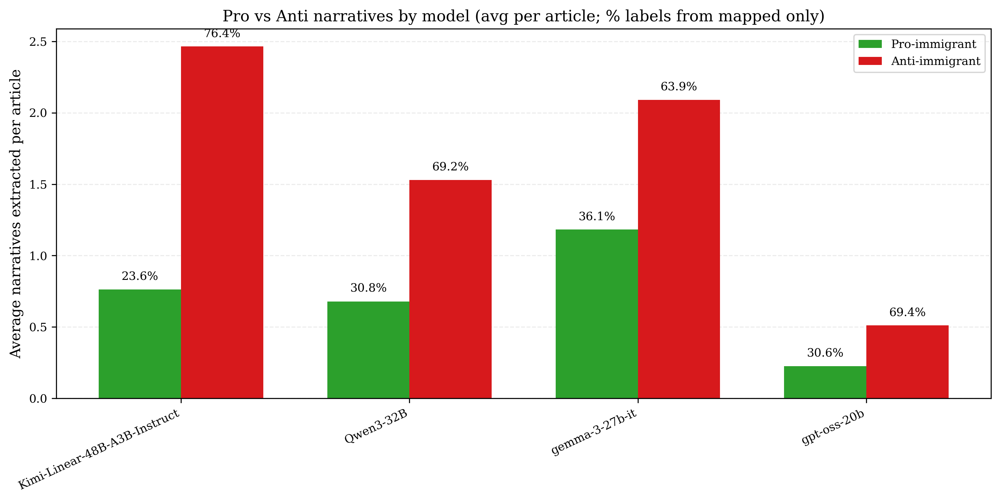

In [3]:
LLM_MODELS = [
    "gpt-oss-20b",
    "Qwen3-32B",
    "gemma-3-27b-it",
    "Kimi-Linear-48B-A3B-Instruct"
]


import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from taxonomy.meso_narratives_revision_2 import mesoNarratives

# --- Helpers ---
def _norm_text(s: str) -> str:
    if s is None:
        return ""
    s = str(s).strip().lower()
    s = re.sub(r"\s+", " ", s)
    return s

def build_meso_to_stance_map(taxonomy_dict: dict) -> dict:
    """
    Returns mapping: normalized meso narrative -> 'pro-migrant'/'anti-migrant'/None
    None = ambiguous or invalid label.
    """
    allowed = {"pro-migrant", "anti-migrant"}
    tmp = {}

    for _, items in taxonomy_dict.items():
        if not isinstance(items, list):
            continue
        for item in items:
            if not (isinstance(item, list) and len(item) >= 2):
                continue
            meso_text, stance = item[0], item[1]
            key = _norm_text(meso_text)
            stance = _norm_text(stance)
            if not key:
                continue
            if stance not in allowed:
                tmp.setdefault(key, set()).add(None)
            else:
                tmp.setdefault(key, set()).add(stance)

    out = {}
    for k, stances in tmp.items():
        valid = {s for s in stances if s in allowed}
        out[k] = list(valid)[0] if len(valid) == 1 else None  # conflict => None
    return out

def pro_anti_breakdown_by_model(meso_df: pd.DataFrame, include_ensemble: bool = False):
    required = {"model", "meso_narrative", "count"}
    missing = required - set(meso_df.columns)
    if missing:
        raise ValueError(f"meso_df missing columns: {missing}")

    df = meso_df.copy()
    if not include_ensemble:
        df = df[df["model"] != "Ensemble"].copy()

    stance_map = build_meso_to_stance_map(mesoNarratives)

    df["meso_key"] = df["meso_narrative"].map(_norm_text)
    df["stance_raw"] = df["meso_key"].map(stance_map)  # can be NaN/None
    df["stance_bin"] = df["stance_raw"].map({
        "pro-migrant": "Pro-immigrant",
        "anti-migrant": "Anti-immigrant"
    })

    # mapped only (exclude null/unknown from percentages)
    mapped = df[df["stance_bin"].notna()].copy()
    unmapped = df[df["stance_bin"].isna()].copy()

    mapped_counts = (
        mapped.groupby(["model", "stance_bin"], as_index=False)["count"].sum()
    )
    mapped_totals = (
        mapped.groupby("model", as_index=False)["count"].sum()
        .rename(columns={"count": "mapped_count"})
    )

    breakdown = mapped_counts.merge(mapped_totals, on="model", how="left")
    breakdown["pct"] = 100 * breakdown["count"] / breakdown["mapped_count"]

    # summary table
    pivot_pct = (
        breakdown.pivot(index="model", columns="stance_bin", values="pct")
        .reset_index()
        .fillna(0)
    )

    unmapped_counts = (
        unmapped.groupby("model", as_index=False)["count"].sum()
        .rename(columns={"count": "unmapped_count"})
    )
    total_counts = (
        df.groupby("model", as_index=False)["count"].sum()
        .rename(columns={"count": "all_count"})
    )

    summary = (
        total_counts.merge(mapped_totals, on="model", how="left")
        .merge(unmapped_counts, on="model", how="left")
        .merge(pivot_pct, on="model", how="left")
        .fillna(0)
    )

    summary["excluded_share_%"] = np.where(
        summary["all_count"] > 0,
        100 * summary["unmapped_count"] / summary["all_count"],
        0
    )

    # Ensure columns exist
    for c in ["Pro-immigrant", "Anti-immigrant"]:
        if c not in summary.columns:
            summary[c] = 0.0

    return summary.sort_values("model"), breakdown

# --- Run ---
meso_slice = meso_df[
    (meso_df["version"] == 2) &
    (~meso_df["source_domain"].str.contains("UK Parliament", na=False))
].copy()

summary_df, long_df = pro_anti_breakdown_by_model(meso_slice, include_ensemble=False)

def article_counts_from_stance(stance_df: pd.DataFrame, meso_slice: pd.DataFrame) -> pd.DataFrame:
    """
    Use stance aggregates as article denominator:
    each article contributes once to stance, so summed stance counts ~= #articles.
    Filters are aligned to meso_slice (model, source_domain, month range).
    """
    if stance_df.empty:
        return pd.DataFrame(columns=["model", "article_count"])

    s = stance_df.copy()
    s = s[s["model"].isin(meso_slice["model"].unique())]

    if "source_domain" in s.columns and "source_domain" in meso_slice.columns:
        doms = meso_slice["source_domain"].dropna().unique().tolist()
        s = s[s["source_domain"].isin(doms)]

    if "month" in s.columns and "month" in meso_slice.columns:
        min_m = meso_slice["month"].min()
        max_m = meso_slice["month"].max()
        if pd.notna(min_m) and pd.notna(max_m):
            s = s[(s["month"] >= min_m) & (s["month"] <= max_m)]

    out = (
        s.groupby("model", as_index=False)["count"]
        .sum()
        .rename(columns={"count": "article_count"})
    )
    return out

article_df = article_counts_from_stance(stance_df, meso_slice)
summary_df = summary_df.merge(article_df, on="model", how="left").fillna({"article_count": 0})

print("Pro vs Anti breakdown by model (mapped-only %; per-article denominator from stance):")
print(
    summary_df[
        ["model", "Pro-immigrant", "Anti-immigrant", "mapped_count", "unmapped_count", "excluded_share_%", "article_count"]
    ].sort_values("model")
)

# --- Plot: paired bars per model (average narratives/article), with % labels on top ---
plot_models = summary_df["model"].sort_values().tolist()

plot_long = long_df.copy()
plot_long = plot_long[plot_long["model"].isin(plot_models)]

count_pivot = (
    plot_long.pivot_table(index="model", columns="stance_bin", values="count", aggfunc="sum", fill_value=0)
    .reindex(plot_models, fill_value=0)
)
pct_pivot = (
    plot_long.pivot_table(index="model", columns="stance_bin", values="pct", aggfunc="sum", fill_value=0)
    .reindex(plot_models, fill_value=0)
)

for c in ["Pro-immigrant", "Anti-immigrant"]:
    if c not in count_pivot.columns:
        count_pivot[c] = 0
    if c not in pct_pivot.columns:
        pct_pivot[c] = 0.0

article_counts = (
    summary_df.set_index("model")["article_count"]
    .reindex(plot_models)
    .fillna(0)
    .values
)

pro_counts = count_pivot["Pro-immigrant"].values
anti_counts = count_pivot["Anti-immigrant"].values
pro_pcts = pct_pivot["Pro-immigrant"].values
anti_pcts = pct_pivot["Anti-immigrant"].values

pro_avg = np.where(article_counts > 0, pro_counts / article_counts, np.nan)
anti_avg = np.where(article_counts > 0, anti_counts / article_counts, np.nan)

x = np.arange(len(plot_models))
w = 0.36

fig, ax = plt.subplots(figsize=(11, 5.5))

bars_pro = ax.bar(x - w/2, pro_avg, width=w, color="#2ca02c", label="Pro-immigrant")
bars_anti = ax.bar(x + w/2, anti_avg, width=w, color="#d7191c", label="Anti-immigrant")

# Percentage labels on top of each bar (still mapped-only %)
finite_vals = np.r_[np.nan_to_num(pro_avg, nan=0.0), np.nan_to_num(anti_avg, nan=0.0)]
ymax = float(finite_vals.max()) if len(finite_vals) else 1.0
offset = max(0.005, ymax * 0.02)

for rect, pct in zip(bars_pro, pro_pcts):
    h = rect.get_height()
    if np.isfinite(h):
        ax.text(rect.get_x() + rect.get_width()/2, h + offset, f"{pct:.1f}%", ha="center", va="bottom", fontsize=9)

for rect, pct in zip(bars_anti, anti_pcts):
    h = rect.get_height()
    if np.isfinite(h):
        ax.text(rect.get_x() + rect.get_width()/2, h + offset, f"{pct:.1f}%", ha="center", va="bottom", fontsize=9)

ax.set_xticks(x)
ax.set_xticklabels(plot_models, rotation=25, ha="right")
ax.set_ylabel("Average narratives extracted per article")
ax.set_title("Pro vs Anti narratives by model (avg per article; % labels from mapped only)")
ax.legend(frameon=True)
ax.grid(axis="y", alpha=0.25, linestyle="--")
ax.set_axisbelow(True)

plt.tight_layout()
out_fp = os.path.join(OUTPUT_DIR, "model_pro_vs_anti_barpairs_avg_per_article.png")
plt.savefig(out_fp, dpi=300, bbox_inches="tight")
print(f"Saved: {out_fp}")
plt.show()

In [15]:
meso_df[(meso_df['version'] == 2) & ~(meso_df['source_domain'].str.contains("UK Parliament"))]

,month,model,version,source_domain,theme,meso_narrative,count
813640,2000-09-01,Ensemble,2,theguardian.com,demographic aspects of migration,Migration changes the ethnic balance of commun...,1
813641,2000-09-01,Ensemble,2,theguardian.com,demographic aspects of migration,Migration is needed to prevent population decline,1
814289,2000-09-01,Qwen3-32B,2,theguardian.com,demographic aspects of migration,Migration causes unsustainable population growth,1
814290,2000-09-01,Qwen3-32B,2,theguardian.com,demographic aspects of migration,Migration changes the ethnic balance of commun...,1
814291,2000-09-01,Qwen3-32B,2,theguardian.com,demographic aspects of migration,Migration is needed to prevent population decline,1
...,...,...,...,...,...,...,...
3082531,2026-02-01,gpt-oss-20b,2,yorkpress.co.uk,cultural impacts of migration,Migration enriches cuisine and food culture,1
3082532,2026-02-01,gpt-oss-20b,2,yorkshireeveningpost.co.uk,migrants in sports and athletics,Sports provide a powerful platform for migrant...,1
3082533,2026-02-01,gpt-oss-20b,2,yorkshireeveningpost.co.uk,social integration of migrants,Events with migrants bring whole communities t...,1
3082534,2026-02-01,gpt-oss-20b,2,yorkshirepost.co.uk,migrants and national identity,Migrants erode traditional national customs,1


In [13]:
meso_df[[(meso_df['source_domain'].str.contains("UK Parliament"))]]

KeyError: "None of [Index([(True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, ...)], dtype='object')] are in the [columns]"

# Real-World Stats

## Total Immigration to the UK

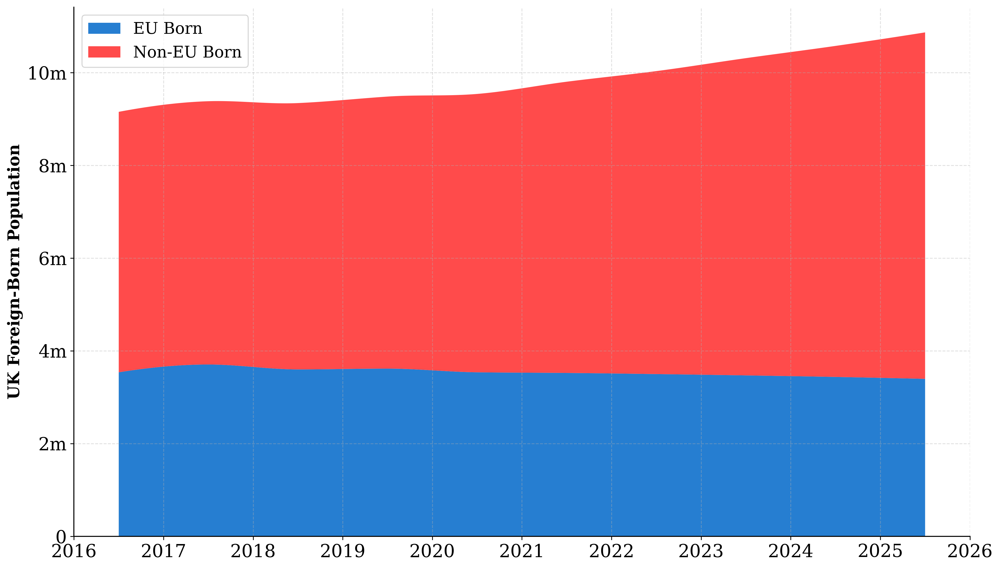

In [11]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy.interpolate import PchipInterpolator

STREAMLIT_COLORS = ["#0068c9", "#ff2b2b", "#29b09d", "#ff8700", "#6d3fc0"]

def format_counts(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:g}m'
    elif x >= 1e3:
        return f'{x*1e-3:g}k'
    else:
        return f'{x:g}'

DATA_DIR = "data/real-stats/"

# ==========================================
# 1. Fetch Real-World Immigration Data
# ==========================================
file_name = "foreign-born-share.xlsx"

df_imm = pd.read_excel(os.path.join(DATA_DIR, file_name))
df_imm = df_imm.rename(columns=lambda x: str(x).strip().lower()) 

# Clean the numerical column (handle commas in "1,491,000")
df_imm["value"] = df_imm["value"].astype(str).str.replace(",", "", regex=False).str.strip()
df_imm["value"] = pd.to_numeric(df_imm["value"], errors="coerce")

df_imm["year"] = pd.to_numeric(df_imm["year"], errors="coerce")
df_imm["cob"] = df_imm["cob"].astype(str).str.strip()
df_imm = df_imm.dropna(subset=["year", "cob", "value"])
df_imm["year"] = df_imm["year"].astype(int)

# Filter for the target years
target_years = df_imm[(df_imm["year"] >= 2016) & (df_imm["year"] <= 2026)]

# Separate into EU and Non-EU
non_eu = target_years[target_years["cob"] == "Non-EU"].sort_values("year")
eu_fb  = target_years[target_years["cob"] == "EU"].sort_values("year")

# Align matching years
shared_years = sorted(list(set(non_eu["year"]).intersection(set(eu_fb["year"]))))

val_non_eu = [non_eu[non_eu["year"] == y]["value"].values[0] for y in shared_years]
val_eu = [eu_fb[eu_fb["year"] == y]["value"].values[0] for y in shared_years]

# Shift by 0.5 to show data smoothly between years
x_pts = np.array(shared_years) + 0.5

# Smooth the arrays 
if len(x_pts) >= 4:
    x_smooth = np.linspace(x_pts.min(), x_pts.max(), 300)
    y_smooth_non_eu = np.maximum(PchipInterpolator(x_pts, val_non_eu)(x_smooth), 0)
    y_smooth_eu = np.maximum(PchipInterpolator(x_pts, val_eu)(x_smooth), 0)
else:
    x_smooth = x_pts
    y_smooth_non_eu = np.array(val_non_eu)
    y_smooth_eu = np.array(val_eu)

# ==========================================
# 2. Plot Configuration
# ==========================================
fig, ax1 = plt.subplots(figsize=(14, 8))

# Axis spine formatting (black lines)
ax1.spines['bottom'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['bottom'].set_linewidth(1.0)
ax1.spines['left'].set_visible(True)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_linewidth(1.0)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Plot Stacked Area
ax1.stackplot(
    x_smooth,
    y_smooth_eu,
    y_smooth_non_eu,
    labels=["EU Born", "Non-EU Born"],
    colors=[STREAMLIT_COLORS[0], STREAMLIT_COLORS[1]], # Red for Non-EU, Blue for EU
    alpha=0.85
)

# Axis Configuration
# ax1.set_xlabel("Year", fontsize=16)
ax1.set_ylabel("UK Foreign-Born Population", fontsize=16, color="black", fontweight="bold")
ax1.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))
ax1.tick_params(axis='y', labelsize=18, labelcolor="black")
ax1.tick_params(axis='x', labelsize=18)
ax1.set_xticks(np.arange(2016, 2027))
ax1.set_xlim(2016, 2026)
ax1.grid(True, linestyle="--", alpha=0.4)

ax1.legend(fontsize=16, loc="upper left")


output_path = os.path.join(OUTPUT_DIR, "real-world_stats/foreign_born_stacked.png")
os.makedirs(os.path.dirname(output_path), exist_ok=True)

plt.tight_layout()
plt.savefig(output_path, dpi=350, bbox_inches='tight')
plt.show()

## Immigration Detention Held in the UK

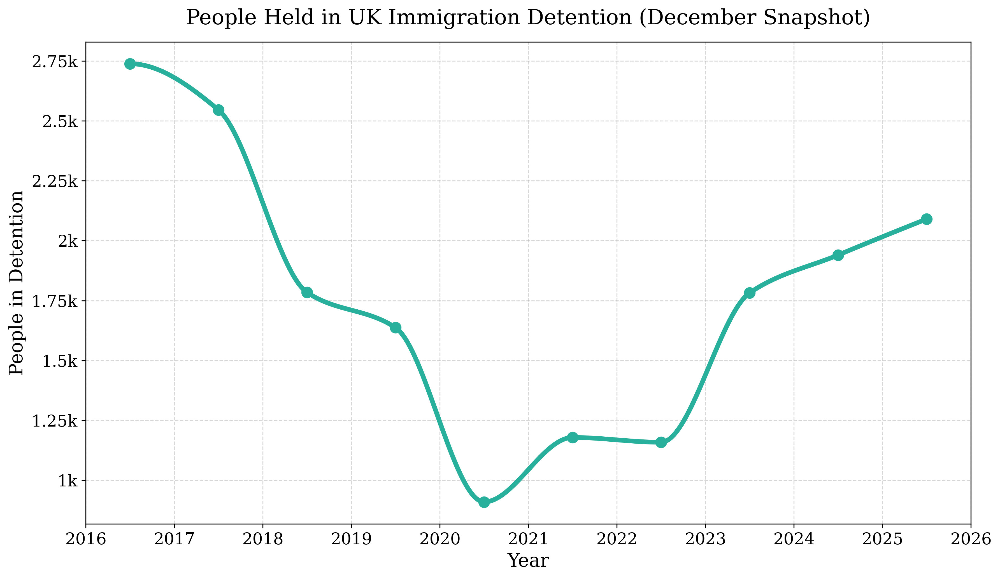

In [30]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy.interpolate import PchipInterpolator

STREAMLIT_COLORS = ["#0068c9", "#ff2b2b", "#29b09d", "#ff8700", "#6d3fc0"]

def format_counts(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:g}m'
    elif x >= 1e3:
        return f'{x*1e-3:g}k'
    else:
        return f'{x:g}'

DATA_DIR = "data/real-stats/"
file_name = "Detention detailed datasets, year ending December 2025.xlsx"

df = pd.read_excel(
    DATA_DIR + file_name,
    sheet_name="Data_Det_D02",
    header=14
)

df.columns = [
    "Date", "Nationality", "Region", "Sex", "Age", "Facility", "Duration", "Count"
]

df["Count"] = pd.to_numeric(df["Count"], errors="coerce").fillna(0)
df["Date"] = pd.to_datetime(df["Date"], errors='coerce')

df_dec = df[df["Date"].dt.month == 12].copy()
df_dec["Year"] = df_dec["Date"].dt.year
df_dec = df_dec[(df_dec["Year"] >= 2016) & (df_dec["Year"] <= 2026)].copy()

yearly = (
    df_dec.groupby("Year")["Count"]
    .sum()
    .reset_index()
    .sort_values("Year")
)

x_points = yearly["Year"].values + 0.5
y_points = yearly["Count"].values

if len(x_points) >= 4:
    x_smooth = np.linspace(x_points.min(), x_points.max(), 300)
    y_smooth = PchipInterpolator(x_points, y_points)(x_smooth)
else:
    x_smooth, y_smooth = x_points, y_points

y_smooth = np.maximum(y_smooth, 0)

fig, ax = plt.subplots(figsize=(12, 7))

ax.plot(
    x_smooth,
    y_smooth,
    color=STREAMLIT_COLORS[2],
    linewidth=4,
    label="People Held"
)
ax.scatter(x_points, y_points, color=STREAMLIT_COLORS[2], s=80, zorder=3)

ax.set_xlabel("Year", fontsize=16)
ax.set_ylabel("People in Detention", fontsize=16)
ax.set_title("People Held in UK Immigration Detention (December Snapshot)", fontsize=18, pad=15)
ax.set_xticks(np.arange(2016, 2027))
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.set_xlim(2016, 2026)

ax.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))

ax.grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "real-world_stats/detention_held.png"), dpi=350)
plt.show()

## Small Boats

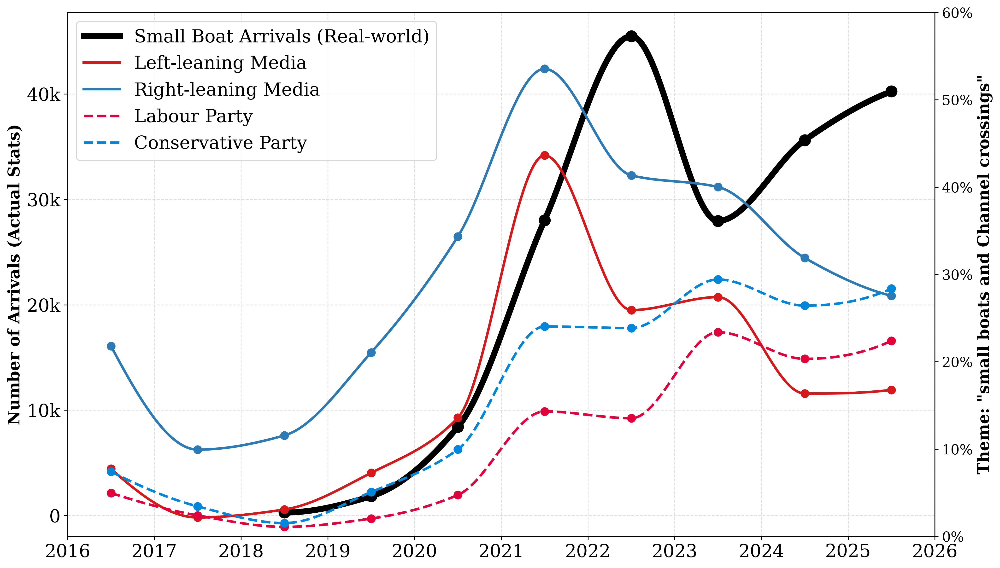

In [8]:
# ==========================================
# 1. Macro & Setup
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy.interpolate import PchipInterpolator

# MACRO: Set to False to disable theme plotting and the secondary axis
INCLUDE_THEMES = True 
# INCLUDE_THEMES = False 

def format_counts(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:g}m'
    elif x >= 1e3:
        return f'{x*1e-3:g}k'
    else:
        return f'{x:g}'

def get_smooth_curves(x_vals, y_vals):
    x_pts = x_vals + 0.5
    y_pts = y_vals
    if len(x_pts) >= 4:
        x_sm = np.linspace(x_pts.min(), x_pts.max(), 300)
        y_sm = np.maximum(PchipInterpolator(x_pts, y_pts)(x_sm), 0)
    else:
        x_sm, y_sm = x_pts, y_pts
    return x_pts, y_pts, x_sm, y_sm

# ==========================================
# 2. Fetch Real-World Small Boats Data
# ==========================================
DATA_DIR = "data/real-stats/"
file_name = "illegal-entry-routes-to-the-uk-dataset-dec-2025.xlsx"
sheet_name = "Data_IER_D02"

df = pd.read_excel(
    DATA_DIR + file_name,
    sheet_name=sheet_name,
    header=1
)

df["Year"] = pd.to_numeric(df["Year"], errors="coerce")
df["Arrivals"] = pd.to_numeric(df["Arrivals"], errors="coerce").fillna(0)
df = df.dropna(subset=["Year"])
# Restrict to 2016-2025
df = df[(df["Year"] >= 2016) & (df["Year"] <= 2025)].copy()

yearly_arrivals = (
    df.groupby("Year")["Arrivals"]
    .sum()
    .reset_index()
    .sort_values("Year")
)

# ==========================================
# 3. Fetch Theme Evolution Data (if enabled)
# ==========================================
TARGET_THEME = "small boats and Channel crossings"

if INCLUDE_THEMES:
    MODEL = "Ensemble"
    START_DATE = "2016-01-01"
    END_DATE = "2025-12-31"  # Restrict to 2025
    
    TAXONOMY_VERSION = None
    if "version" in themes_df.columns:
        vv = pd.to_numeric(themes_df["version"], errors="coerce").dropna()
        if not vv.empty:
            TAXONOMY_VERSION = int(vv.max())

    def get_theme_data(domains):
        # ... logic as before ...
        t = themes_df[
            (themes_df["model"] == MODEL) &
            (themes_df["source_domain"].isin(domains)) &
            (themes_df["month"] >= pd.to_datetime(START_DATE)) &
            (themes_df["month"] <= pd.to_datetime(END_DATE))
        ].copy()
        
        if "version" in t.columns and TAXONOMY_VERSION is not None:
            tver = pd.to_numeric(t["version"], errors="coerce")
            t = t[tver == int(TAXONOMY_VERSION)].copy()
            
        t = t[t["theme"] == TARGET_THEME].copy()
        if t.empty: return pd.DataFrame(columns=["year", "prevalence"])
        
        t["year"] = t["month"].dt.year
        theme_counts = t.groupby(["year"], as_index=False)["count"].sum().rename(columns={"count": "articles"})
        
        s = stance_df[
            (stance_df["model"] == MODEL) &
            (stance_df["source_domain"].isin(domains)) &
            (stance_df["month"] >= pd.to_datetime(START_DATE)) &
            (stance_df["month"] <= pd.to_datetime(END_DATE)) &
            (stance_df["stance"].isin(["OPEN", "RESTRICTIVE", "NEUTRAL"]))
        ].copy()
        
        if s.empty: return pd.DataFrame(columns=["year", "prevalence"])
        s["year"] = s["month"].dt.year
        yearly_totals = s.groupby("year", as_index=False)["count"].sum().rename(columns={"count": "total"})
        
        out = theme_counts.merge(yearly_totals, on="year", how="left")
        out["prevalence"] = np.where(out["total"] > 0, out["articles"] / out["total"], 0.0)
        return out.sort_values("year")

    UK_LEFT_WING = ["theguardian.com", "mirror.co.uk", "independent.co.uk", "huffingtonpost.co.uk", "dailyrecord.co.uk", "thenational.scot", "heraldscotland.com"]
    UK_RIGHT_WING = ["telegraph.co.uk", "dailymail.co.uk", "express.co.uk", "thesun.co.uk", "spectator.co.uk", "thetimes.co.uk", "thescottishsun.co.uk"]
    UK_LABOUR = ["UK Parliament (Lab)"]
    UK_CONSERVATIVE = ["UK Parliament (Con)"]

    df_left = get_theme_data(UK_LEFT_WING)
    df_right = get_theme_data(UK_RIGHT_WING)
    df_lab = get_theme_data(UK_LABOUR)
    df_con = get_theme_data(UK_CONSERVATIVE)

# ==========================================
# 4. Plot Configuration
# ==========================================
fig, ax1 = plt.subplots(figsize=(14, 8))

# Axis 1 (Left): Real-World Arrivals
x_p_rw, y_p_rw, x_s_rw, y_s_rw = get_smooth_curves(yearly_arrivals["Year"].values, yearly_arrivals["Arrivals"].values)

ax1.plot(x_s_rw, y_s_rw, color="black", linewidth=6, label="Small Boat Arrivals (Real-world)", zorder=2)
ax1.scatter(x_p_rw, y_p_rw, color="black", s=120, marker="o", zorder=3)

# ax1.set_xlabel("Year", fontsize=16)
ax1.set_ylabel("Number of Arrivals (Actual Stats)", fontsize=16, color="black", fontweight="bold")
ax1.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))

ax1.tick_params(axis='y', labelsize=18, labelcolor="black")
ax1.tick_params(axis='x', labelsize=18)
ax1.set_xticks(np.arange(2016, 2027)) # Ending at 2026
ax1.set_xlim(2016, 2026)
ax1.grid(True, linestyle="--", alpha=0.4)

if INCLUDE_THEMES:
    # Axis 2 (Right): Theme Prevalence 
    ax2 = ax1.twinx()

    narrative_configs = [
        (df_left,  '#d7191c', 'solid',  "Left-leaning Media"),
        (df_right, '#2c7bb6', 'solid',  "Right-leaning Media"),
        (df_lab,   '#E4003B', 'dashed', "Labour Party"),
        (df_con,   '#0087DC', 'dashed', "Conservative Party")
    ]

    for d_theme, c, style, lbl in narrative_configs:
        if d_theme.empty: continue
        
        x_pts, y_pts, x_sm, y_sm = get_smooth_curves(d_theme["year"].values, d_theme["prevalence"].values)
        
        # Adding theme lines and markers per Rule #1
        ax2.plot(x_sm, y_sm, color=c, linestyle=style, linewidth=2.5, label=lbl)
        ax2.scatter(x_pts, y_pts, color=c, s=60, marker="o", zorder=3)

    # Format secondary y-axis per Rule #2
    ax2.set_ylabel(f'Theme: "{TARGET_THEME}"', fontsize=16, color="black", fontweight="bold")
    ax2.tick_params(axis='y', labelsize=14, labelcolor="black")
    ax2.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0, decimals=0))
    ax2.set_ylim(0, 0.60) # Fixed range to 60%

    # Combine Legends (Inside upper-left per Rule #4)
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, fontsize=18, loc="upper left")
else:
    ax1.legend(fontsize=18, loc="upper left")

# Title removed per Rule #3

# Save with macro name per Rule #6
z = "with_theme" if INCLUDE_THEMES else "no_theme"
output_path = os.path.join(OUTPUT_DIR, f"real-world_stats/small_boats_{z}.png")
os.makedirs(os.path.dirname(output_path), exist_ok=True)

plt.tight_layout()
plt.savefig(output_path, dpi=350, bbox_inches='tight')
plt.show()

## Visa Sponsorships

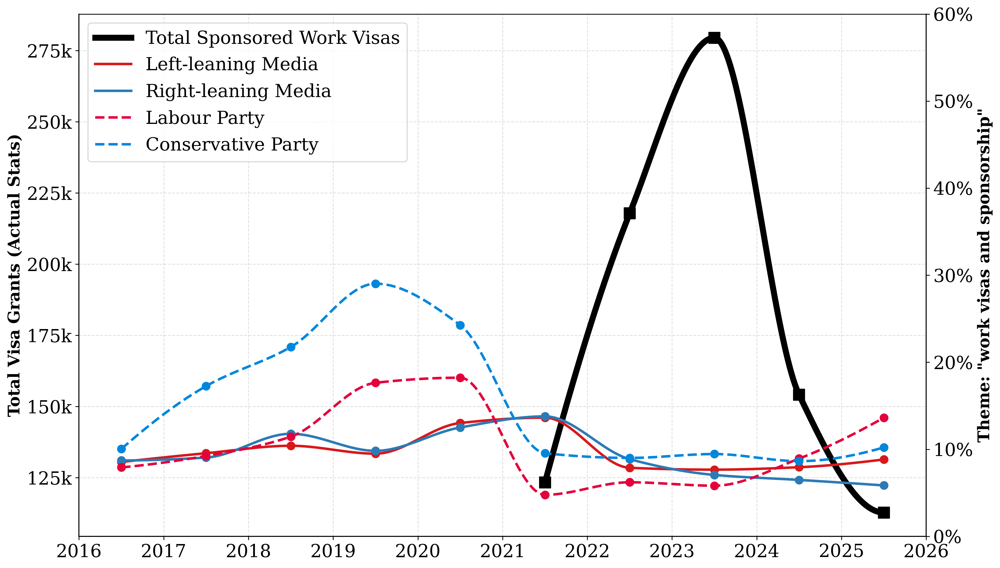

In [18]:
# ==========================================
# 1. Macro & Setup
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy.interpolate import PchipInterpolator

# MACRO: Set to False to disable theme plotting and the secondary axis
INCLUDE_THEMES = True 

def format_counts(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:g}m'
    elif x >= 1e3:
        return f'{x*1e-3:g}k'
    else:
        return f'{x:g}'

def get_smooth_curves(df_year, df_val):
    x_pts = df_year.values + 0.5
    y_pts = df_val.values
    if len(x_pts) >= 4:
        x_sm = np.linspace(x_pts.min(), x_pts.max(), 300)
        y_sm = np.maximum(PchipInterpolator(x_pts, y_pts)(x_sm), 0)
    else:
        x_sm, y_sm = x_pts, y_pts
    return x_pts, y_pts, x_sm, y_sm

DATA_DIR = "data/real-stats/"

# ==========================================
# 2. Fetch Real-World Work Visas Data
# ==========================================
file_name = "Sponsored work entry clearance visas by occupation and industry (SOC 2020), year ending December 2025.xlsx"
df_visas = pd.read_excel(os.path.join(DATA_DIR, file_name), sheet_name="Data_Occ_D02", header=3)
df_visas.columns = df_visas.columns.str.strip()

df_visas["Grants"] = pd.to_numeric(df_visas["Grants"], errors="coerce")
df_visas["Year"] = pd.to_numeric(df_visas["Year"], errors="coerce")
df_visas = df_visas.dropna(subset=["Year", "Grants"])

# Filter years and aggregate all work visas into one single measure per year
df_visas = df_visas[(df_visas["Year"] >= 2016) & (df_visas["Year"] <= 2026)]
total_visas = df_visas.groupby("Year", as_index=False)["Grants"].sum().sort_values("Year")

# ==========================================
# 3. Fetch Theme Evolution Data 
# ==========================================
TARGET_THEME_VISAS = "work visas and sponsorship"

if INCLUDE_THEMES:
    MODEL = "Ensemble"
    START_DATE = "2016-01-01"
    END_DATE = "2025-12-31"

    TAXONOMY_VERSION = None
    if "version" in themes_df.columns:
        vv = pd.to_numeric(themes_df["version"], errors="coerce").dropna()
        if not vv.empty:
            TAXONOMY_VERSION = int(vv.max())

    def get_theme_data(domains, target_theme):
        t = themes_df[
            (themes_df["model"] == MODEL) &
            (themes_df["source_domain"].isin(domains)) &
            (themes_df["month"] >= pd.to_datetime(START_DATE)) &
            (themes_df["month"] <= pd.to_datetime(END_DATE))
        ].copy()
        
        if "version" in t.columns and TAXONOMY_VERSION is not None:
            tver = pd.to_numeric(t["version"], errors="coerce")
            t = t[tver == int(TAXONOMY_VERSION)].copy()
            
        t = t[t["theme"] == target_theme].copy()
        if t.empty: return pd.DataFrame(columns=["year", "prevalence"])
        
        t["year"] = t["month"].dt.year
        theme_counts = t.groupby(["year"], as_index=False)["count"].sum().rename(columns={"count": "articles"})
        
        s = stance_df[
            (stance_df["model"] == MODEL) &
            (stance_df["source_domain"].isin(domains)) &
            (stance_df["month"] >= pd.to_datetime(START_DATE)) &
            (stance_df["month"] <= pd.to_datetime(END_DATE)) &
            (stance_df["stance"].isin(["OPEN", "RESTRICTIVE", "NEUTRAL"]))
        ].copy()
        
        if s.empty: return pd.DataFrame(columns=["year", "prevalence"])
        s["year"] = s["month"].dt.year
        yearly_totals = s.groupby("year", as_index=False)["count"].sum().rename(columns={"count": "total"})
        
        out = theme_counts.merge(yearly_totals, on="year", how="left")
        out["prevalence"] = np.where(out["total"] > 0, out["articles"] / out["total"], 0.0)
        return out.sort_values("year")

    UK_LEFT_WING = ["theguardian.com", "mirror.co.uk", "independent.co.uk", "huffingtonpost.co.uk", "dailyrecord.co.uk", "thenational.scot", "heraldscotland.com"]
    UK_RIGHT_WING = ["telegraph.co.uk", "dailymail.co.uk", "express.co.uk", "thesun.co.uk", "spectator.co.uk", "thetimes.co.uk", "thescottishsun.co.uk"]
    UK_LABOUR = ["UK Parliament (Lab)"]
    UK_CONSERVATIVE = ["UK Parliament (Con)"]

    df_left_visas = get_theme_data(UK_LEFT_WING, TARGET_THEME_VISAS)
    df_right_visas = get_theme_data(UK_RIGHT_WING, TARGET_THEME_VISAS)
    df_lab_visas = get_theme_data(UK_LABOUR, TARGET_THEME_VISAS)
    df_con_visas = get_theme_data(UK_CONSERVATIVE, TARGET_THEME_VISAS)

# ==========================================
# 4. Plot Configuration
# ==========================================
fig, ax1 = plt.subplots(figsize=(14, 8))

# Axis spine formatting (black lines)
ax1.spines['bottom'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['bottom'].set_linewidth(1.0)
ax1.spines['left'].set_visible(True)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_linewidth(1.0)
# ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Calculate Real-world curves for total visas
x_p_all, y_p_all, x_s_all, y_s_all = get_smooth_curves(total_visas["Year"], total_visas["Grants"])

# Proxy artist line for the legend WITHOUT MARKERS
ax1.plot([], [], color="black", linewidth=6, label="Total Sponsored Work Visas")

# Plot Real-world Stats lines and points (Left Axis)
ax1.plot(x_s_all, y_s_all, color="black", linewidth=6, zorder=2)
ax1.scatter(x_p_all, y_p_all, color="black", s=120, marker="s", zorder=3)

ax1.set_ylabel("Total Visa Grants (Actual Stats)", fontsize=16, color="black", fontweight="bold")
ax1.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))
ax1.tick_params(axis='y', labelsize=18, labelcolor="black")
ax1.tick_params(axis='x', labelsize=18)
ax1.set_xticks(np.arange(2016, 2027))
ax1.set_xlim(2016, 2026)
ax1.grid(True, linestyle="--", alpha=0.4)

if INCLUDE_THEMES:
    # Plot Theme Prevalence (Right Axis)
    ax2 = ax1.twinx()
    
    # Axis spine formatting for right axis
    ax2.spines['right'].set_visible(True)
    ax2.spines['right'].set_color('black')
    ax2.spines['right'].set_linewidth(1.0)
    ax2.spines['top'].set_visible(False)
    ax2.spines['left'].set_visible(False)
    ax2.spines['bottom'].set_visible(False)
    
    narrative_configs = [
        (df_left_visas,  '#d7191c', 'solid',  "Left-leaning Media"),
        (df_right_visas, '#2c7bb6', 'solid',  "Right-leaning Media"),
        (df_lab_visas,   '#E4003B', 'dashed', "Labour Party"),
        (df_con_visas,   '#0087DC', 'dashed', "Conservative Party")
    ]

    for d_theme, c, style, lbl in narrative_configs:
        if d_theme.empty: continue
        
        x_pts, y_pts, x_sm, y_sm = get_smooth_curves(d_theme["year"], d_theme["prevalence"])
            
        # Proxy artist line for narrative legends WITHOUT MARKERS
        ax2.plot([], [], color=c, linestyle=style, linewidth=2.5, label=lbl)
        
        # Adding actual theme lines and markers
        ax2.plot(x_sm, y_sm, color=c, linestyle=style, linewidth=2.5, zorder=2)
        ax2.scatter(x_pts, y_pts, color=c, s=60, marker="o", zorder=3)

    # Format secondary y-axis 
    ax2.set_ylabel(f'Theme: "{TARGET_THEME_VISAS}"', fontsize=16, color="black", fontweight="bold")
    ax2.tick_params(axis='y', labelsize=18, labelcolor="black")
    ax2.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0, decimals=0))
    ax2.set_ylim(0, 0.60) # Fixed range to 60%

    # Combine Legends (Inside upper-left)
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, fontsize=18, loc="upper left")
else:
    ax1.legend(fontsize=18, loc="upper left")

# Save with macro name
# if "OUTPUT_DIR" not in globals():
#     OUTPUT_DIR = "output/"

z = "with_theme" if INCLUDE_THEMES else "no_theme"
output_path = os.path.join(OUTPUT_DIR, f"real-world_stats/total_work_visas_{z}.png")
os.makedirs(os.path.dirname(output_path), exist_ok=True)

plt.tight_layout()
plt.savefig(output_path, dpi=350, bbox_inches='tight')
plt.show()

## Sponsored Study Entry Clearance

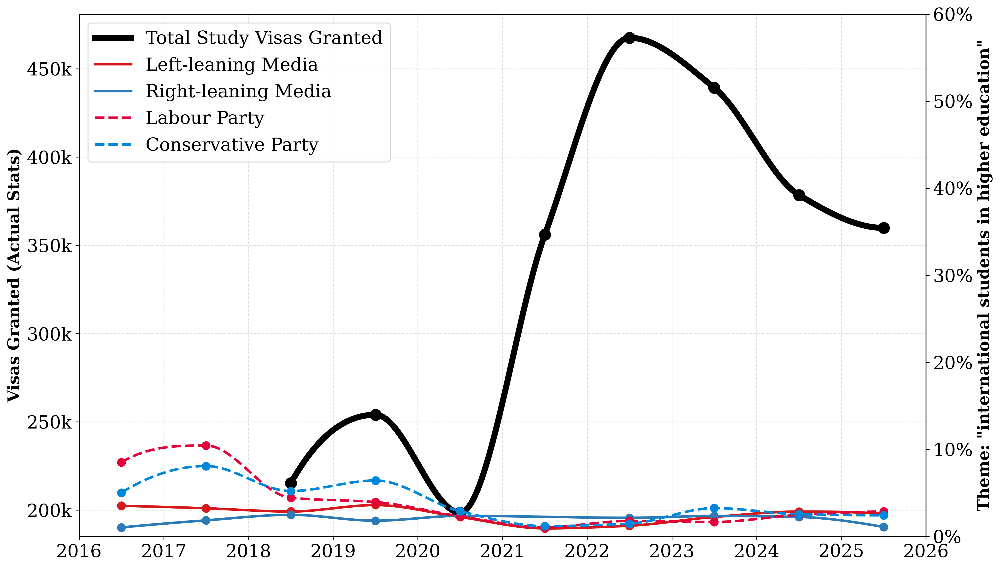

In [13]:
# ==========================================
# 1. Macro & Setup
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy.interpolate import PchipInterpolator

# MACRO: Set to False to disable theme plotting and the secondary axis
INCLUDE_THEMES = True 

def format_counts(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:g}m'
    elif x >= 1e3:
        return f'{x*1e-3:g}k'
    else:
        return f'{x:g}'

def get_smooth_curves(x_vals, y_vals):
    x_pts = np.array(x_vals) + 0.5
    y_pts = np.array(y_vals)
    if len(x_pts) >= 4:
        x_sm = np.linspace(x_pts.min(), x_pts.max(), 300)
        y_sm = np.maximum(PchipInterpolator(x_pts, y_pts)(x_sm), 0)
    else:
        x_sm, y_sm = x_pts, y_pts
    return x_pts, y_pts, x_sm, y_sm

# ==========================================
# 2. Fetch Real-World Sponsored Study Data
# ==========================================
DATA_DIR = "data/real-stats/"
file_name = "Sponsored study entry clearance visas by course level, year ending September 2025.xlsx"
file_path = DATA_DIR + file_name

# Load real-world data and aggregate totals
df_study = pd.read_excel(file_path, sheet_name="Data_Edu_D02", header=2)
df_study.columns = df_study.columns.str.strip()
df_study["Grants"] = pd.to_numeric(df_study["Grants"], errors="coerce")
df_study["Year"] = pd.to_numeric(df_study["Year"], errors="coerce")
df_study = df_study.dropna(subset=["Year", "Grants"])

yearly_study = df_study.groupby("Year")["Grants"].sum().reset_index()
yearly_study = yearly_study[(yearly_study["Year"] >= 2016) & (yearly_study["Year"] <= 2026)].sort_values("Year")

# ==========================================
# 3. Fetch Theme Evolution Data 
# ==========================================
TARGET_THEME_STUDY = "international students in higher education"

if INCLUDE_THEMES:
    MODEL = "Ensemble"
    START_DATE = "2016-01-01"
    END_DATE = "2025-12-31"

    TAXONOMY_VERSION = None
    if "version" in themes_df.columns:
        vv = pd.to_numeric(themes_df["version"], errors="coerce").dropna()
        if not vv.empty:
            TAXONOMY_VERSION = int(vv.max())

    def get_theme_data(domains, target_theme):
        t = themes_df[
            (themes_df["model"] == MODEL) &
            (themes_df["source_domain"].isin(domains)) &
            (themes_df["month"] >= pd.to_datetime(START_DATE)) &
            (themes_df["month"] <= pd.to_datetime(END_DATE))
        ].copy()
        
        if "version" in t.columns and TAXONOMY_VERSION is not None:
            tver = pd.to_numeric(t["version"], errors="coerce")
            t = t[tver == int(TAXONOMY_VERSION)].copy()
            
        t = t[t["theme"] == target_theme].copy()
        if t.empty: return pd.DataFrame(columns=["year", "prevalence"])
        
        t["year"] = t["month"].dt.year
        theme_counts = t.groupby(["year"], as_index=False)["count"].sum().rename(columns={"count": "articles"})
        
        s = stance_df[
            (stance_df["model"] == MODEL) &
            (stance_df["source_domain"].isin(domains)) &
            (stance_df["month"] >= pd.to_datetime(START_DATE)) &
            (stance_df["month"] <= pd.to_datetime(END_DATE)) &
            (stance_df["stance"].isin(["OPEN", "RESTRICTIVE", "NEUTRAL"]))
        ].copy()
        
        if s.empty: return pd.DataFrame(columns=["year", "prevalence"])
        s["year"] = s["month"].dt.year
        yearly_totals = s.groupby("year", as_index=False)["count"].sum().rename(columns={"count": "total"})
        
        out = theme_counts.merge(yearly_totals, on="year", how="left")
        out["prevalence"] = np.where(out["total"] > 0, out["articles"] / out["total"], 0.0)
        return out.sort_values("year")

    UK_LEFT_WING = ["theguardian.com", "mirror.co.uk", "independent.co.uk", "huffingtonpost.co.uk", "dailyrecord.co.uk", "thenational.scot", "heraldscotland.com"]
    UK_RIGHT_WING = ["telegraph.co.uk", "dailymail.co.uk", "express.co.uk", "thesun.co.uk", "spectator.co.uk", "thetimes.co.uk", "thescottishsun.co.uk"]
    UK_LABOUR = ["UK Parliament (Lab)"]
    UK_CONSERVATIVE = ["UK Parliament (Con)"]

    df_left_study = get_theme_data(UK_LEFT_WING, TARGET_THEME_STUDY)
    df_right_study = get_theme_data(UK_RIGHT_WING, TARGET_THEME_STUDY)
    df_lab_study = get_theme_data(UK_LABOUR, TARGET_THEME_STUDY)
    df_con_study = get_theme_data(UK_CONSERVATIVE, TARGET_THEME_STUDY)

# ==========================================
# 4. Plot Configuration
# ==========================================
fig, ax1 = plt.subplots(figsize=(14, 8))

# Axis 1 (Left): Real-World Arrivals
x_year = yearly_study["Year"].values
y_grants = yearly_study["Grants"].values
x_p_study, y_p_study, x_s_study, y_s_study = get_smooth_curves(x_year, y_grants)

ax1.plot(x_s_study, y_s_study, color="black", linewidth=6, label="Total Study Visas Granted", zorder=2)
ax1.scatter(x_p_study, y_p_study, color="black", s=120, marker="o", zorder=3)

# ax1.set_xlabel("Year", fontsize=16)
ax1.set_ylabel("Visas Granted (Actual Stats)", fontsize=16, color="black", fontweight="bold")
ax1.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))

ax1.tick_params(axis='y', labelsize=18, labelcolor="black")
ax1.tick_params(axis='x', labelsize=18)
ax1.set_xticks(np.arange(2016, 2027)) 
ax1.set_xlim(2016, 2026)
ax1.grid(True, linestyle="--", alpha=0.4)

if INCLUDE_THEMES:
    # Axis 2 (Right): Theme Prevalence 
    ax2 = ax1.twinx()

    narrative_configs = [
        (df_left_study,  '#d7191c', 'solid',  "Left-leaning Media"),
        (df_right_study, '#2c7bb6', 'solid',  "Right-leaning Media"),
        (df_lab_study,   '#E4003B', 'dashed', "Labour Party"),
        (df_con_study,   '#0087DC', 'dashed', "Conservative Party")
    ]

    for d_theme, c, style, lbl in narrative_configs:
        if d_theme.empty: continue
        
        x_pts, y_pts, x_sm, y_sm = get_smooth_curves(d_theme["year"].values, d_theme["prevalence"].values)
        
        # Adding theme lines and markers
        ax2.plot(x_sm, y_sm, color=c, linestyle=style, linewidth=2.5, label=lbl)
        ax2.scatter(x_pts, y_pts, color=c, s=60, marker="o", zorder=3)

    # Format secondary y-axis 
    ax2.set_ylabel(f'Theme: "{TARGET_THEME_STUDY}"', fontsize=16, color="black", fontweight="bold")
    ax2.tick_params(axis='y', labelsize=18, labelcolor="black")
    ax2.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0, decimals=0))
    ax2.set_ylim(0, 0.60) # Fixed range to 60%

    # Combine Legends (Inside upper-left)
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, fontsize=18, loc="upper left")
else:
    ax1.legend(fontsize=18, loc="upper left")

# Title removed dynamically...

# Save with macro name
z = "with_theme" if INCLUDE_THEMES else "no_theme"
output_path = os.path.join(OUTPUT_DIR, f"real-world_stats/sponsored_study_visa_{z}.png")
os.makedirs(os.path.dirname(output_path), exist_ok=True)

plt.tight_layout()
plt.savefig(output_path, dpi=350, bbox_inches='tight')
plt.show()

## Refugee Family Reunion Visas

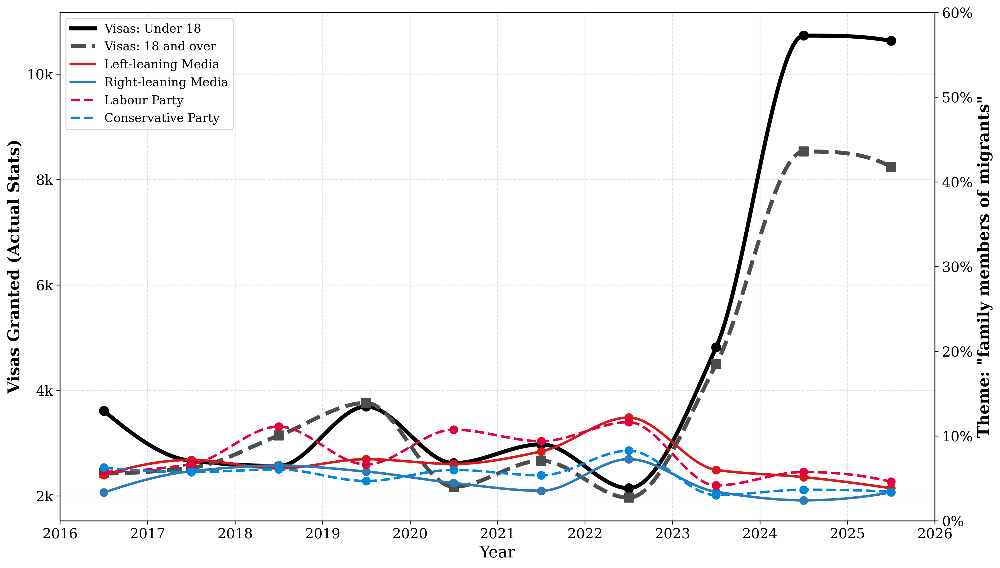

In [ ]:
# ==========================================
# 1. Macro & Setup
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy.interpolate import PchipInterpolator

# MACRO: Set to False to disable theme plotting and the secondary axis
INCLUDE_THEMES = True 

def format_counts(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:g}m'
    elif x >= 1e3:
        return f'{x*1e-3:g}k'
    else:
        return f'{x:g}'

def get_smooth_curves(x_vals, y_vals):
    x_pts = np.array(x_vals) + 0.5
    y_pts = np.array(y_vals)
    if len(x_pts) >= 4:
        x_sm = np.linspace(x_pts.min(), x_pts.max(), 300)
        y_sm = np.maximum(PchipInterpolator(x_pts, y_pts)(x_sm), 0)
    else:
        x_sm, y_sm = x_pts, y_pts
    return x_pts, y_pts, x_sm, y_sm

# ==========================================
# 2. Fetch Real-World Family Reunion Visas 
# ==========================================
DATA_DIR = "data/real-stats/"
file_name = "Refugee family reunion visa grants detailed datasets, year ending December 2025.xlsx"
file_path = DATA_DIR + file_name

# Load real-world data
df_fam = pd.read_excel(file_path, sheet_name="Data_Fam_D01", header=1)
df_fam.columns = df_fam.columns.str.strip()
df_fam["Visas granted"] = pd.to_numeric(df_fam["Visas granted"], errors="coerce")
df_fam["Year"] = pd.to_numeric(df_fam["Year"], errors="coerce")
df_fam = df_fam.dropna(subset=["Year", "Visas granted"])
df_fam = df_fam[(df_fam["Year"] >= 2016) & (df_fam["Year"] <= 2026)].copy()

# Filter and Group by "Under 18" vs "18 and over"
valid_over_18 = ["18-29", "30-49", "50-69", "70+"]

def categorize_age(age):
    if age == "Under 18":
        return "Under 18"
    elif age in valid_over_18:
        return "18 and over"
    else:
        return "Exclude"

df_fam["AgeGroup"] = df_fam["Age"].apply(categorize_age)
df_fam = df_fam[df_fam["AgeGroup"] != "Exclude"]

yearly_fam = df_fam.groupby(["Year", "AgeGroup"])["Visas granted"].sum().unstack("AgeGroup").fillna(0)
yearly_fam = yearly_fam.reindex(columns=["Under 18", "18 and over"])

# ==========================================
# 3. Fetch Theme Evolution Data 
# ==========================================
TARGET_THEME_FAM = "family members of migrants"

if INCLUDE_THEMES:
    MODEL = "Ensemble"
    START_DATE = "2016-01-01"
    END_DATE = "2025-12-31"

    TAXONOMY_VERSION = None
    if "version" in themes_df.columns:
        vv = pd.to_numeric(themes_df["version"], errors="coerce").dropna()
        if not vv.empty:
            TAXONOMY_VERSION = int(vv.max())

    def get_theme_data(domains, target_theme):
        t = themes_df[
            (themes_df["model"] == MODEL) &
            (themes_df["source_domain"].isin(domains)) &
            (themes_df["month"] >= pd.to_datetime(START_DATE)) &
            (themes_df["month"] <= pd.to_datetime(END_DATE))
        ].copy()
        
        if "version" in t.columns and TAXONOMY_VERSION is not None:
            tver = pd.to_numeric(t["version"], errors="coerce")
            t = t[tver == int(TAXONOMY_VERSION)].copy()
            
        t = t[t["theme"] == target_theme].copy()
        if t.empty: return pd.DataFrame(columns=["year", "prevalence"])
        
        t["year"] = t["month"].dt.year
        theme_counts = t.groupby(["year"], as_index=False)["count"].sum().rename(columns={"count": "articles"})
        
        s = stance_df[
            (stance_df["model"] == MODEL) &
            (stance_df["source_domain"].isin(domains)) &
            (stance_df["month"] >= pd.to_datetime(START_DATE)) &
            (stance_df["month"] <= pd.to_datetime(END_DATE)) &
            (stance_df["stance"].isin(["OPEN", "RESTRICTIVE", "NEUTRAL"]))
        ].copy()
        
        if s.empty: return pd.DataFrame(columns=["year", "prevalence"])
        s["year"] = s["month"].dt.year
        yearly_totals = s.groupby("year", as_index=False)["count"].sum().rename(columns={"count": "total"})
        
        out = theme_counts.merge(yearly_totals, on="year", how="left")
        out["prevalence"] = np.where(out["total"] > 0, out["articles"] / out["total"], 0.0)
        return out.sort_values("year")

    UK_LEFT_WING = ["theguardian.com", "mirror.co.uk", "independent.co.uk", "huffingtonpost.co.uk", "dailyrecord.co.uk", "thenational.scot", "heraldscotland.com"]
    UK_RIGHT_WING = ["telegraph.co.uk", "dailymail.co.uk", "express.co.uk", "thesun.co.uk", "spectator.co.uk", "thetimes.co.uk", "thescottishsun.co.uk"]
    UK_LABOUR = ["UK Parliament (Lab)"]
    UK_CONSERVATIVE = ["UK Parliament (Con)"]

    df_left_fam = get_theme_data(UK_LEFT_WING, TARGET_THEME_FAM)
    df_right_fam = get_theme_data(UK_RIGHT_WING, TARGET_THEME_FAM)
    df_lab_fam = get_theme_data(UK_LABOUR, TARGET_THEME_FAM)
    df_con_fam = get_theme_data(UK_CONSERVATIVE, TARGET_THEME_FAM)

# ==========================================
# 4. Plot Configuration
# ==========================================
fig, ax1 = plt.subplots(figsize=(14, 8))

# Left Axis: Real-world Family Visas
x_year = np.array(yearly_fam.index)

x_p_u18, y_p_u18, x_s_u18, y_s_u18 = get_smooth_curves(x_year, yearly_fam["Under 18"].values)
ax1.plot(x_s_u18, y_s_u18, color="black", linewidth=6, label="Visas: Under 18", zorder=2)
ax1.scatter(x_p_u18, y_p_u18, color="black", s=120, marker="o", zorder=3)

x_p_o18, y_p_o18, x_s_o18, y_s_o18 = get_smooth_curves(x_year, yearly_fam["18 and over"].values)
ax1.plot(x_s_o18, y_s_o18, color="#4d4d4d", linewidth=6, linestyle="--", label="Visas: 18 and over", zorder=2)
ax1.scatter(x_p_o18, y_p_o18, color="#4d4d4d", s=120, marker="s", zorder=3)

ax1.set_xlabel("Year", fontsize=16)
ax1.set_ylabel("Visas Granted (Actual Stats)", fontsize=16, color="black", fontweight="bold")
ax1.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))
ax1.tick_params(axis='y', labelsize=14, labelcolor="black")
ax1.tick_params(axis='x', labelsize=14)
ax1.set_xticks(np.arange(2016, 2027))
ax1.set_xlim(2016, 2026)
ax1.grid(True, linestyle="--", alpha=0.4)

if INCLUDE_THEMES:
    # Right Axis: Theme Prevalence
    ax2 = ax1.twinx()
    narrative_configs_fam = [
        (df_left_fam,  '#d7191c', 'solid',  "Left-leaning Media"),
        (df_right_fam, '#2c7bb6', 'solid',  "Right-leaning Media"),
        (df_lab_fam,   '#E4003B', 'dashed', "Labour Party"),
        (df_con_fam,   '#0087DC', 'dashed', "Conservative Party")
    ]

    for d_theme, c, style, lbl in narrative_configs_fam:
        if d_theme.empty: continue
        
        x_pts, y_pts, x_sm, y_sm = get_smooth_curves(d_theme["year"].values, d_theme["prevalence"].values)
        
        # Adding theme lines and markers
        ax2.plot(x_sm, y_sm, color=c, linestyle=style, linewidth=2.5, label=lbl)
        ax2.scatter(x_pts, y_pts, color=c, s=60, marker="o", zorder=3)

    # Format secondary y-axis 
    ax2.set_ylabel(f'Theme: "{TARGET_THEME_FAM}"', fontsize=16, color="black", fontweight="bold")
    ax2.tick_params(axis='y', labelsize=14, labelcolor="black")
    ax2.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0, decimals=0))
    ax2.set_ylim(0, 0.60) # Fixed range to 60%

    # Combine Legends (Inside upper-left)
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, fontsize=18, loc="upper left")
else:
    ax1.legend(fontsize=18, loc="upper left")

# Save with macro name
z = "with_theme" if INCLUDE_THEMES else "no_theme"
output_path = os.path.join(OUTPUT_DIR, f"real-world_stats/refugee_reunion_{z}.png")
os.makedirs(os.path.dirname(output_path), exist_ok=True)

plt.tight_layout()
plt.savefig(output_path, dpi=350, bbox_inches='tight')
plt.show()

## Detention + Returns

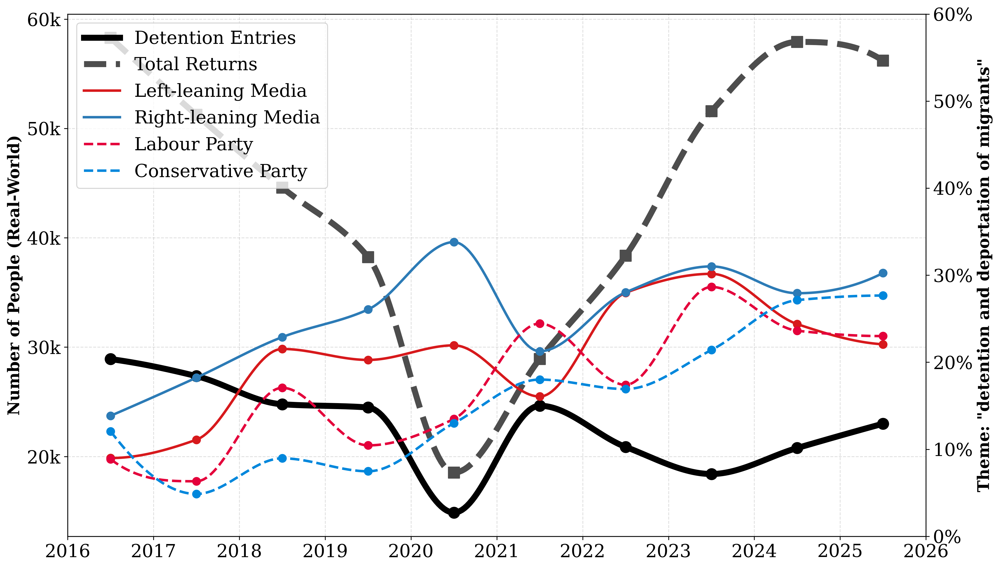

In [14]:
# ==========================================
# 1. Macro & Setup
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy.interpolate import PchipInterpolator

# MACRO: Set to False to disable theme plotting and the secondary axis
INCLUDE_THEMES = True 

def format_counts(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:g}m'
    elif x >= 1e3:
        return f'{x*1e-3:g}k'
    else:
        return f'{x:g}'

def get_smooth_curves(df_year, df_val):
    x_pts = df_year.values + 0.5
    y_pts = df_val.values
    if len(x_pts) >= 4:
        x_sm = np.linspace(x_pts.min(), x_pts.max(), 300)
        y_sm = np.maximum(PchipInterpolator(x_pts, y_pts)(x_sm), 0)
    else:
        x_sm, y_sm = x_pts, y_pts
    return x_pts, y_pts, x_sm, y_sm

DATA_DIR = "data/real-stats/"

# ==========================================
# 2. Fetch Real-World Detention & Returns
# ==========================================
# --- Detention Entries ---
file_det = "Detention detailed datasets, year ending December 2025.xlsx"
df_det = pd.read_excel(DATA_DIR + file_det, sheet_name="Data_Det_D01", header=14)
df_det.columns = ["Year", "Quarter", "Nationality", "Region", "Sex", "Age", "Facility", "Count"]
df_det["Year"] = pd.to_numeric(df_det["Year"], errors="coerce")
df_det["Count"] = pd.to_numeric(df_det["Count"], errors="coerce")
df_det = df_det.dropna(subset=["Year", "Count"])

yearly_det = df_det.groupby("Year")["Count"].sum().reset_index().sort_values("Year")
yearly_det = yearly_det[(yearly_det["Year"] >= 2016) & (yearly_det["Year"] <= 2026)].copy()

# --- Total Returns ---
file_ret = "returns-datasets-dec-2025.xlsx"
df_ret_tot = pd.read_excel(DATA_DIR + file_ret, sheet_name="Data_Ret_D01", header=1)
df_ret_tot["Year"] = pd.to_numeric(df_ret_tot["Year"], errors="coerce")
df_ret_tot["Number of returns"] = pd.to_numeric(df_ret_tot["Number of returns"], errors="coerce")
yearly_ret = df_ret_tot.dropna(subset=["Year", "Number of returns"]).groupby("Year")["Number of returns"].sum().reset_index()
yearly_ret = yearly_ret[(yearly_ret["Year"] >= 2016) & (yearly_ret["Year"] <= 2026)].sort_values("Year")

# ==========================================
# 3. Fetch Theme Evolution Data 
# ==========================================
TARGET_THEME = "detention and deportation of migrants"

if INCLUDE_THEMES:
    MODEL = "Ensemble"
    START_DATE = "2016-01-01"
    END_DATE = "2025-12-31"

    TAXONOMY_VERSION = None
    if "version" in themes_df.columns:
        vv = pd.to_numeric(themes_df["version"], errors="coerce").dropna()
        if not vv.empty:
            TAXONOMY_VERSION = int(vv.max())

    def get_theme_data(domains, target_theme):
        t = themes_df[
            (themes_df["model"] == MODEL) &
            (themes_df["source_domain"].isin(domains)) &
            (themes_df["month"] >= pd.to_datetime(START_DATE)) &
            (themes_df["month"] <= pd.to_datetime(END_DATE))
        ].copy()
        
        if "version" in t.columns and TAXONOMY_VERSION is not None:
            tver = pd.to_numeric(t["version"], errors="coerce")
            t = t[tver == int(TAXONOMY_VERSION)].copy()
            
        t = t[t["theme"] == target_theme].copy()
        if t.empty: return pd.DataFrame(columns=["year", "prevalence"])
        
        t["year"] = t["month"].dt.year
        theme_counts = t.groupby(["year"], as_index=False)["count"].sum().rename(columns={"count": "articles"})
        
        s = stance_df[
            (stance_df["model"] == MODEL) &
            (stance_df["source_domain"].isin(domains)) &
            (stance_df["month"] >= pd.to_datetime(START_DATE)) &
            (stance_df["month"] <= pd.to_datetime(END_DATE)) &
            (stance_df["stance"].isin(["OPEN", "RESTRICTIVE", "NEUTRAL"]))
        ].copy()
        
        if s.empty: return pd.DataFrame(columns=["year", "prevalence"])
        s["year"] = s["month"].dt.year
        yearly_totals = s.groupby("year", as_index=False)["count"].sum().rename(columns={"count": "total"})
        
        out = theme_counts.merge(yearly_totals, on="year", how="left")
        out["prevalence"] = np.where(out["total"] > 0, out["articles"] / out["total"], 0.0)
        return out.sort_values("year")

    UK_LEFT_WING = ["theguardian.com", "mirror.co.uk", "independent.co.uk", "huffingtonpost.co.uk", "dailyrecord.co.uk", "thenational.scot", "heraldscotland.com"]
    UK_RIGHT_WING = ["telegraph.co.uk", "dailymail.co.uk", "express.co.uk", "thesun.co.uk", "spectator.co.uk", "thetimes.co.uk", "thescottishsun.co.uk"]
    UK_LABOUR = ["UK Parliament (Lab)"]
    UK_CONSERVATIVE = ["UK Parliament (Con)"]

    df_left = get_theme_data(UK_LEFT_WING, TARGET_THEME)
    df_right = get_theme_data(UK_RIGHT_WING, TARGET_THEME)
    df_lab = get_theme_data(UK_LABOUR, TARGET_THEME)
    df_con = get_theme_data(UK_CONSERVATIVE, TARGET_THEME)

# ==========================================
# 4. Plot Configuration
# ==========================================
fig, ax1 = plt.subplots(figsize=(14, 8))

# Calculate Real-world curves
x_p_det, y_p_det, x_s_det, y_s_det = get_smooth_curves(yearly_det["Year"], yearly_det["Count"])
x_p_ret, y_p_ret, x_s_ret, y_s_ret = get_smooth_curves(yearly_ret["Year"], yearly_ret["Number of returns"])

# Plot Real-world Stats (Left Axis)
ax1.plot(x_s_det, y_s_det, color="black", linewidth=6, label="Detention Entries", zorder=2)
ax1.scatter(x_p_det, y_p_det, color="black", s=120, marker="o", zorder=3)

ax1.plot(x_s_ret, y_s_ret, color="#4d4d4d", linewidth=6, linestyle="--", label="Total Returns", zorder=2)
ax1.scatter(x_p_ret, y_p_ret, color="#4d4d4d", s=120, marker="s", zorder=3)

# ax1.set_xlabel("Year", fontsize=16)
ax1.set_ylabel("Number of People (Real-World)", fontsize=16, color="black", fontweight="bold")
ax1.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))
ax1.tick_params(axis='y', labelsize=18, labelcolor="black")
ax1.tick_params(axis='x', labelsize=18)
ax1.set_xticks(np.arange(2016, 2027))
ax1.set_xlim(2016, 2026)
ax1.grid(True, linestyle="--", alpha=0.4)

if INCLUDE_THEMES:
    # Plot Theme Prevalence (Right Axis)
    ax2 = ax1.twinx()
    narrative_configs = [
        (df_left,  '#d7191c', 'solid',  "Left-leaning Media"),
        (df_right, '#2c7bb6', 'solid',  "Right-leaning Media"),
        (df_lab,   '#E4003B', 'dashed', "Labour Party"),
        (df_con,   '#0087DC', 'dashed', "Conservative Party")
    ]

    for d_theme, c, style, lbl in narrative_configs:
        if d_theme.empty: continue
        
        x_pts, y_pts, x_sm, y_sm = get_smooth_curves(d_theme["year"], d_theme["prevalence"])
        
        # Adding theme lines and markers
        ax2.plot(x_sm, y_sm, color=c, linestyle=style, linewidth=2.5, label=lbl)
        ax2.scatter(x_pts, y_pts, color=c, s=60, marker="o", zorder=3)

    # Format secondary y-axis
    ax2.set_ylabel(f'Theme: "{TARGET_THEME}"', fontsize=16, color="black", fontweight="bold")
    ax2.tick_params(axis='y', labelsize=18, labelcolor="black")
    ax2.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0, decimals=0))
    ax2.set_ylim(0, 0.60) # Fixed range to 60%

    # Combine Legends (Inside upper-left)
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, fontsize=18, loc="upper left")
else:
    ax1.legend(fontsize=18, loc="upper left")

# Title removed...

# Save with macro name
z = "with_theme" if INCLUDE_THEMES else "no_theme"
output_path = os.path.join(OUTPUT_DIR, f"real-world_stats/detention_returns_{z}.png")
os.makedirs(os.path.dirname(output_path), exist_ok=True)

plt.tight_layout()
plt.savefig(output_path, dpi=350, bbox_inches='tight')
plt.show()

## Criminal Returns

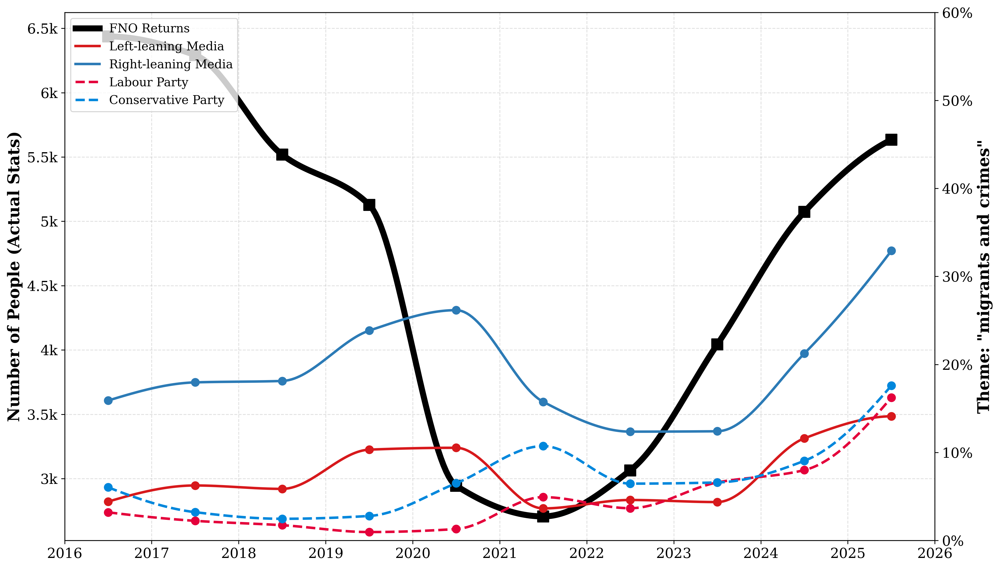

In [15]:
# ==========================================
# 1. Macro & Setup
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy.interpolate import PchipInterpolator

# MACRO: Set to False to disable theme plotting and the secondary axis
INCLUDE_THEMES = True 

def format_counts(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:g}m'
    elif x >= 1e3:
        return f'{x*1e-3:g}k'
    else:
        return f'{x:g}'

def get_smooth_curves(df_year, df_val):
    x_pts = df_year.values + 0.5
    y_pts = df_val.values
    if len(x_pts) >= 4:
        x_sm = np.linspace(x_pts.min(), x_pts.max(), 300)
        y_sm = np.maximum(PchipInterpolator(x_pts, y_pts)(x_sm), 0)
    else:
        x_sm, y_sm = x_pts, y_pts
    return x_pts, y_pts, x_sm, y_sm

DATA_DIR = "data/real-stats/"

# ==========================================
# 2. Fetch Real-World FNO Returns
# ==========================================
file_ret = "returns-datasets-dec-2025.xlsx"
df_fno = pd.read_excel(DATA_DIR + file_ret, sheet_name="Data_Ret_D03", header=1)
df_fno["Year"] = pd.to_numeric(df_fno["Year"], errors="coerce")
df_fno["Number of foreign national offender returns"] = pd.to_numeric(df_fno["Number of foreign national offender returns"], errors="coerce")

yearly_fno = df_fno.dropna(subset=["Year", "Number of foreign national offender returns"]).groupby("Year")["Number of foreign national offender returns"].sum().reset_index()
yearly_fno = yearly_fno[(yearly_fno["Year"] >= 2016) & (yearly_fno["Year"] <= 2026)].sort_values("Year")

# ==========================================
# 3. Fetch Theme Evolution Data 
# ==========================================
TARGET_THEME_FNO = "migrants and crimes"

if INCLUDE_THEMES:
    MODEL = "Ensemble"
    START_DATE = "2016-01-01"
    END_DATE = "2025-12-31"

    TAXONOMY_VERSION = None
    if "version" in themes_df.columns:
        vv = pd.to_numeric(themes_df["version"], errors="coerce").dropna()
        if not vv.empty:
            TAXONOMY_VERSION = int(vv.max())

    def get_theme_data(domains, target_theme):
        t = themes_df[
            (themes_df["model"] == MODEL) &
            (themes_df["source_domain"].isin(domains)) &
            (themes_df["month"] >= pd.to_datetime(START_DATE)) &
            (themes_df["month"] <= pd.to_datetime(END_DATE))
        ].copy()
        
        if "version" in t.columns and TAXONOMY_VERSION is not None:
            tver = pd.to_numeric(t["version"], errors="coerce")
            t = t[tver == int(TAXONOMY_VERSION)].copy()
            
        t = t[t["theme"] == target_theme].copy()
        if t.empty: return pd.DataFrame(columns=["year", "prevalence"])
        
        t["year"] = t["month"].dt.year
        theme_counts = t.groupby(["year"], as_index=False)["count"].sum().rename(columns={"count": "articles"})
        
        s = stance_df[
            (stance_df["model"] == MODEL) &
            (stance_df["source_domain"].isin(domains)) &
            (stance_df["month"] >= pd.to_datetime(START_DATE)) &
            (stance_df["month"] <= pd.to_datetime(END_DATE)) &
            (stance_df["stance"].isin(["OPEN", "RESTRICTIVE", "NEUTRAL"]))
        ].copy()
        
        if s.empty: return pd.DataFrame(columns=["year", "prevalence"])
        s["year"] = s["month"].dt.year
        yearly_totals = s.groupby("year", as_index=False)["count"].sum().rename(columns={"count": "total"})
        
        out = theme_counts.merge(yearly_totals, on="year", how="left")
        out["prevalence"] = np.where(out["total"] > 0, out["articles"] / out["total"], 0.0)
        return out.sort_values("year")

    UK_LEFT_WING = ["theguardian.com", "mirror.co.uk", "independent.co.uk", "huffingtonpost.co.uk", "dailyrecord.co.uk", "thenational.scot", "heraldscotland.com"]
    UK_RIGHT_WING = ["telegraph.co.uk", "dailymail.co.uk", "express.co.uk", "thesun.co.uk", "spectator.co.uk", "thetimes.co.uk", "thescottishsun.co.uk"]
    UK_LABOUR = ["UK Parliament (Lab)"]
    UK_CONSERVATIVE = ["UK Parliament (Con)"]

    df_left_fno = get_theme_data(UK_LEFT_WING, TARGET_THEME_FNO)
    df_right_fno = get_theme_data(UK_RIGHT_WING, TARGET_THEME_FNO)
    df_lab_fno = get_theme_data(UK_LABOUR, TARGET_THEME_FNO)
    df_con_fno = get_theme_data(UK_CONSERVATIVE, TARGET_THEME_FNO)

# ==========================================
# 4. Plot Configuration
# ==========================================
fig, ax1 = plt.subplots(figsize=(14, 8))

# Calculate Real-world curves
x_p_fno, y_p_fno, x_s_fno, y_s_fno = get_smooth_curves(yearly_fno["Year"], yearly_fno["Number of foreign national offender returns"])

# Plot Real-world Stats (Left Axis)
ax1.plot(x_s_fno, y_s_fno, color="black", linewidth=6, label="FNO Returns", zorder=2)
ax1.scatter(x_p_fno, y_p_fno, color="black", s=120, marker="s", zorder=3)

# ax1.set_xlabel("Year", fontsize=16)
ax1.set_ylabel("Number of People (Actual Stats)", fontsize=16, color="black", fontweight="bold")
ax1.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))
ax1.tick_params(axis='y', labelsize=14, labelcolor="black")
ax1.tick_params(axis='x', labelsize=14)
ax1.set_xticks(np.arange(2016, 2027))
ax1.set_xlim(2016, 2026)
ax1.grid(True, linestyle="--", alpha=0.4)

if INCLUDE_THEMES:
    # Plot Theme Prevalence (Right Axis)
    ax2 = ax1.twinx()
    narrative_configs_fno = [
        (df_left_fno,  '#d7191c', 'solid',  "Left-leaning Media"),
        (df_right_fno, '#2c7bb6', 'solid',  "Right-leaning Media"),
        (df_lab_fno,   '#E4003B', 'dashed', "Labour Party"),
        (df_con_fno,   '#0087DC', 'dashed', "Conservative Party")
    ]

    for d_theme, c, style, lbl in narrative_configs_fno:
        if d_theme.empty: continue
        
        x_pts, y_pts, x_sm, y_sm = get_smooth_curves(d_theme["year"], d_theme["prevalence"])
            
        # Adding theme lines and markers
        ax2.plot(x_sm, y_sm, color=c, linestyle=style, linewidth=2.5, label=lbl)
        ax2.scatter(x_pts, y_pts, color=c, s=60, marker="o", zorder=3)

    # Format secondary y-axis 
    ax2.set_ylabel(f'Theme: "{TARGET_THEME_FNO}"', fontsize=16, color="black", fontweight="bold")
    ax2.tick_params(axis='y', labelsize=14, labelcolor="black")
    ax2.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0, decimals=0))
    ax2.set_ylim(0, 0.60) # Fixed range to 60%

    # Combine Legends (Inside upper-left)
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, fontsize=12, loc="upper left")
else:
    ax1.legend(fontsize=12, loc="upper left")

# Title removed...

# Save with macro name
z = "with_theme" if INCLUDE_THEMES else "no_theme"
output_path = os.path.join(OUTPUT_DIR, f"real-world_stats/fno_returns_{z}.png")
os.makedirs(os.path.dirname(output_path), exist_ok=True)

plt.tight_layout()
plt.savefig(output_path, dpi=350, bbox_inches='tight')
plt.show()

## Foreigner Convictions

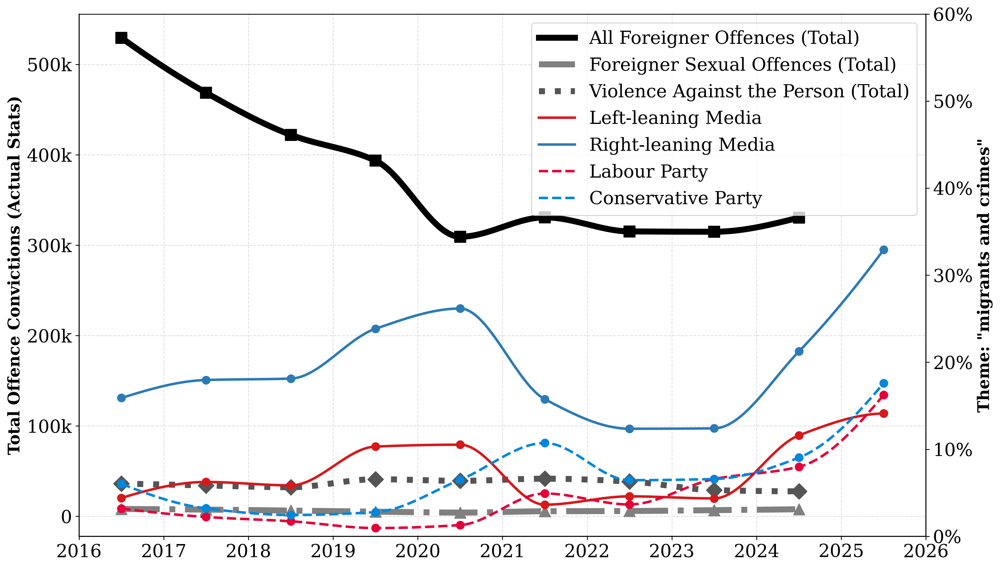

In [16]:
# ==========================================
# 1. Macro & Setup
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy.interpolate import PchipInterpolator

# MACRO: Set to False to disable theme plotting and the secondary axis
INCLUDE_THEMES = True 

def format_counts(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:g}m'
    elif x >= 1e3:
        return f'{x*1e-3:g}k'
    else:
        return f'{x:g}'

def get_smooth_curves(df_year, df_val):
    x_pts = df_year.values + 0.5
    y_pts = df_val.values
    if len(x_pts) >= 4:
        x_sm = np.linspace(x_pts.min(), x_pts.max(), 300)
        y_sm = np.maximum(PchipInterpolator(x_pts, y_pts)(x_sm), 0)
    else:
        x_sm, y_sm = x_pts, y_pts
    return x_pts, y_pts, x_sm, y_sm

DATA_DIR = "data/real-stats/"

# ==========================================
# 2. Fetch Real-World Conviction Data
# ==========================================
file_name = "OII conviction rates.xlsx"
df_conv = pd.read_excel(os.path.join(DATA_DIR, file_name), sheet_name="Conviction rates", header=0)
df_conv = df_conv.dropna(subset=["Year", "Offence", "Total"])
df_conv["Year"] = df_conv["Year"].astype(int)

# Filter for the specific offences and extract Total convictions
target_years = df_conv[(df_conv["Year"] >= 2016) & (df_conv["Year"] <= 2026)]
all_off = target_years[target_years["Offence"] == "All offences"].sort_values("Year")
sex_off = target_years[target_years["Offence"] == "Sexual offences"].sort_values("Year")
vio_off = target_years[target_years["Offence"] == "Violence against the person"].sort_values("Year")

# ==========================================
# 3. Fetch Theme Evolution Data 
# ==========================================
TARGET_THEME_CRIMES = "migrants and crimes"

if INCLUDE_THEMES:
    MODEL = "Ensemble"
    START_DATE = "2016-01-01"
    END_DATE = "2025-12-31"

    TAXONOMY_VERSION = None
    if "version" in themes_df.columns:
        vv = pd.to_numeric(themes_df["version"], errors="coerce").dropna()
        if not vv.empty:
            TAXONOMY_VERSION = int(vv.max())

    def get_theme_data(domains, target_theme):
        t = themes_df[
            (themes_df["model"] == MODEL) &
            (themes_df["source_domain"].isin(domains)) &
            (themes_df["month"] >= pd.to_datetime(START_DATE)) &
            (themes_df["month"] <= pd.to_datetime(END_DATE))
        ].copy()
        
        if "version" in t.columns and TAXONOMY_VERSION is not None:
            tver = pd.to_numeric(t["version"], errors="coerce")
            t = t[tver == int(TAXONOMY_VERSION)].copy()
            
        t = t[t["theme"] == target_theme].copy()
        if t.empty: return pd.DataFrame(columns=["year", "prevalence"])
        
        t["year"] = t["month"].dt.year
        theme_counts = t.groupby(["year"], as_index=False)["count"].sum().rename(columns={"count": "articles"})
        
        s = stance_df[
            (stance_df["model"] == MODEL) &
            (stance_df["source_domain"].isin(domains)) &
            (stance_df["month"] >= pd.to_datetime(START_DATE)) &
            (stance_df["month"] <= pd.to_datetime(END_DATE)) &
            (stance_df["stance"].isin(["OPEN", "RESTRICTIVE", "NEUTRAL"]))
        ].copy()
        
        if s.empty: return pd.DataFrame(columns=["year", "prevalence"])
        s["year"] = s["month"].dt.year
        yearly_totals = s.groupby("year", as_index=False)["count"].sum().rename(columns={"count": "total"})
        
        out = theme_counts.merge(yearly_totals, on="year", how="left")
        out["prevalence"] = np.where(out["total"] > 0, out["articles"] / out["total"], 0.0)
        return out.sort_values("year")

    UK_LEFT_WING = ["theguardian.com", "mirror.co.uk", "independent.co.uk", "huffingtonpost.co.uk", "dailyrecord.co.uk", "thenational.scot", "heraldscotland.com"]
    UK_RIGHT_WING = ["telegraph.co.uk", "dailymail.co.uk", "express.co.uk", "thesun.co.uk", "spectator.co.uk", "thetimes.co.uk", "thescottishsun.co.uk"]
    UK_LABOUR = ["UK Parliament (Lab)"]
    UK_CONSERVATIVE = ["UK Parliament (Con)"]

    df_left_crimes = get_theme_data(UK_LEFT_WING, TARGET_THEME_CRIMES)
    df_right_crimes = get_theme_data(UK_RIGHT_WING, TARGET_THEME_CRIMES)
    df_lab_crimes = get_theme_data(UK_LABOUR, TARGET_THEME_CRIMES)
    df_con_crimes = get_theme_data(UK_CONSERVATIVE, TARGET_THEME_CRIMES)

# ==========================================
# 4. Plot Configuration
# ==========================================
fig, ax1 = plt.subplots(figsize=(14, 8))

# Axis spine formatting (black lines)
ax1.spines['bottom'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['bottom'].set_linewidth(1.0)
ax1.spines['left'].set_visible(True)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_linewidth(1.0)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Calculate Real-world curves
x_p_all, y_p_all, x_s_all, y_s_all = get_smooth_curves(all_off["Year"], all_off["Total"])
x_p_sex, y_p_sex, x_s_sex, y_s_sex = get_smooth_curves(sex_off["Year"], sex_off["Total"])
x_p_vio, y_p_vio, x_s_vio, y_s_vio = get_smooth_curves(vio_off["Year"], vio_off["Total"])

# Proxy artist lines for the legend WITHOUT MARKERS
ax1.plot([], [], color="black", linewidth=6, label="All Foreigner Offences (Total)")
ax1.plot([], [], color="gray", linewidth=6, linestyle="dashdot", label="Foreigner Sexual Offences (Total)")
ax1.plot([], [], color="#555555", linewidth=6, linestyle="dotted", label="Violence Against the Person (Total)")

# Plot Real-world Stats lines and points (Left Axis)
ax1.plot(x_s_all, y_s_all, color="black", linewidth=6, zorder=2)
ax1.scatter(x_p_all, y_p_all, color="black", s=120, marker="s", zorder=3)

ax1.plot(x_s_sex, y_s_sex, color="gray", linewidth=6, linestyle="dashdot", zorder=2)
ax1.scatter(x_p_sex, y_p_sex, color="gray", s=120, marker="^", zorder=3)

ax1.plot(x_s_vio, y_s_vio, color="#555555", linewidth=6, linestyle="dotted", zorder=2)
ax1.scatter(x_p_vio, y_p_vio, color="#555555", s=120, marker="D", zorder=3)

ax1.set_ylabel("Total Offence Convictions (Actual Stats)", fontsize=16, color="black", fontweight="bold")
ax1.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))
ax1.tick_params(axis='y', labelsize=18, labelcolor="black")
ax1.tick_params(axis='x', labelsize=18)
ax1.set_xticks(np.arange(2016, 2027))
ax1.set_xlim(2016, 2026)
ax1.grid(True, linestyle="--", alpha=0.4)

if INCLUDE_THEMES:
    # Plot Theme Prevalence (Right Axis)
    ax2 = ax1.twinx()
    
    # Axis spine formatting for right axis
    ax2.spines['right'].set_visible(True)
    ax2.spines['right'].set_color('black')
    ax2.spines['right'].set_linewidth(1.0)
    # ax2.spines['top'].set_visible(False)
    ax2.spines['left'].set_visible(False)
    ax2.spines['bottom'].set_visible(False)
    
    narrative_configs = [
        (df_left_crimes,  '#d7191c', 'solid',  "Left-leaning Media"),
        (df_right_crimes, '#2c7bb6', 'solid',  "Right-leaning Media"),
        (df_lab_crimes,   '#E4003B', 'dashed', "Labour Party"),
        (df_con_crimes,   '#0087DC', 'dashed', "Conservative Party")
    ]

    for d_theme, c, style, lbl in narrative_configs:
        if d_theme.empty: continue
        
        x_pts, y_pts, x_sm, y_sm = get_smooth_curves(d_theme["year"], d_theme["prevalence"])
            
        # Proxy artist line for narrative legends WITHOUT MARKERS
        ax2.plot([], [], color=c, linestyle=style, linewidth=2.5, label=lbl)
        
        # Adding actual theme lines and markers
        ax2.plot(x_sm, y_sm, color=c, linestyle=style, linewidth=2.5, zorder=2)
        ax2.scatter(x_pts, y_pts, color=c, s=60, marker="o", zorder=3)

    # Format secondary y-axis 
    ax2.set_ylabel(f'Theme: "{TARGET_THEME_CRIMES}"', fontsize=16, color="black", fontweight="bold")
    ax2.tick_params(axis='y', labelsize=18, labelcolor="black")
    ax2.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0, decimals=0))
    ax2.set_ylim(0, 0.60) # Fixed range to 60%

    # Combine Legends (Inside upper-right)
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, fontsize=18, loc="upper right")
else:
    ax1.legend(fontsize=18, loc="upper right")


z = "with_theme" if INCLUDE_THEMES else "no_theme"
output_path = os.path.join(OUTPUT_DIR, f"real-world_stats/total_convictions_{z}.png")
os.makedirs(os.path.dirname(output_path), exist_ok=True)

plt.tight_layout()
plt.savefig(output_path, dpi=350, bbox_inches='tight')
plt.show()

## Public Opinion

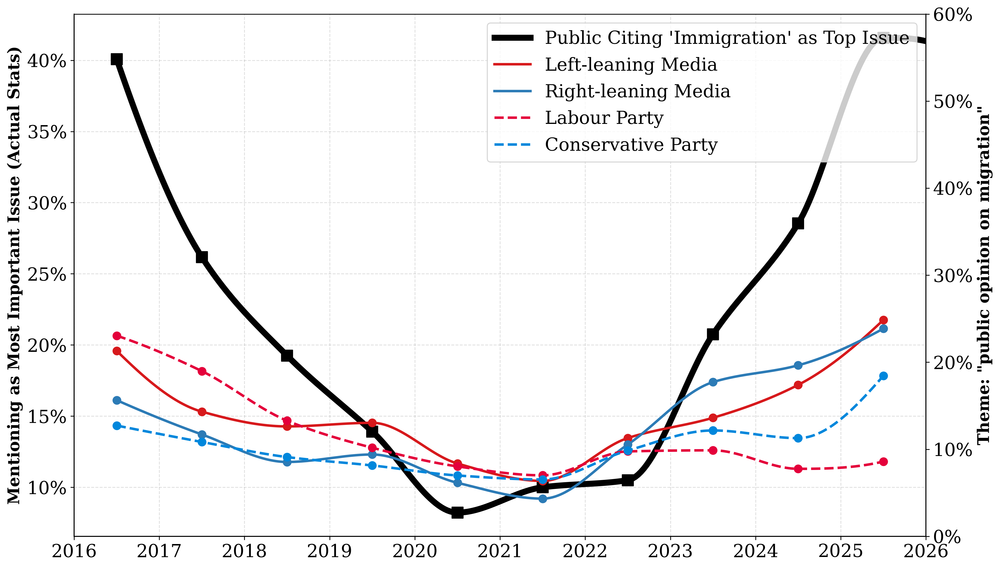

In [2]:
# ==========================================
# 1. Macro & Setup
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy.interpolate import PchipInterpolator

# MACRO: Set to False to disable theme plotting and the secondary axis
INCLUDE_THEMES = True 

def format_percentage(x, pos):
    return f"{int(x)}%"

def get_smooth_curves(df_year, df_val):
    x_pts = df_year.values + 0.5
    y_pts = df_val.values
    if len(x_pts) >= 4:
        x_sm = np.linspace(x_pts.min(), x_pts.max(), 300)
        y_sm = np.maximum(PchipInterpolator(x_pts, y_pts)(x_sm), 0)
    else:
        x_sm, y_sm = x_pts, y_pts
    return x_pts, y_pts, x_sm, y_sm

DATA_DIR = "data/real-stats/"

# ==========================================
# 2. Fetch Real-World Public Opinion Data
# ==========================================
file_name = "opinion-polls-most-important-issue-in-UK-Ipsos.xlsx"
df_opinion = pd.read_excel(os.path.join(DATA_DIR, file_name), sheet_name="Sheet1", header=0)
df_opinion.columns = ["Date", "EU", "Defence", "Economy", "Housing", "NHS", "Immigration"]
df_opinion["Date"] = pd.to_datetime(df_opinion["Date"])
df_opinion = df_opinion.dropna(subset=["Date", "Immigration"])

# Extract Year and aggregate by taking the annual mean percentage
df_opinion["Year"] = df_opinion["Date"].dt.year
target_years = df_opinion[(df_opinion["Year"] >= 2016) & (df_opinion["Year"] <= 2026)]
yearly_opinion = target_years.groupby("Year", as_index=False)["Immigration"].mean().sort_values("Year")

# ==========================================
# 3. Fetch Theme Evolution Data 
# ==========================================
TARGET_THEME_OPINION = "public opinion on migration"

if INCLUDE_THEMES:
    MODEL = "Ensemble"
    START_DATE = "2016-01-01"
    END_DATE = "2025-12-31"

    TAXONOMY_VERSION = None
    if "version" in themes_df.columns:
        vv = pd.to_numeric(themes_df["version"], errors="coerce").dropna()
        if not vv.empty:
            TAXONOMY_VERSION = int(vv.max())

    def get_theme_data(domains, target_theme):
        t = themes_df[
            (themes_df["model"] == MODEL) &
            (themes_df["source_domain"].isin(domains)) &
            (themes_df["month"] >= pd.to_datetime(START_DATE)) &
            (themes_df["month"] <= pd.to_datetime(END_DATE))
        ].copy()
        
        if "version" in t.columns and TAXONOMY_VERSION is not None:
            tver = pd.to_numeric(t["version"], errors="coerce")
            t = t[tver == int(TAXONOMY_VERSION)].copy()
            
        t = t[t["theme"] == target_theme].copy()
        if t.empty: return pd.DataFrame(columns=["year", "prevalence"])
        
        t["year"] = t["month"].dt.year
        theme_counts = t.groupby(["year"], as_index=False)["count"].sum().rename(columns={"count": "articles"})
        
        s = stance_df[
            (stance_df["model"] == MODEL) &
            (stance_df["source_domain"].isin(domains)) &
            (stance_df["month"] >= pd.to_datetime(START_DATE)) &
            (stance_df["month"] <= pd.to_datetime(END_DATE)) &
            (stance_df["stance"].isin(["OPEN", "RESTRICTIVE", "NEUTRAL"]))
        ].copy()
        
        if s.empty: return pd.DataFrame(columns=["year", "prevalence"])
        s["year"] = s["month"].dt.year
        yearly_totals = s.groupby("year", as_index=False)["count"].sum().rename(columns={"count": "total"})
        
        out = theme_counts.merge(yearly_totals, on="year", how="left")
        out["prevalence"] = np.where(out["total"] > 0, out["articles"] / out["total"], 0.0)
        return out.sort_values("year")

    UK_LEFT_WING = ["theguardian.com", "mirror.co.uk", "independent.co.uk", "huffingtonpost.co.uk", "dailyrecord.co.uk", "thenational.scot", "heraldscotland.com"]
    UK_RIGHT_WING = ["telegraph.co.uk", "dailymail.co.uk", "express.co.uk", "thesun.co.uk", "spectator.co.uk", "thetimes.co.uk", "thescottishsun.co.uk"]
    UK_LABOUR = ["UK Parliament (Lab)"]
    UK_CONSERVATIVE = ["UK Parliament (Con)"]

    df_left_opinion = get_theme_data(UK_LEFT_WING, TARGET_THEME_OPINION)
    df_right_opinion = get_theme_data(UK_RIGHT_WING, TARGET_THEME_OPINION)
    df_lab_opinion = get_theme_data(UK_LABOUR, TARGET_THEME_OPINION)
    df_con_opinion = get_theme_data(UK_CONSERVATIVE, TARGET_THEME_OPINION)

# ==========================================
# 4. Plot Configuration
# ==========================================
fig, ax1 = plt.subplots(figsize=(14, 8))

# Axis spine formatting (black lines)
ax1.spines['bottom'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['bottom'].set_linewidth(1.0)
ax1.spines['left'].set_visible(True)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_linewidth(1.0)
# ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Calculate Real-world curves for public opinion (Immigration)
x_p_imm, y_p_imm, x_s_imm, y_s_imm = get_smooth_curves(yearly_opinion["Year"], yearly_opinion["Immigration"])

# Proxy artist line for the legend WITHOUT MARKERS
ax1.plot([], [], color="black", linewidth=6, label="Public Citing 'Immigration' as Top Issue")

# Plot Real-world Stats lines and points (Left Axis)
ax1.plot(x_s_imm, y_s_imm, color="black", linewidth=6, zorder=2)
ax1.scatter(x_p_imm, y_p_imm, color="black", s=120, marker="s", zorder=3)

# Formatting Left Axis
ax1.set_ylabel("Mentioning as Most Important Issue (Actual Stats)", fontsize=16, color="black", fontweight="bold")
ax1.yaxis.set_major_formatter(mticker.FuncFormatter(format_percentage))
ax1.tick_params(axis='y', labelsize=18, labelcolor="black")
ax1.tick_params(axis='x', labelsize=18)
ax1.set_xticks(np.arange(2016, 2027))
ax1.set_xlim(2016, 2026)
ax1.grid(True, linestyle="--", alpha=0.4)

if INCLUDE_THEMES:
    # Plot Theme Prevalence (Right Axis)
    ax2 = ax1.twinx()
    
    # Axis spine formatting for right axis
    ax2.spines['right'].set_visible(True)
    ax2.spines['right'].set_color('black')
    ax2.spines['right'].set_linewidth(1.0)
    ax2.spines['top'].set_visible(False)
    ax2.spines['left'].set_visible(False)
    ax2.spines['bottom'].set_visible(False)
    
    narrative_configs = [
        (df_left_opinion,  '#d7191c', 'solid',  "Left-leaning Media"),
        (df_right_opinion, '#2c7bb6', 'solid',  "Right-leaning Media"),
        (df_lab_opinion,   '#E4003B', 'dashed', "Labour Party"),
        (df_con_opinion,   '#0087DC', 'dashed', "Conservative Party")
    ]

    for d_theme, c, style, lbl in narrative_configs:
        if d_theme.empty: continue
        
        x_pts, y_pts, x_sm, y_sm = get_smooth_curves(d_theme["year"], d_theme["prevalence"])
            
        # Proxy artist line for narrative legends WITHOUT MARKERS
        ax2.plot([], [], color=c, linestyle=style, linewidth=2.5, label=lbl)
        
        # Adding actual theme lines and markers
        ax2.plot(x_sm, y_sm, color=c, linestyle=style, linewidth=2.5, zorder=2)
        ax2.scatter(x_pts, y_pts, color=c, s=60, marker="o", zorder=3)

    # Format secondary y-axis 
    ax2.set_ylabel(f'Theme: "{TARGET_THEME_OPINION}"', fontsize=16, color="black", fontweight="bold")
    ax2.tick_params(axis='y', labelsize=18, labelcolor="black")
    ax2.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0, decimals=0))
    ax2.set_ylim(0, 0.60) # Fixed range to 60%

    # Combine Legends
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, fontsize=18, loc="upper right")
else:
    ax1.legend(fontsize=18, loc="upper right")


z = "with_theme" if INCLUDE_THEMES else "no_theme"
output_path = os.path.join(OUTPUT_DIR, f"real-world_stats/public_opinion_immigration_{z}.png")
os.makedirs(os.path.dirname(output_path), exist_ok=True)

plt.tight_layout()
plt.savefig(output_path, dpi=350, bbox_inches='tight')
plt.show()

## Asylum Seeking

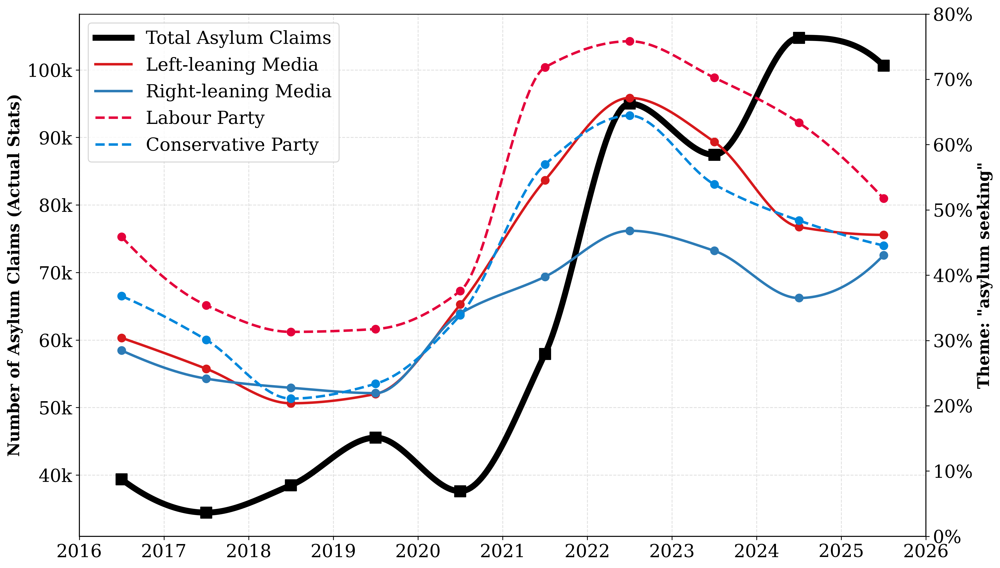

In [6]:
# ==========================================
# 1. Macro & Setup
# ==========================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
from scipy.interpolate import PchipInterpolator

# MACRO: Set to False to disable theme plotting and the secondary axis
INCLUDE_THEMES = True 

def format_counts(x, pos):
    if x >= 1e6:
        return f'{x*1e-6:g}m'
    elif x >= 1e3:
        return f'{x*1e-3:g}k'
    else:
        return f'{x:g}'

def get_smooth_curves(df_year, df_val):
    x_pts = df_year.values + 0.5
    y_pts = df_val.values
    if len(x_pts) >= 4:
        x_sm = np.linspace(x_pts.min(), x_pts.max(), 300)
        y_sm = np.maximum(PchipInterpolator(x_pts, y_pts)(x_sm), 0)
    else:
        x_sm, y_sm = x_pts, y_pts
    return x_pts, y_pts, x_sm, y_sm

DATA_DIR = "data/real-stats/"

# ==========================================
# 2. Fetch Real-World Asylum Data
# ==========================================
file_name = "asylum-claims-datasets-dec-2025.xlsx"
df_asylum = pd.read_excel(os.path.join(DATA_DIR, file_name), sheet_name="Data_Asy_D01", header=1)
df_asylum.columns = df_asylum.columns.str.strip()

df_asylum["Year"] = pd.to_numeric(df_asylum["Year"], errors="coerce")
df_asylum["Claims"] = pd.to_numeric(df_asylum["Claims"], errors="coerce")
df_asylum = df_asylum.dropna(subset=["Year", "Claims"])

# Aggregate by year
yearly_asylum = df_asylum.groupby("Year", as_index=False)["Claims"].sum().sort_values("Year")
yearly_asylum = yearly_asylum[(yearly_asylum["Year"] >= 2016) & (yearly_asylum["Year"] <= 2026)]

# ==========================================
# 3. Fetch Theme Evolution Data 
# ==========================================
TARGET_THEME_ASYLUM = "asylum seeking"

if INCLUDE_THEMES:
    MODEL = "Ensemble"
    START_DATE = "2016-01-01"
    END_DATE = "2025-12-31"

    TAXONOMY_VERSION = None
    if "version" in themes_df.columns:
        vv = pd.to_numeric(themes_df["version"], errors="coerce").dropna()
        if not vv.empty:
            TAXONOMY_VERSION = int(vv.max())

    def get_theme_data(domains, target_theme):
        t = themes_df[
            (themes_df["model"] == MODEL) &
            (themes_df["source_domain"].isin(domains)) &
            (themes_df["month"] >= pd.to_datetime(START_DATE)) &
            (themes_df["month"] <= pd.to_datetime(END_DATE))
        ].copy()
        
        if "version" in t.columns and TAXONOMY_VERSION is not None:
            tver = pd.to_numeric(t["version"], errors="coerce")
            t = t[tver == int(TAXONOMY_VERSION)].copy()
            
        t = t[t["theme"] == target_theme].copy()
        if t.empty: return pd.DataFrame(columns=["year", "prevalence"])
        
        t["year"] = t["month"].dt.year
        theme_counts = t.groupby(["year"], as_index=False)["count"].sum().rename(columns={"count": "articles"})
        
        s = stance_df[
            (stance_df["model"] == MODEL) &
            (stance_df["source_domain"].isin(domains)) &
            (stance_df["month"] >= pd.to_datetime(START_DATE)) &
            (stance_df["month"] <= pd.to_datetime(END_DATE)) &
            (stance_df["stance"].isin(["OPEN", "RESTRICTIVE", "NEUTRAL"]))
        ].copy()
        
        if s.empty: return pd.DataFrame(columns=["year", "prevalence"])
        s["year"] = s["month"].dt.year
        yearly_totals = s.groupby("year", as_index=False)["count"].sum().rename(columns={"count": "total"})
        
        out = theme_counts.merge(yearly_totals, on="year", how="left")
        out["prevalence"] = np.where(out["total"] > 0, out["articles"] / out["total"], 0.0)
        return out.sort_values("year")

    UK_LEFT_WING = ["theguardian.com", "mirror.co.uk", "independent.co.uk", "huffingtonpost.co.uk", "dailyrecord.co.uk", "thenational.scot", "heraldscotland.com"]
    UK_RIGHT_WING = ["telegraph.co.uk", "dailymail.co.uk", "express.co.uk", "thesun.co.uk", "spectator.co.uk", "thetimes.co.uk", "thescottishsun.co.uk"]
    UK_LABOUR = ["UK Parliament (Lab)"]
    UK_CONSERVATIVE = ["UK Parliament (Con)"]

    df_left_asylum = get_theme_data(UK_LEFT_WING, TARGET_THEME_ASYLUM)
    df_right_asylum = get_theme_data(UK_RIGHT_WING, TARGET_THEME_ASYLUM)
    df_lab_asylum = get_theme_data(UK_LABOUR, TARGET_THEME_ASYLUM)
    df_con_asylum = get_theme_data(UK_CONSERVATIVE, TARGET_THEME_ASYLUM)

# ==========================================
# 4. Plot Configuration
# ==========================================
fig, ax1 = plt.subplots(figsize=(14, 8))

# Axis spine formatting (black lines)
ax1.spines['bottom'].set_visible(True)
ax1.spines['bottom'].set_color('black')
ax1.spines['bottom'].set_linewidth(1.0)
ax1.spines['left'].set_visible(True)
ax1.spines['left'].set_color('black')
ax1.spines['left'].set_linewidth(1.0)
ax1.spines['right'].set_visible(False)

# Calculate Real-world curves for Asylum
x_p_asy, y_p_asy, x_s_asy, y_s_asy = get_smooth_curves(yearly_asylum["Year"], yearly_asylum["Claims"])

# Proxy artist line for the legend WITHOUT MARKERS
ax1.plot([], [], color="black", linewidth=6, label="Total Asylum Claims")

# Plot Real-world Stats lines and points (Left Axis)
ax1.plot(x_s_asy, y_s_asy, color="black", linewidth=6, zorder=2)
ax1.scatter(x_p_asy, y_p_asy, color="black", s=120, marker="s", zorder=3)

# Formatting Left Axis
ax1.set_ylabel("Number of Asylum Claims (Actual Stats)", fontsize=16, color="black", fontweight="bold")
ax1.yaxis.set_major_formatter(mticker.FuncFormatter(format_counts))
ax1.tick_params(axis='y', labelsize=18, labelcolor="black")
ax1.tick_params(axis='x', labelsize=18)
ax1.set_xticks(np.arange(2016, 2027))
ax1.set_xlim(2016, 2026)
ax1.grid(True, linestyle="--", alpha=0.4)

if INCLUDE_THEMES:
    # Plot Theme Prevalence (Right Axis)
    ax2 = ax1.twinx()
    
    # Axis spine formatting for right axis
    ax2.spines['right'].set_visible(True)
    ax2.spines['right'].set_color('black')
    ax2.spines['right'].set_linewidth(1.0)
    ax2.spines['top'].set_visible(False)
    ax2.spines['left'].set_visible(False)
    ax2.spines['bottom'].set_visible(False)
    
    narrative_configs = [
        (df_left_asylum,  '#d7191c', 'solid',  "Left-leaning Media"),
        (df_right_asylum, '#2c7bb6', 'solid',  "Right-leaning Media"),
        (df_lab_asylum,   '#E4003B', 'dashed', "Labour Party"),
        (df_con_asylum,   '#0087DC', 'dashed', "Conservative Party")
    ]

    for d_theme, c, style, lbl in narrative_configs:
        if d_theme.empty: continue
        
        x_pts, y_pts, x_sm, y_sm = get_smooth_curves(d_theme["year"], d_theme["prevalence"])
            
        ax2.plot([], [], color=c, linestyle=style, linewidth=2.5, label=lbl)
        ax2.plot(x_sm, y_sm, color=c, linestyle=style, linewidth=2.5, zorder=2)
        ax2.scatter(x_pts, y_pts, color=c, s=60, marker="o", zorder=3)

    # Format secondary y-axis 
    ax2.set_ylabel(f'Theme: "{TARGET_THEME_ASYLUM}"', fontsize=16, color="black", fontweight="bold")
    ax2.tick_params(axis='y', labelsize=18, labelcolor="black")
    ax2.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0, decimals=0))
    ax2.set_ylim(0, 0.80) # Fixed range to 60%

    # Combine Legends
    lines_1, labels_1 = ax1.get_legend_handles_labels()
    lines_2, labels_2 = ax2.get_legend_handles_labels()
    ax1.legend(lines_1 + lines_2, labels_1 + labels_2, fontsize=18, loc="upper left")
else:
    ax1.legend(fontsize=18, loc="upper left")


z = "with_theme" if INCLUDE_THEMES else "no_theme"
output_path = os.path.join(OUTPUT_DIR, f"real-world_stats/asylum_claims_{z}.png")
os.makedirs(os.path.dirname(output_path), exist_ok=True)

plt.tight_layout()
plt.savefig(output_path, dpi=350, bbox_inches='tight')
plt.show()